In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib_inline 
import seaborn as sns
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import r2_score
import warnings
warnings.filterwarnings("ignore")

In [2]:
lic_sales = pd.read_excel('Sales.xlsx', sheet_name='Sales')
lic_sales.head()

,CustID,AgentBonus,Age,CustTenure,Channel,Occupation,EducationField,Gender,ExistingProdType,Designation,NumberOfPolicy,MaritalStatus,MonthlyIncome,Complaint,ExistingPolicyTenure,SumAssured,Zone,PaymentMethod,LastMonthCalls,CustCareScore
0,7000000,4409,22.0,4.0,Agent,Salaried,Graduate,Female,3,Manager,2.0,Single,20993.0,1,2.0,806761.0,North,Half Yearly,5,2.0
1,7000001,2214,11.0,2.0,Third Party Partner,Salaried,Graduate,Male,4,Manager,4.0,Divorced,20130.0,0,3.0,294502.0,North,Yearly,7,3.0
2,7000002,4273,26.0,4.0,Agent,Free Lancer,Post Graduate,Male,4,Exe,3.0,Unmarried,17090.0,1,2.0,NaN,North,Yearly,0,3.0
3,7000003,1791,11.0,NaN,Third Party Partner,Salaried,Graduate,Fe male,3,Executive,3.0,Divorced,17909.0,1,2.0,268635.0,West,Half Yearly,0,5.0
4,7000004,2955,6.0,NaN,Agent,Small Business,UG,Male,3,Executive,4.0,Divorced,18468.0,0,4.0,366405.0,West,Half Yearly,2,5.0


<table align="left">
  <tr>
    <th align="left">Variable</th>
    <th align="left">Description</th>
  </tr>
  <tr>
    <td align="left">CustID</td>
    <td align="left">Unique customer ID</td>
  </tr>
  <tr>
    <td align="left">AgentBonus</td>
    <td align="left">Bonus amount given to each agents in last month</td>
  </tr>
  <tr>
    <td align='left'>Age</td>
    <td align='left'>Age of customer</td>
  </tr>
  <tr>
    <td>CustTenure</td>
    <td>Tenure of customer in organization</td>
  </tr>  
  <tr>
    <td>Channel</td>
    <td>Channel through which acquisition of customer is done</td>
  </tr>   
  <tr>
    <td>Occupation</td>
    <td>Occupation of customer</td>
  </tr>   
  <tr>
    <td>EducationField</td>
    <td>Field of education of customer</td>
  </tr>  
  <tr>
    <td>Designation</td>
    <td>Designation of customer in their organization</td>
  </tr>    
  <tr>
    <td>NumberOfPolicy</td>
    <td>Total number of existing policy of a customer</td>
  </tr>    
  <tr>
    <td>MaritalStatus</td>
    <td>Marital status of customer</td>
  </tr>  
  <tr>
    <td>MonthlyIncome</td>
    <td>Gross monthly income of customer</td>
  </tr>   
  <tr>
    <td>Complaint</td>
    <td>Indicator of complaint registered in last one month by customer</td>
  </tr>  
  <tr>
    <td>ExistingPolicyTenure</td>
    <td>Max tenure in all existing policies of customer</td>
  </tr>     
  <tr>
    <td>SumAssured</td>
    <td>Max of sum assured in all existing policies of customer</td>
  </tr>  
  <tr>
    <td>Zone</td>
    <td>Customer belongs to which zone in India. Like East, West, North and South</td>
  </tr>   
  <tr>
    <td>PaymentMethod</td>
    <td>Frequency of payment selected by customer like Monthly, quarterly, half yearly and yearly</td>
  </tr>   
  <tr>
    <td>LastMonthCalls</td>
    <td>Total calls attempted by company to a customer for cross sell</td>
  </tr>  
  <tr>
    <td>CustCareScore</td>
    <td>Customer satisfaction score given by customer in previous service call</td>
  </tr>  
</table>

In [3]:
lic_sales.shape

(4520, 20)

<b> <font color='Blue'>  The given dataset contains 4520 observations with 20 features </font> </b>

In [4]:
lic_sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4520 entries, 0 to 4519
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   CustID                4520 non-null   int64  
 1   AgentBonus            4520 non-null   int64  
 2   Age                   4251 non-null   float64
 3   CustTenure            4294 non-null   float64
 4   Channel               4520 non-null   object 
 5   Occupation            4520 non-null   object 
 6   EducationField        4520 non-null   object 
 7   Gender                4520 non-null   object 
 8   ExistingProdType      4520 non-null   int64  
 9   Designation           4520 non-null   object 
 10  NumberOfPolicy        4475 non-null   float64
 11  MaritalStatus         4520 non-null   object 
 12  MonthlyIncome         4284 non-null   float64
 13  Complaint             4520 non-null   int64  
 14  ExistingPolicyTenure  4336 non-null   float64
 15  SumAssured           

<b> <font color='Blue'>  1. There are 7 float, 5 integers and 8 object datatypes in given dataset </font> </b> 

<b> <font color='Blue'>  2. Age, CustTenure, NumberOfPolicy, MonthlyIncome, ExistingPolicyTenure, SumAssured and CustCareScore has missing values </font> </b>

In [5]:
lic_sales.describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
CustID,4520.0,7002259.50,1304.96,7000000.0,7001129.75,7002259.5,7003389.25,7004519.0
AgentBonus,4520.0,4077.84,1403.32,1605.0,3027.75,3911.5,4867.25,9608.0
Age,4251.0,14.49,9.04,2.0,7.00,13.0,20.00,58.0
CustTenure,4294.0,14.47,8.96,2.0,7.00,13.0,20.00,57.0
ExistingProdType,4520.0,3.69,1.02,1.0,3.00,4.0,4.00,6.0
NumberOfPolicy,4475.0,3.57,1.46,1.0,2.00,4.0,5.00,6.0
MonthlyIncome,4284.0,22890.31,4885.60,16009.0,19683.50,21606.0,24725.00,38456.0
Complaint,4520.0,0.29,0.45,0.0,0.00,0.0,1.00,1.0
ExistingPolicyTenure,4336.0,4.13,3.35,1.0,2.00,3.0,6.00,25.0
SumAssured,4366.0,619999.70,246234.82,168536.0,439443.25,578976.5,758236.00,1838496.0


In [6]:
lic_sales.describe(include='O').T

,count,unique,top,freq
Channel,4520,3,Agent,3194
Occupation,4520,5,Salaried,2192
EducationField,4520,7,Graduate,1870
Gender,4520,3,Male,2688
Designation,4520,6,Manager,1620
MaritalStatus,4520,4,Married,2268
Zone,4520,4,West,2566
PaymentMethod,4520,4,Half Yearly,2656


<b> <font color='Blue'>  1. Skewness is observed in AgentBonus </font> </b>

<b> <font color='Blue'>  2. Agent channel is appearing most of times than other channel types </font> </b>

<b> <font color='Blue'>  3. Married customers appearing more than singles, male customers are high in number than other genders.  </font> </b>

In [7]:
lic_sales.isnull().sum()

CustID                    0
AgentBonus                0
Age                     269
CustTenure              226
Channel                   0
Occupation                0
EducationField            0
Gender                    0
ExistingProdType          0
Designation               0
NumberOfPolicy           45
MaritalStatus             0
MonthlyIncome           236
Complaint                 0
ExistingPolicyTenure    184
SumAssured              154
Zone                      0
PaymentMethod             0
LastMonthCalls            0
CustCareScore            52
dtype: int64

In [8]:
lic_sales.isnull().sum().sum()

1166

In [9]:
1166/4520

0.2579646017699115

In [10]:
lic_sales.duplicated().sum()

0

<b> <font color='Blue'>  1. There are 269, 226, 45, 236, 184, 154 and 52 missing values in Age, CustTenure, NumberOfPolicy, MonthlyIncome, ExistingPolicyTenure, SumAssured and CustCareScore respectively  </font> </b>

<b> <font color='Blue'> 2. Total number of missing observations in given dataset is 1166 </font> </b>

<b> <font color='Blue'> 3. 25% of total observations are empty or null </font> </b>

<b> <font color='Blue'> 4. No duplicates found in the dataset </font> </b>

In [11]:
lic_sales.groupby(['Gender','Designation'])['Designation'].count()

Gender   Designation   
Fe male  Executive         182
         Manager           143
Female   AVP               160
         Exe                51
         Executive         379
         Manager           551
         Senior Manager    294
         VP                 72
Male     AVP               176
         Exe                76
         Executive         974
         Manager           926
         Senior Manager    382
         VP                154
Name: Designation, dtype: int64

In [12]:
lic_sales.groupby(['Designation','MaritalStatus'])['MaritalStatus'].count()

Designation     MaritalStatus
AVP             Divorced          82
                Married          172
                Single            82
Exe             Divorced          26
                Married           61
                Unmarried         40
Executive       Divorced         250
                Married          709
                Single           428
                Unmarried        148
Manager         Divorced         284
                Married          826
                Single           504
                Unmarried          6
Senior Manager  Divorced         118
                Married          368
                Single           190
VP              Divorced          44
                Married          132
                Single            50
Name: MaritalStatus, dtype: int64

<b> <font color='Blue'> Dataset has Fe male and Female, it appears naming issue needs correction </font> </b>

<b> <font color='Blue'> Designation has Exe and Executive, it appears naming issue needs correction </font> </b>

In [13]:
lic_sales.groupby(['EducationField'])['AgentBonus'].sum()

EducationField
Diploma           2062359
Engineer          1595664
Graduate          7670951
MBA                304659
Post Graduate     1019402
UG                 737063
Under Graduate    5041731
Name: AgentBonus, dtype: int64

In [14]:
lic_sales.groupby(['Channel'])['NumberOfPolicy'].sum()

Channel
Agent                  11331.0
Online                  1628.0
Third Party Partner     2996.0
Name: NumberOfPolicy, dtype: float64

In [15]:
lic_sales.groupby(['Occupation'])['NumberOfPolicy'].sum()

Occupation
Free Lancer           7.0
Laarge Business     572.0
Large Business      906.0
Salaried           7608.0
Small Business     6862.0
Name: NumberOfPolicy, dtype: float64

<b> <font color='Blue'> Agents has sold 11311 policies to the customer in given dataset and they are the highest sellers compared to other channels </font> </b>

In [16]:
lic_sales.groupby('MaritalStatus')['CustTenure'].apply(lambda x: (x>10).sum()).reset_index(name='count')

,MaritalStatus,count
0,Divorced,469
1,Married,1328
2,Single,730
3,Unmarried,64


<b> <font color='Blue'> There are high number of married customer who maintain relation with company more than 10 years </font> </b>

<b> <font color='Blue'> Single and Unmarried , looks to be same  </font> </b>

In [17]:
lic_sales.groupby('Zone')['AgentBonus'].max()

Zone
East     8053
North    9600
South    5659
West     9608
Name: AgentBonus, dtype: int64

In [18]:
lic_sales.groupby(['Zone','CustCareScore'])['CustCareScore'].count()

Zone   CustCareScore
East   1.0               20
       2.0                6
       3.0               10
       4.0               14
       5.0               14
North  1.0              407
       2.0              203
       3.0              576
       4.0              300
       5.0              370
South  3.0                4
       4.0                2
West   1.0              501
       2.0              245
       3.0              777
       4.0              510
       5.0              509
Name: CustCareScore, dtype: int64

<b> <font color='Blue'> Highest Bonus for agent was given to West zone followed by North, South agents are receiving the lowest bonus. Probably, south zone agents are low performing agents </font> </b>

### Data Cleanup before performing EDA on Gender, Marital Status and Designation columns. 

<b> <font color='Blue'> Following are the changes </font> </b>

> <b> <font color='Blue'> 1. Fe male to Female </font> </b>

> <b> <font color='Blue'> 2. Exe to Executive </font> </b>

> <b> <font color='Blue'> 3. Single are treated as unmarried </font> </b>

> <b> <font color='Blue'> 4. UG as Under Graduate </font> </b>

> <b> <font color='Blue'> 5. Laarge Business to Large Business </font> </b>

> <b> <font color='Blue'> 6. Graduate to Under Graduate </font> </b>


In [19]:
lic_sales['Gender'] = lic_sales['Gender'].replace(['Fe male'],['Female'])
lic_sales['Designation'] = lic_sales['Designation'].replace(['Exe'],['Executive'])
lic_sales['MaritalStatus'] = lic_sales['MaritalStatus'].replace(['Single'],['Unmarried'])
lic_sales['EducationField'] = lic_sales['EducationField'].replace(['UG'],['Under Graduate'])
lic_sales['Occupation'] = lic_sales['Occupation'].replace(['Laarge Business'],['Large Business'])
lic_sales['EducationField'] = lic_sales['EducationField'].replace(['Graduate'],['Under Graduate'])
lic_sales.shape

(4520, 20)

#### Changing some feature that are categorical but python understood as continous variables

> 1. ExistingProdType

> 2. LastMonthCalls

> 3. CustCareScore

> 4. Complaints

In [20]:
lic_sales.groupby(['Gender','Designation'])['Designation'].count()

Gender  Designation   
Female  AVP                160
        Executive          612
        Manager            694
        Senior Manager     294
        VP                  72
Male    AVP                176
        Executive         1050
        Manager            926
        Senior Manager     382
        VP                 154
Name: Designation, dtype: int64

In [21]:
lic_sales.groupby(['Designation','MaritalStatus'])['MaritalStatus'].count()

Designation     MaritalStatus
AVP             Divorced          82
                Married          172
                Unmarried         82
Executive       Divorced         276
                Married          770
                Unmarried        616
Manager         Divorced         284
                Married          826
                Unmarried        510
Senior Manager  Divorced         118
                Married          368
                Unmarried        190
VP              Divorced          44
                Married          132
                Unmarried         50
Name: MaritalStatus, dtype: int64

In [22]:
lic_sales.groupby(['EducationField'])['AgentBonus'].count()

EducationField
Diploma            496
Engineer           408
MBA                 74
Post Graduate      252
Under Graduate    3290
Name: AgentBonus, dtype: int64

In [23]:
lic_sales.groupby(['Occupation'])['AgentBonus'].sum()

Occupation
Free Lancer          7971
Large Business    1602317
Salaried          8988618
Small Business    7832923
Name: AgentBonus, dtype: int64

In [24]:
lic_sales.groupby('MaritalStatus')['CustTenure'].apply(lambda x: (x>10).sum()).reset_index(name='count')

,MaritalStatus,count
0,Divorced,469
1,Married,1328
2,Unmarried,794


In [25]:
lic_sales['ExistingProdType']=lic_sales['ExistingProdType'].astype('object')
lic_sales['LastMonthCalls']=lic_sales['LastMonthCalls'].astype('object')
lic_sales['CustCareScore']=lic_sales['CustCareScore'].astype('object')
lic_sales['Complaint']=lic_sales['Complaint'].astype('object')
lic_sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4520 entries, 0 to 4519
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   CustID                4520 non-null   int64  
 1   AgentBonus            4520 non-null   int64  
 2   Age                   4251 non-null   float64
 3   CustTenure            4294 non-null   float64
 4   Channel               4520 non-null   object 
 5   Occupation            4520 non-null   object 
 6   EducationField        4520 non-null   object 
 7   Gender                4520 non-null   object 
 8   ExistingProdType      4520 non-null   object 
 9   Designation           4520 non-null   object 
 10  NumberOfPolicy        4475 non-null   float64
 11  MaritalStatus         4520 non-null   object 
 12  MonthlyIncome         4284 non-null   float64
 13  Complaint             4520 non-null   object 
 14  ExistingPolicyTenure  4336 non-null   float64
 15  SumAssured           

## Univariate Analysis

In [26]:
from vizad.univariate import plot_univariate_categorical, plot_univariate_numeric

In [27]:
num_cols = [col for col in lic_sales.columns if lic_sales[col].dtype != 'O']
cat_cols = [col for col in lic_sales.columns if lic_sales[col].dtype == 'O']
print('numeric columns:', num_cols)
print()
print('categorical columns:', cat_cols)

numeric columns: ['CustID', 'AgentBonus', 'Age', 'CustTenure', 'NumberOfPolicy', 'MonthlyIncome', 'ExistingPolicyTenure', 'SumAssured']

categorical columns: ['Channel', 'Occupation', 'EducationField', 'Gender', 'ExistingProdType', 'Designation', 'MaritalStatus', 'Complaint', 'Zone', 'PaymentMethod', 'LastMonthCalls', 'CustCareScore']


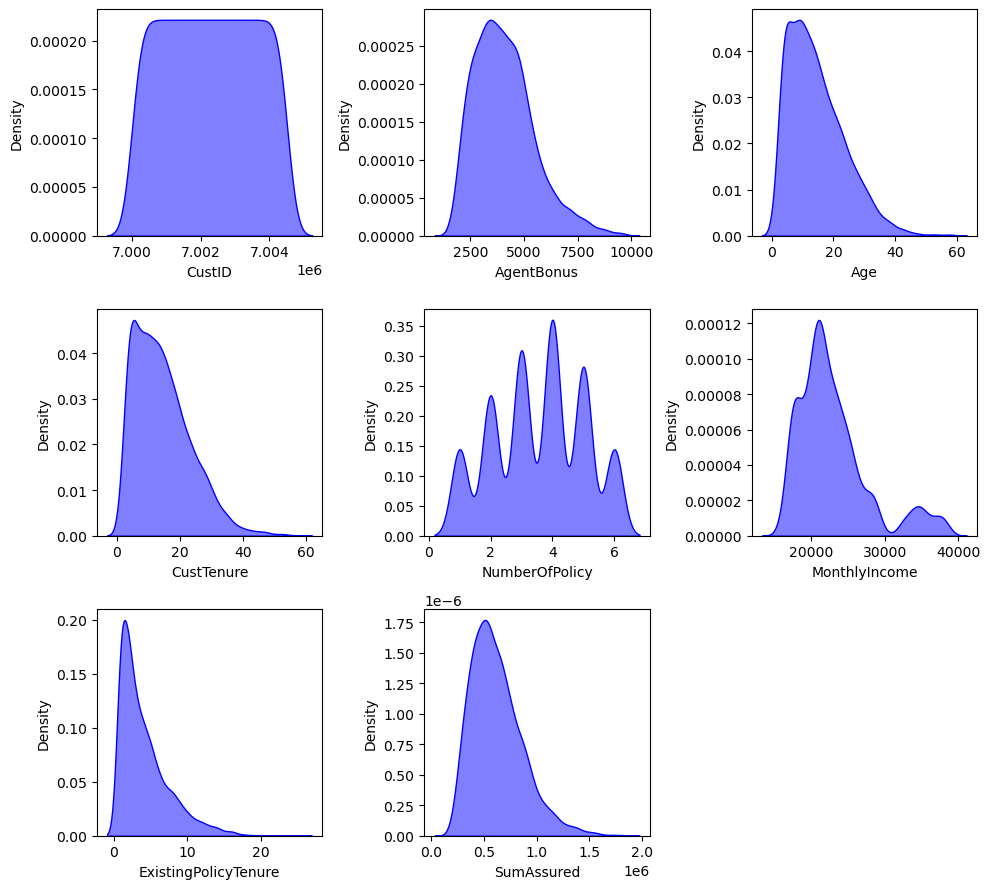

In [28]:
plot_univariate_numeric(lic_sales,num_cols,kind='density')

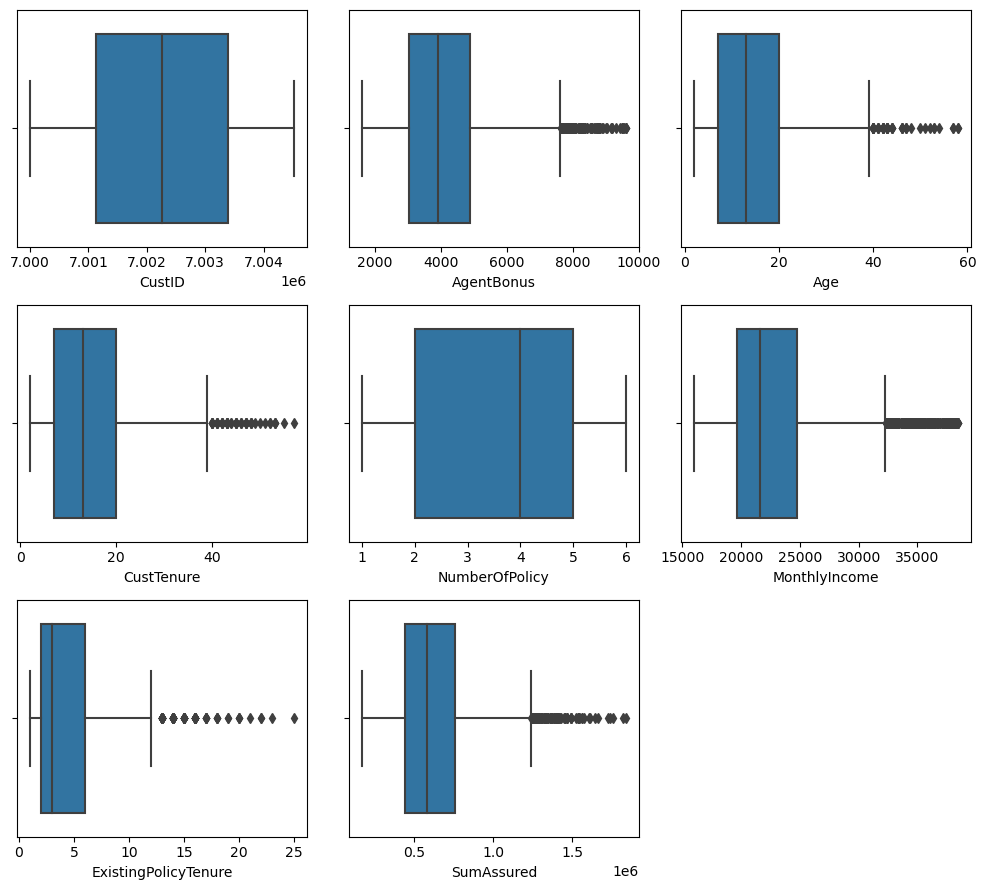

In [29]:
plot_univariate_numeric(lic_sales,num_cols,kind='box')

<b> <font color='Blue'> Outliers are observed in all features except NumberOfPolicy and CustID </font> </b>

<b> <font color='Blue'> CustID will be dropped since it has no value for our models </font> </b>

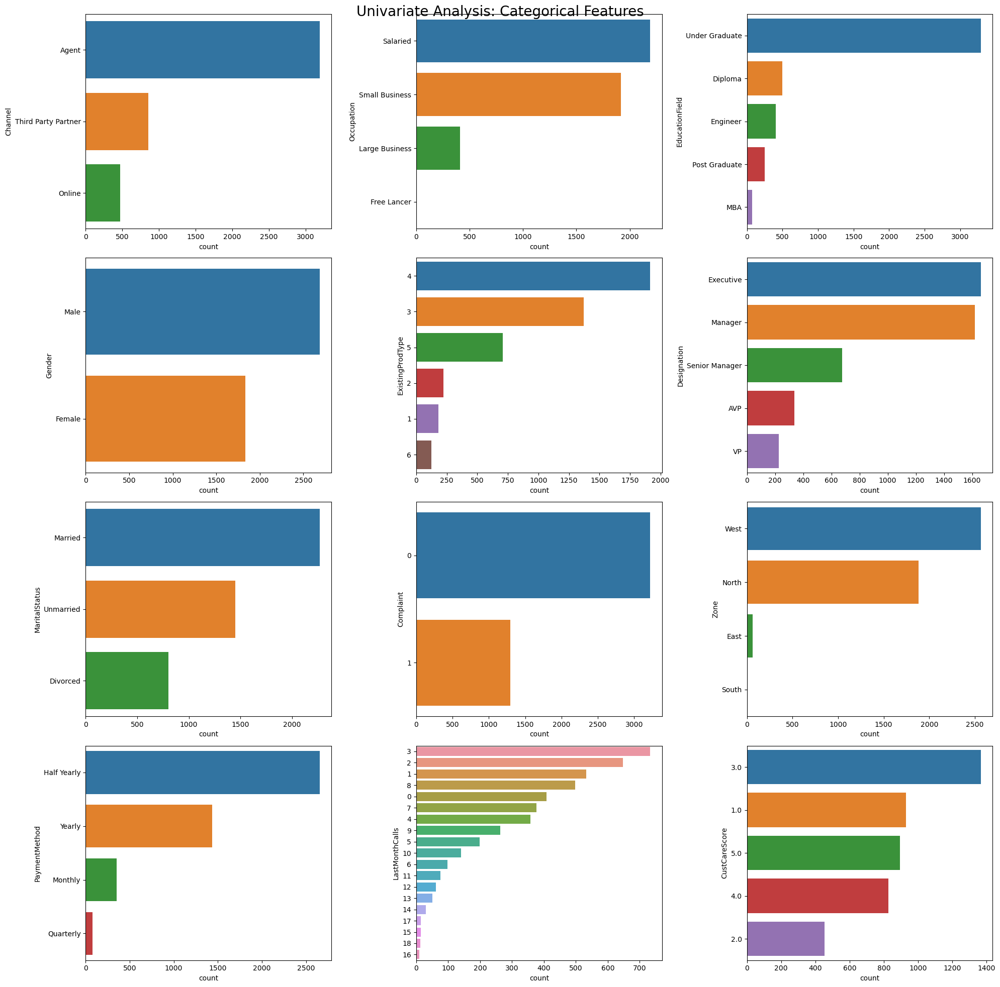

In [30]:
plot_univariate_categorical(lic_sales,cat_cols,figsize=(20,20));

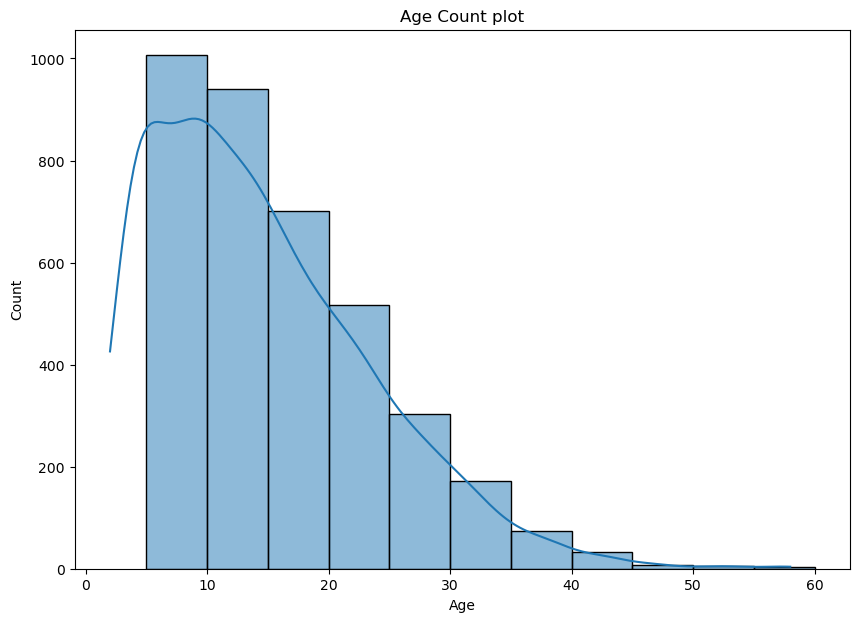

In [31]:
plt.figure(figsize=(10,7))
#sns.boxplot(y=lic_sales["Age"]);
sns.histplot(lic_sales["Age"], kde=True, bins=[5,10,15,20,25,30,35,40,45,50,55,60]);
plt.xlabel("Age")
plt.ylabel("Count")
plt.title("Age Count plot")
plt.show()

<b> <font color='Blue'> Customers with age lesser than 40 are more in given dataset </font> </b>

<b> <font color='Blue'> As customers age grow, the chances are less to avail any policy and premium will be too high </font> </b>

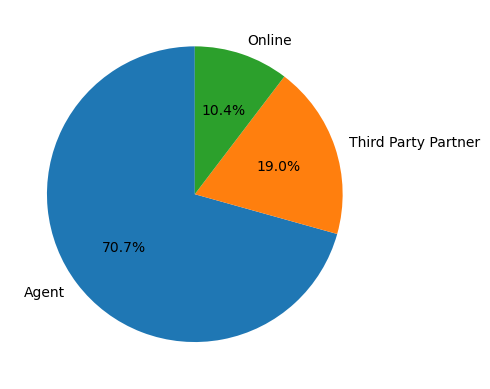

In [32]:
#sns.countplot(x=lic_sales["Channel"]);
plt.pie(lic_sales["Channel"].value_counts(), labels=lic_sales["Channel"].value_counts().index, autopct='%1.1f%%', startangle=90);

<b> <font color='Blue'> Dataset contains more observation for Agents selling insurance compared to other channels </font> </b>

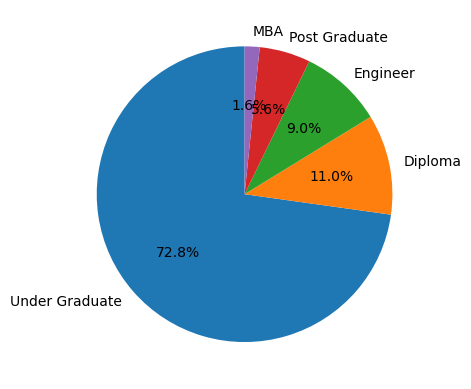

In [33]:
plt.pie(lic_sales["EducationField"].value_counts(), labels=lic_sales["EducationField"].value_counts().index, autopct='%1.1f%%', startangle=90);

<b> <font color = 'Blue'> Under graduate customers are more who were buying policy </font> </b>

<b> <font color = 'Blue'> MBA customers buying less insurance from the company </font> </b>

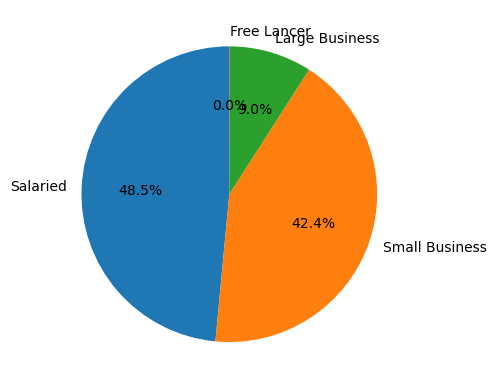

In [34]:
plt.pie(lic_sales["Occupation"].value_counts(), labels=lic_sales["Occupation"].value_counts().index, autopct='%1.1f%%', startangle=90);

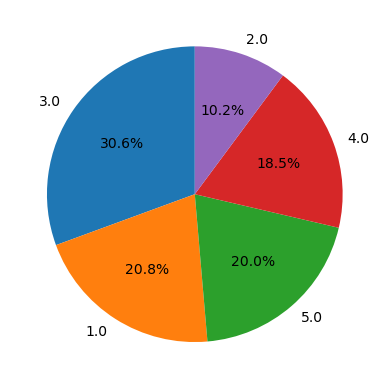

In [35]:
plt.pie(lic_sales["CustCareScore"].value_counts(), labels=lic_sales["CustCareScore"].value_counts().index, autopct='%1.1f%%', startangle=90);

<b> <font color = 'Blue'> Salaried customers are dense and second highest is small business customers </font> </b>

<b> <font color = 'Blue'> Free Lancer customers are rarely opting or buying insurance </font> </b>

# EDA Bivariate Analysis

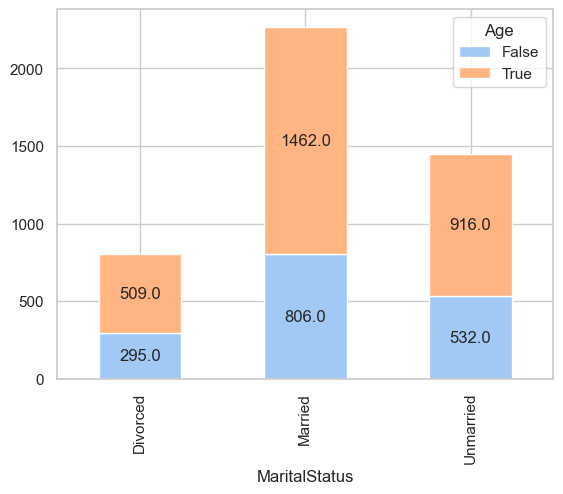

In [36]:
ct_marital=pd.crosstab(lic_sales["MaritalStatus"], lic_sales["Age"]<18)
sns.set(style="whitegrid")

ax = ct_marital.plot(kind='bar', stacked=True, color=sns.color_palette('pastel'))
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.text(x + width / 2, y + height / 2, f'{height}', 
            horizontalalignment='center', verticalalignment='center')
plt.show()

<b> <font color = 'Blue'> Considering 18 years as teens and not married. There are several customers holding insurance policy. These are indirectly understood as policy taken by parents </font> </b>

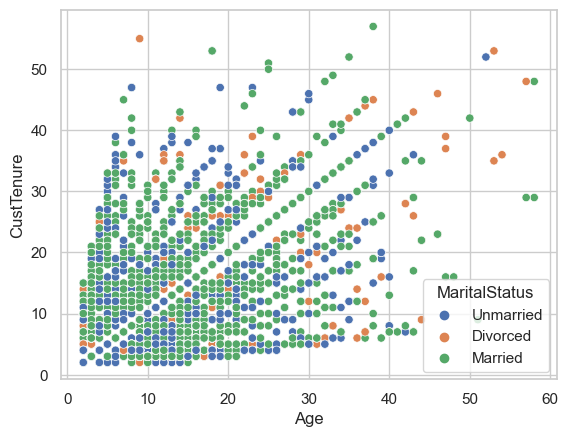

In [37]:
sns.scatterplot(x='Age',y='CustTenure',hue='MaritalStatus',data=lic_sales);

<b> <font color='Blue'> There are few observations that represents anomoly. </font> </b>

> <b> <font color='Blue'> 1. Few unmarried customers having customer tenure more than 20 years. But have policy for customers age of less than 10. How an unmarried customer can buy policy for less age </font> </b>

> <b> <font color='Blue'> 2. Few observation shows customer age of 25 but customer tenure of 45 years. Is it that policy was bought by their parents and still it exists? </font> </b>

> <b> <font color='Green'> 3. Considering these, Age attribute will be dropped from this dataset to check the performance </font> </b>

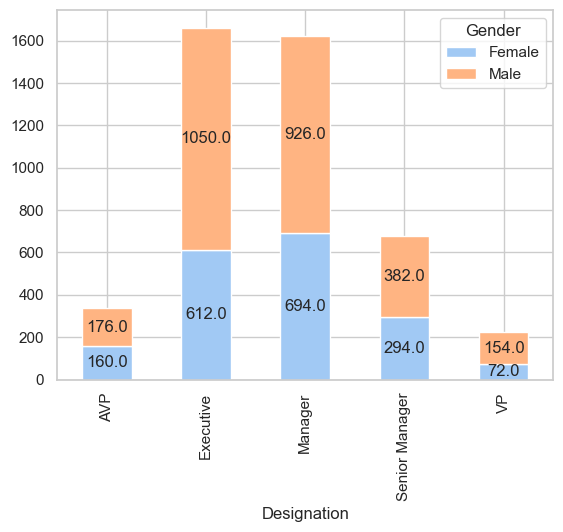

In [38]:
ct=pd.crosstab(lic_sales["Designation"], lic_sales["Gender"])
sns.set(style="whitegrid")

ax = ct.plot(kind='bar', stacked=True, color=sns.color_palette('pastel'))
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.text(x + width / 2, y + height / 2, f'{height}', 
            horizontalalignment='center', verticalalignment='center')
plt.show()

<b> <font color='Blue'> Customer with designation Executive are buying highest number of insurance </font> </b>

<b> <font color='Blue'> Males customers are more compared to females buying insurance </font> </b>

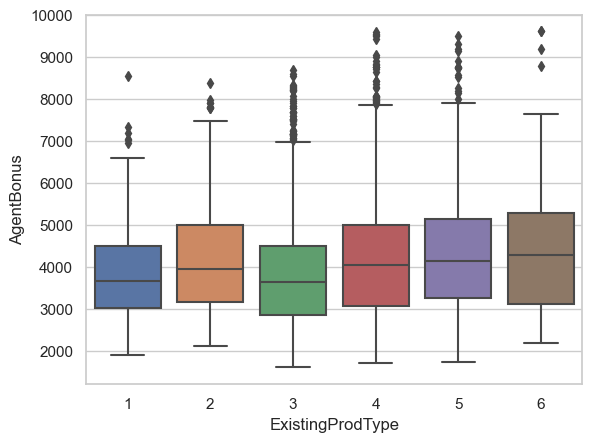

In [39]:
sns.boxplot(x='ExistingProdType',y='AgentBonus',data=lic_sales);

In [40]:
lic_sales.groupby(['ExistingProdType'])['AgentBonus'].max()

ExistingProdType
1    8551
2    8380
3    8679
4    9600
5    9490
6    9608
Name: AgentBonus, dtype: int64

<b> <font color='Blue'> Agents selling product type 4, 5 and 6 are getting more bonus </font> </b>

<b> <font color='Blue'> Less bonus are observed in agents selling product type 2 </font> </b>

In [41]:
lic_sales.groupby(['ExistingProdType'])['SumAssured'].max()

ExistingProdType
1    1400708.0
2    1573268.0
3    1559383.0
4    1756298.0
5    1818844.0
6    1838496.0
Name: SumAssured, dtype: float64

In [42]:
lic_sales.groupby(['ExistingProdType'])['AgentBonus'].sum()

ExistingProdType
1     691327
2     926179
3    5223239
4    7990667
5    3056645
6     543772
Name: AgentBonus, dtype: int64

<b> <font color='Blue'> Sum assured for product type 4, 5, and 6 are higher. These products must be costly and hence more bonus are being paid to agents </font> </b>

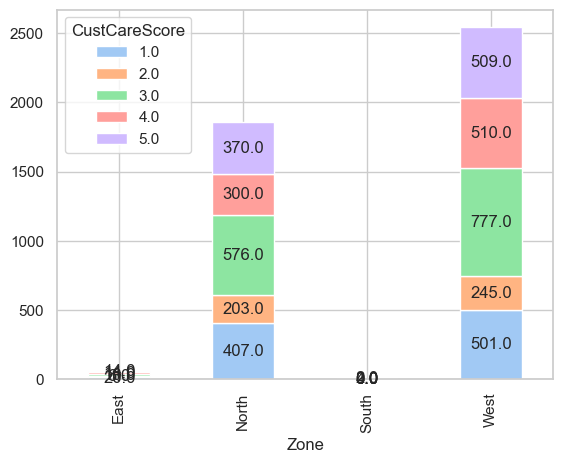

In [43]:
ct_score=pd.crosstab(lic_sales['Zone'],lic_sales['CustCareScore'])
sns.set(style="whitegrid")

ax = ct_score.plot(kind='bar', stacked=True, color=sns.color_palette('pastel'))
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.text(x + width / 2, y + height / 2, f'{height}', 
            horizontalalignment='center', verticalalignment='center')
plt.show()
#ct_score.plot.bar();
#sns.scatterplot(x='Zone',y='CustCareScore',data=lic_sales);

<b> <font color='Blue'> West zone has more dissatisfied customers according to score given. Though it has the maximum number of customers and the ratio between average and poor is low compared to North zone </font> </b>

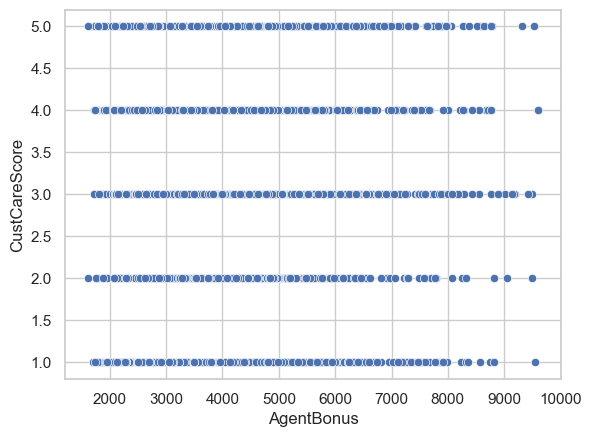

In [44]:
sns.scatterplot(x='AgentBonus',y='CustCareScore',data=lic_sales);

<b> <font color='Blue'> Agents bonus are higher for those who given score of 3 and 5 </font> </b>

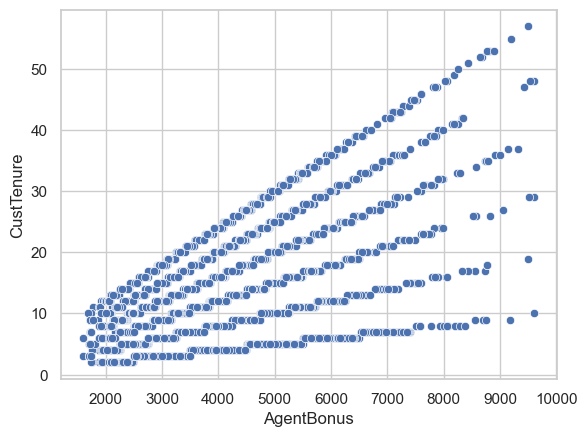

In [45]:
sns.scatterplot(x='AgentBonus',y='CustTenure',data=lic_sales);

<b> <font color='Blue'> As customer tenure increases the agents bonus are also getting increased </font> </b>

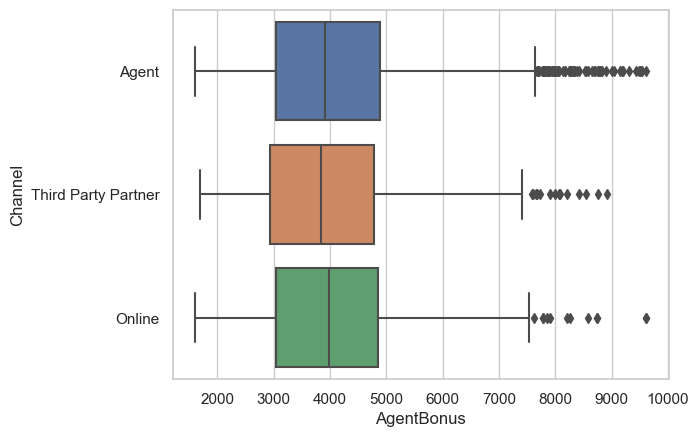

In [46]:
sns.boxplot(x='AgentBonus',y='Channel',data=lic_sales);

<b> <font color='Blue'> More bonus are paid when agents sells insurance without 3rd party or online portals </font> </b>

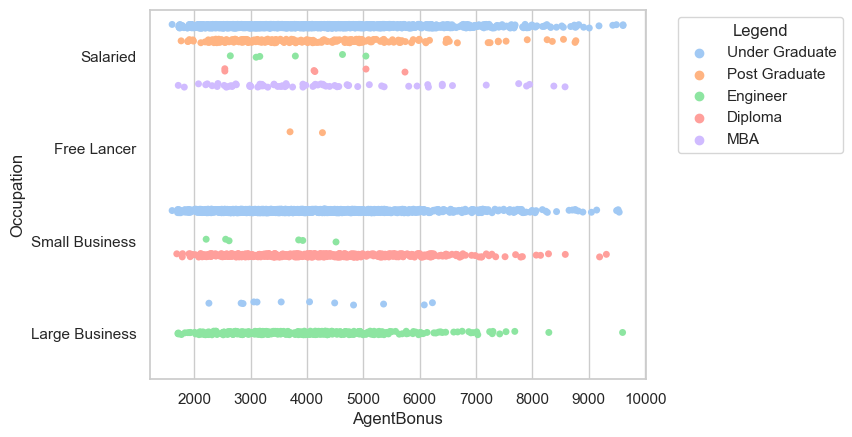

In [47]:
sns.stripplot(x='AgentBonus',y='Occupation',hue='EducationField',data=lic_sales, palette="pastel", jitter=True, dodge=True);
plt.legend(title='Legend', bbox_to_anchor=(1.05, 1), loc='upper left');

In [48]:
pd.pivot_table(lic_sales, index='Designation', columns='Occupation', values='AgentBonus', aggfunc='sum', fill_value=0)

Occupation,Free Lancer,Large Business,Salaried,Small Business
Designation,,,,
AVP,0,100160,973005,788943
Executive,7971,640597,2864466,2234818
Manager,0,435935,3030534,2823473
Senior Manager,0,361046,1401172,1348743
VP,0,64579,719441,636946


In [49]:
pd.pivot_table(lic_sales, index='Designation', columns='EducationField', values='AgentBonus', aggfunc='sum', fill_value=0)

EducationField,Diploma,Engineer,MBA,Post Graduate,Under Graduate
Designation,,,,,
AVP,204006,97711,27216,55962,1477213
Executive,224380,648549,119495,310995,4444433
Manager,1027839,437019,68286,397856,4358942
Senior Manager,452312,347806,14338,171879,2124626
VP,153822,64579,75324,82710,1044531


In [50]:
lic_sales.groupby('Designation')['AgentBonus'].sum()

Designation
AVP               1862108
Executive         5747852
Manager           6289942
Senior Manager    3110961
VP                1420966
Name: AgentBonus, dtype: int64

#### more AgentBonus are paid within salaried class is from Under Graduate followed by Post Graduates and then MBA's. Diploma, Engineer are making very AgentBonus via their policies. 

#### Free Lancers are post graduates

#### In small business, Diploma class is very high

#### In Large business, Engineers are very high


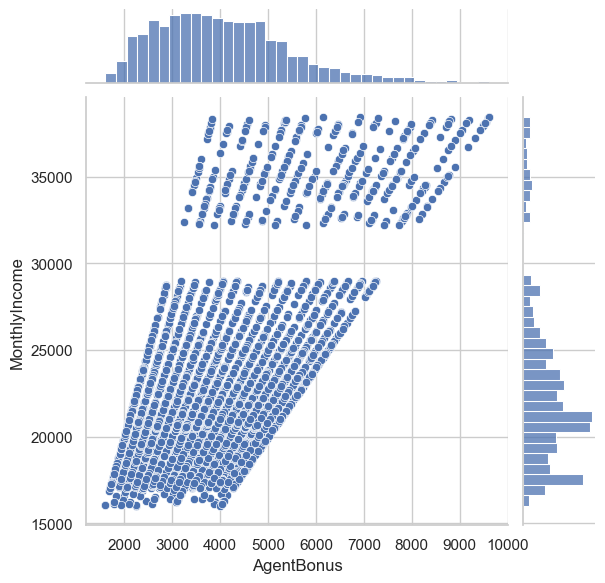

In [51]:
sns.jointplot(x='AgentBonus', y='MonthlyIncome', data=lic_sales, kind='scatter');

<b> <font color='Blue'> There's a clear trend as customers monthly income grows, the agent getting bonus are also increasing </font> </b>

<b> <font color='Blue'> Population of high monthly income are very less comparetively </font> </b>

<b> <font color='Blue'> But agents selling insurance for high monthly income customers are seen to be very less </font> </b>

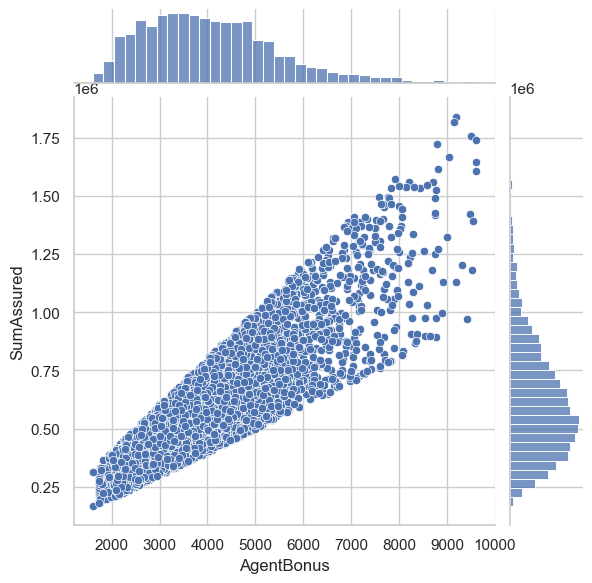

In [52]:
sns.jointplot(x='AgentBonus', y='SumAssured', data=lic_sales, kind='scatter');

<b> <font color='Blue'> Agents getting more bonus when the sum assured of policy are greater </font> </b>

# Outlier treatment on continuous variable

# Missing Value analysis and treatment

## Let's check the number of outliers in each feature

In [53]:
lic_sales_X_outlier = lic_sales.drop('AgentBonus', axis = 1)
lic_sales_Y_outlier = lic_sales['AgentBonus']

In [54]:
Q1 = lic_sales_X_outlier.quantile(0.25)
Q3 = lic_sales_X_outlier.quantile(0.75)
IQR = Q3 - Q1
UL = Q3 + 1.5*IQR
LL = Q1 - 1.5*IQR

In [55]:
((lic_sales_X_outlier > UL) | (lic_sales_X_outlier < LL)).sum()

Age                      50
Channel                   0
Complaint                 0
CustCareScore             0
CustID                    0
CustTenure               52
Designation               0
EducationField            0
ExistingPolicyTenure    131
ExistingProdType          0
Gender                    0
LastMonthCalls            0
MaritalStatus             0
MonthlyIncome           377
NumberOfPolicy            0
Occupation                0
PaymentMethod             0
SumAssured               96
Zone                      0
dtype: int64

In [56]:
lic_sales_X_outlier[((lic_sales_X_outlier > UL) | (lic_sales_X_outlier < LL))]= np.nan

In [57]:
lic_sales_X_outlier.isnull().sum()

CustID                    0
Age                     319
CustTenure              278
Channel                   0
Occupation                0
EducationField            0
Gender                    0
ExistingProdType          0
Designation               0
NumberOfPolicy           45
MaritalStatus             0
MonthlyIncome           613
Complaint                 0
ExistingPolicyTenure    315
SumAssured              250
Zone                      0
PaymentMethod             0
LastMonthCalls            0
CustCareScore            52
dtype: int64

In [58]:
lic_sales_X_outlier.isnull().sum().sum()

1872

In [59]:
1872-1166

706

In [60]:
1872/4520

0.41415929203539825

### Dropping of CustID and Age feature from the dataset 

In [61]:
lic_sales_X_outlier = lic_sales_X_outlier.drop(['CustID', 'Age'], axis = 1)

In [62]:
lic_sales_X_outlier.shape

(4520, 17)

In [63]:
lic_sales_sub1 = pd.concat([lic_sales_X_outlier, lic_sales_Y_outlier], axis =1 )

In [64]:
lic_sales_treat = lic_sales_sub1.copy()

In [65]:
lic_sales_treat.isnull().sum(axis=0).sum()

1553

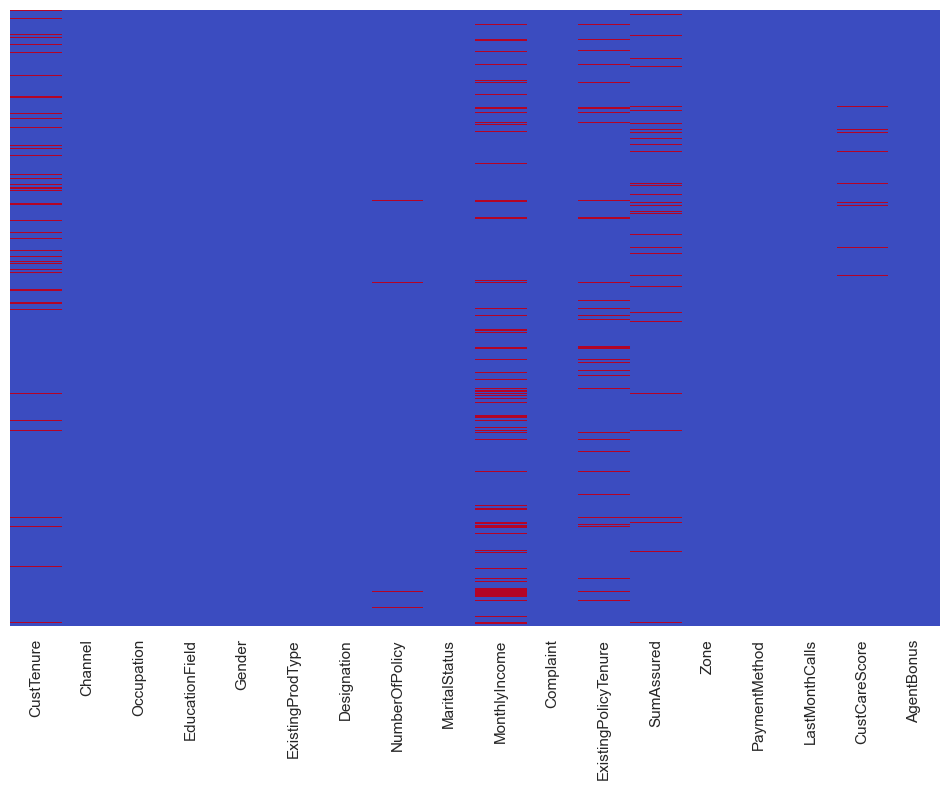

In [66]:
plt.figure(figsize = (12,8))
sns.heatmap(lic_sales_treat.isnull(), cbar = False, cmap = 'coolwarm', yticklabels = False)
plt.show()

<b> <font color='Blue'> Missing values are found in Age, CustTenure, NumberOfPolicy, MonthlyIncome, ExistingPolicyTenure, SumAssured and CustCareScore features </font> </b>

> We shall find missing values at row level

In [67]:
lic_sales_treat.isnull().sum(axis = 1)

0       0
1       0
2       1
3       1
4       1
       ..
4515    0
4516    0
4517    1
4518    0
4519    0
Length: 4520, dtype: int64

In [68]:
lic_sales_temp = lic_sales_treat[lic_sales_treat.isnull().sum(axis = 1) <= 5]

In [69]:
lic_sales_temp.shape

(4520, 18)

<b> <font color='Blue'> Row level which had lesser than 2 missing value represent the whole dataset. </font> </b>

<b> <font color='Blue'> It is not possible to drop the missing values at row level because it takes away entire dataset </font> </b>

In [70]:
lic_sales_treat.isnull().sum().sort_values(ascending = False)/lic_sales_treat.index.size

MonthlyIncome           0.135619
ExistingPolicyTenure    0.069690
CustTenure              0.061504
SumAssured              0.055310
CustCareScore           0.011504
NumberOfPolicy          0.009956
EducationField          0.000000
Gender                  0.000000
ExistingProdType        0.000000
Designation             0.000000
MaritalStatus           0.000000
Channel                 0.000000
Complaint               0.000000
Occupation              0.000000
Zone                    0.000000
PaymentMethod           0.000000
LastMonthCalls          0.000000
AgentBonus              0.000000
dtype: float64

<b> <font color='Blue'> We see 13.5%, 6.9%, 6.1%, 5.5%, 1.1% and 1% in MonthlyIncome, ExistingPolicyTenure, CustTenure, SumAssured, CustCareScore and NumberOfPolicy features </font> </b>

<b> <font color='Blue'> We will be imputing using KNNImputer </font> </b>

## Imputing the missing value

In [71]:
lic_sales_treat.head()

,CustTenure,Channel,Occupation,EducationField,Gender,ExistingProdType,Designation,NumberOfPolicy,MaritalStatus,MonthlyIncome,Complaint,ExistingPolicyTenure,SumAssured,Zone,PaymentMethod,LastMonthCalls,CustCareScore,AgentBonus
0,4.0,Agent,Salaried,Under Graduate,Female,3,Manager,2.0,Unmarried,20993.0,1,2.0,806761.0,North,Half Yearly,5,2.0,4409
1,2.0,Third Party Partner,Salaried,Under Graduate,Male,4,Manager,4.0,Divorced,20130.0,0,3.0,294502.0,North,Yearly,7,3.0,2214
2,4.0,Agent,Free Lancer,Post Graduate,Male,4,Executive,3.0,Unmarried,17090.0,1,2.0,NaN,North,Yearly,0,3.0,4273
3,NaN,Third Party Partner,Salaried,Under Graduate,Female,3,Executive,3.0,Divorced,17909.0,1,2.0,268635.0,West,Half Yearly,0,5.0,1791
4,NaN,Agent,Small Business,Under Graduate,Male,3,Executive,4.0,Divorced,18468.0,0,4.0,366405.0,West,Half Yearly,2,5.0,2955


<b> <font color='Blue' size=5> OneHotEncoding is done on all categorical variable to convert them as numeric to be used in KNNimputer </font> </b>

In [72]:
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder(drop='first', sparse=False)

In [73]:
encoded_categorical = encoder.fit_transform(lic_sales_treat[['Complaint','Gender', 'ExistingProdType', 'Occupation', 'EducationField', 'Designation', 'Channel', 'MaritalStatus', 'Zone', 'PaymentMethod']])

In [74]:
lic_sales_encoded = pd.concat([lic_sales_treat.drop(['Complaint', 'Gender', 'ExistingProdType', 'Occupation', 'EducationField', 'Designation', 'Channel', 'MaritalStatus', 'Zone', 'PaymentMethod'], axis=1), pd.DataFrame(encoded_categorical, columns=encoder.get_feature_names_out(['Complaint', 'Gender', 'ExistingProdType', 'Occupation', 'EducationField', 'Designation', 'Channel', 'MaritalStatus', 'Zone', 'PaymentMethod']))], axis=1)

In [75]:
lic_sales_encoded.head()

,CustTenure,NumberOfPolicy,MonthlyIncome,ExistingPolicyTenure,SumAssured,LastMonthCalls,CustCareScore,AgentBonus,Complaint_1,Gender_Male,...,Channel_Online,Channel_Third Party Partner,MaritalStatus_Married,MaritalStatus_Unmarried,Zone_North,Zone_South,Zone_West,PaymentMethod_Monthly,PaymentMethod_Quarterly,PaymentMethod_Yearly
0,4.0,2.0,20993.0,2.0,806761.0,5,2.0,4409,1.0,0.0,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
1,2.0,4.0,20130.0,3.0,294502.0,7,3.0,2214,0.0,1.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2,4.0,3.0,17090.0,2.0,NaN,0,3.0,4273,1.0,1.0,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0
3,NaN,3.0,17909.0,2.0,268635.0,0,5.0,1791,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,NaN,4.0,18468.0,4.0,366405.0,2,5.0,2955,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


<b> <font color='Blue' size=6> Scale the dataset before imputing for better result </font> </b>

In [76]:
predictors = lic_sales_encoded.drop('AgentBonus', axis = 1)
response = lic_sales_encoded['AgentBonus']

In [77]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
lic_sales_scaled_predictors = pd.DataFrame(scaler.fit_transform(predictors), columns = predictors.columns)

In [78]:
lic_sales_scaled = pd.concat([lic_sales_scaled_predictors, response], axis = 1)

In [79]:
lic_sales_scaled.head()

,CustTenure,NumberOfPolicy,MonthlyIncome,ExistingPolicyTenure,SumAssured,LastMonthCalls,CustCareScore,Complaint_1,Gender_Male,ExistingProdType_2,...,Channel_Third Party Partner,MaritalStatus_Married,MaritalStatus_Unmarried,Zone_North,Zone_South,Zone_West,PaymentMethod_Monthly,PaymentMethod_Quarterly,PaymentMethod_Yearly,AgentBonus
0,-1.212620,-1.075287,-0.226325,-0.649070,0.936419,0.103049,-0.772043,1.575525,-1.211301,-0.226732,...,-0.484044,-1.003546,1.456553,1.182857,-0.036458,-1.145951,-0.291502,-0.130774,-0.681674,4409
1,-1.452974,0.298563,-0.506237,-0.287184,-1.411660,0.655576,-0.048880,-0.634709,0.825559,-0.226732,...,2.065930,-1.003546,-0.686552,1.182857,-0.036458,-1.145951,-0.291502,-0.130774,1.466977,2214
2,-1.212620,-0.388362,-1.492252,-0.649070,NaN,-1.278269,-0.048880,1.575525,0.825559,-0.226732,...,-0.484044,-1.003546,1.456553,1.182857,-0.036458,-1.145951,-0.291502,-0.130774,1.466977,4273
3,NaN,-0.388362,-1.226612,-0.649070,-1.530228,-1.278269,1.397447,1.575525,-1.211301,-0.226732,...,2.065930,-1.003546,-0.686552,-0.845411,-0.036458,0.872638,-0.291502,-0.130774,-0.681674,1791
4,NaN,0.298563,-1.045302,0.074701,-1.082073,-0.725742,1.397447,-0.634709,0.825559,-0.226732,...,-0.484044,-1.003546,-0.686552,-0.845411,-0.036458,0.872638,-0.291502,-0.130774,-0.681674,2955


In [80]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=3)

<b> <font color='Blue' size=5> Let's split the dataset into train and test before imputting the data </font> </b>

<b> <font color='Blue'> Imputation will happen only on train dataset  </font> </b>

In [81]:
from sklearn.model_selection import train_test_split
lic_sales_train, lic_sales_test = train_test_split(lic_sales_scaled, test_size = 0.3, random_state=42)

In [82]:
lic_sales_treated = pd.DataFrame(imputer.fit_transform(lic_sales_train), columns = lic_sales_train.columns)

In [83]:
lic_sales_imputed_train = pd.DataFrame(imputer.fit_transform(lic_sales_train), columns = lic_sales_train.columns)
lic_sales_imputed_test = pd.DataFrame(imputer.transform(lic_sales_test), columns = lic_sales_test.columns)

In [84]:
print(lic_sales_imputed_train.isnull().sum().sum())
print(lic_sales_imputed_test.isnull().sum().sum())

0
0


In [85]:
print('Shape of lic_sales_imputed_train:', lic_sales_imputed_train.shape)
print('Shape of lic_sales_imputed_test:', lic_sales_imputed_test.shape)

Shape of lic_sales_imputed_train: (3164, 36)
Shape of lic_sales_imputed_test: (1356, 36)


In [86]:
3164+1356

4520

In [87]:
lic_sales_imputed_combined = pd.concat([lic_sales_imputed_train, lic_sales_imputed_test], axis=0, ignore_index=True)

In [88]:
print('missing values in given dataset after imputation:', lic_sales_imputed_combined.isnull().sum().sum())

missing values in given dataset after imputation: 0


In [89]:
lic_sales_imputed_combined.head()

,CustTenure,NumberOfPolicy,MonthlyIncome,ExistingPolicyTenure,SumAssured,LastMonthCalls,CustCareScore,Complaint_1,Gender_Male,ExistingProdType_2,...,Channel_Third Party Partner,MaritalStatus_Married,MaritalStatus_Unmarried,Zone_North,Zone_South,Zone_West,PaymentMethod_Monthly,PaymentMethod_Quarterly,PaymentMethod_Yearly,AgentBonus
0,0.710211,-1.075287,1.950693,0.557214,2.818822,-1.002006,-0.048880,-0.634709,-1.211301,-0.226732,...,-0.484044,-1.003546,1.456553,-0.845411,-0.036458,0.872638,-0.291502,-0.130774,-0.681674,6545.0
1,2.392689,1.672412,0.391232,1.160356,0.229619,0.103049,-1.495207,1.575525,-1.211301,-0.226732,...,-0.484044,-1.003546,1.456553,1.182857,-0.036458,-1.145951,-0.291502,-0.130774,-0.681674,5724.0
2,1.311096,-1.075287,-0.220811,-0.649070,-0.700662,-0.173215,1.397447,-0.634709,-1.211301,-0.226732,...,2.065930,-1.003546,1.456553,1.182857,-0.036458,-1.145951,-0.291502,-0.130774,1.466977,4202.0
3,0.109326,0.985488,1.816413,-0.649070,0.953754,0.931839,-1.495207,-0.634709,0.825559,-0.226732,...,-0.484044,0.996466,-0.686552,1.182857,-0.036458,-1.145951,-0.291502,-0.130774,-0.681674,4912.0
4,-0.451499,-0.388362,-1.087143,-1.010955,-0.750831,0.655576,0.674284,1.575525,-1.211301,-0.226732,...,-0.484044,0.996466,-0.686552,-0.845411,-0.036458,0.872638,-0.291502,-0.130774,-0.681674,2384.0


## Let's inspect the correlation between the independent variables

<Axes: >

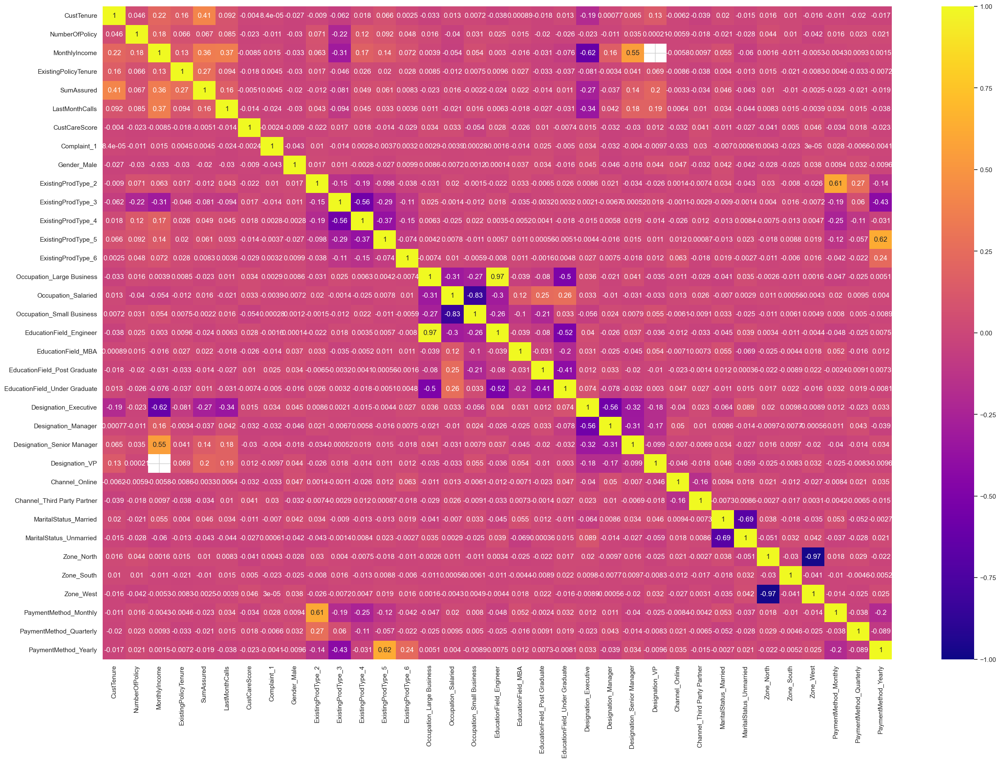

In [90]:
plt.figure(figsize = (30,20))
cor_matrix = lic_sales_train.drop('AgentBonus', axis = 1).corr()
sns.heatmap(cor_matrix, cmap = 'plasma', vmin = -1, vmax= 1, annot=True)

<b> <font color='Blue'> Existing Product Type 5 has good correlation with payment method yearly </font> </b>

<b> <font color='Blue'> Existing Product Type 2 has good correlation with payment method monthly </font> </b>

<b> <font color='Blue'> Designation VP and Senior Manager has correlation with MonthlyIncome </font> </b>

<b> <font color='Blue'> Fewer features has strong negative correlation, we will use recurssive feature elimination to decide of feature selection  </font> </b>

<b> <font color='Blue' size=5> We will use random forest RFE to eliminate weeker features for segmentation </font> </b>


In [91]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_squared_error

<b> <font color='Blue' size=5> Split the dataset into features (X) and target (y) </font> </b>

In [92]:
X = lic_sales_imputed_combined.drop('AgentBonus', axis=1)
y = lic_sales_imputed_combined['AgentBonus']

In [93]:
lic_sales_X_train, lic_sales_X_test, lic_sales_y_train, lic_sales_y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [94]:
print('Shape of X train:', lic_sales_X_train.shape)
print('Shape of y train:', lic_sales_y_train.shape)

Shape of X train: (3164, 35)
Shape of y train: (3164,)


<b> <font color='Blue' size=5> Recursive Feature Elimination limiting upto 12 features </font> </b>

In [95]:
rf_model = RandomForestRegressor()

In [96]:
rfe = RFE(estimator=rf_model, n_features_to_select=12)

In [97]:
rfe.fit(lic_sales_X_train, lic_sales_y_train)

RFE(estimator=RandomForestRegressor(), n_features_to_select=12)

<b> <font color='Blue' size=5> Printing the supporting features that RFE chosen </font> </b>

In [98]:
selected_features = X.columns[rfe.support_]

<b> <font color='Blue' size=5> Fine tuning hyper parameter using Grid Search to apply in RandomForest to get best parameters that will be used in RandomForest </font> </b>

In [99]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'n_estimators': [10, 50, 100],
    'max_features': ['sqrt', 'log2'],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

In [100]:
rf_regressor = RandomForestRegressor()

In [101]:
grid_search = GridSearchCV(estimator=rf_regressor, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error')
grid_search.fit(lic_sales_X_train[selected_features], lic_sales_y_train)

GridSearchCV(cv=3, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [None, 10, 20],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [10, 50, 100]},
             scoring='neg_mean_squared_error')

<b> <font color='Blue' size=5> Printing best parameter that grid search resulted to apply in Random Forest RFE method </font> </b>

In [102]:
best_params = grid_search.best_params_

In [103]:
best_rf_model = RandomForestRegressor(**best_params)
best_rf_model.fit(lic_sales_X_train[selected_features], lic_sales_y_train)

RandomForestRegressor(max_depth=20, max_features='log2', min_samples_split=5)

In [104]:
#lic_sales_y_pred = best_rf_model.predict(lic_sales_X_test[selected_features])

In [105]:
#mse = mean_squared_error(lic_sales_y_test, lic_sales_y_pred)
#print(f"Mean Squared Error on Test Set: {mse}")

<b> <font color='Blue' size=5> Applying the recommendation from grid search and running RFE to pick 15 features </font> </b>

In [106]:
lic_sales_rf_model = RandomForestRegressor(max_depth=20,max_features='log2')
lic_sales_rfe = RFE(estimator=lic_sales_rf_model, n_features_to_select=15)

In [107]:
lic_sales_rfe.fit(lic_sales_X_train, lic_sales_y_train)

RFE(estimator=RandomForestRegressor(max_depth=20, max_features='log2'),
    n_features_to_select=15)

In [108]:
feature_ranking = pd.DataFrame({'Feature': lic_sales_X_train.columns, 'Ranking': lic_sales_rfe.ranking_})

In [109]:
print("Feature Ranking:")
print(feature_ranking.sort_values(by='Ranking'))

Feature Ranking:
                          Feature  Ranking
0                      CustTenure        1
1                  NumberOfPolicy        1
2                   MonthlyIncome        1
3            ExistingPolicyTenure        1
4                      SumAssured        1
5                  LastMonthCalls        1
6                   CustCareScore        1
15            Occupation_Salaried        1
21          Designation_Executive        1
29                     Zone_North        1
10             ExistingProdType_3        1
27          MaritalStatus_Married        1
24                 Designation_VP        1
23     Designation_Senior Manager        1
22            Designation_Manager        1
8                     Gender_Male        2
7                     Complaint_1        3
20  EducationField_Under Graduate        4
34           PaymentMethod_Yearly        5
11             ExistingProdType_4        6
16      Occupation_Small Business        7
26    Channel_Third Party Partner    

In [110]:
# Select the important features based on RFE
selected_features = lic_sales_X_train.columns[lic_sales_rfe.support_]

In [111]:
print('selected features:', selected_features)

selected features: Index(['CustTenure', 'NumberOfPolicy', 'MonthlyIncome', 'ExistingPolicyTenure',
       'SumAssured', 'LastMonthCalls', 'CustCareScore', 'ExistingProdType_3',
       'Occupation_Salaried', 'Designation_Executive', 'Designation_Manager',
       'Designation_Senior Manager', 'Designation_VP', 'MaritalStatus_Married',
       'Zone_North'],
      dtype='object')


In [112]:
#knn_model = KNeighborsRegressor(n_neighbors=12)
#knn_model.fit(lic_sales_X_train[selected_features], lic_sales_y_train)

In [113]:
# Make predictions on the test set
#lic_sales_y_pred = knn_model.predict(lic_sales_X_test[selected_features])

In [114]:
# Evaluate the KNN model
#mse = mean_squared_error(lic_sales_y_test, lic_sales_y_pred)
#print(f"Mean Squared Error on Test Set: {mse}")

In [115]:
#np.sqrt(mse)

<b> <font color='Blue' size=5> Using KMeans create Clustering of data and printing Elbow plot </font> </b>

In [116]:
from sklearn.cluster import KMeans

In [117]:
k_values = range(1, 11)
sse = []
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(lic_sales_imputed_combined)
    sse.append(kmeans.inertia_)

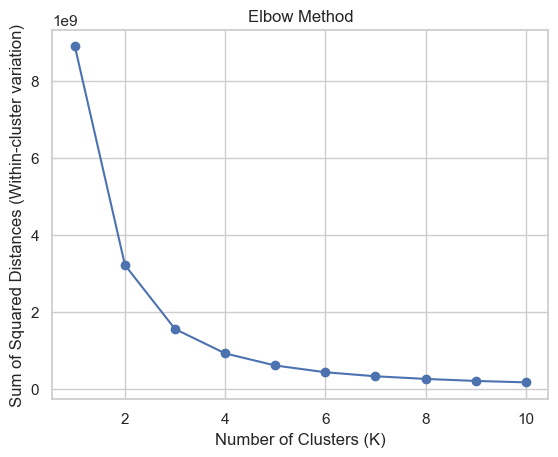

In [118]:
plt.plot(k_values, sse, marker='o')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Sum of Squared Distances (Within-cluster variation)')
plt.title('Elbow Method')
plt.show()

<b> <font color='Blue' size=5> Using KMeans determining Silhouette Score </font> </b>

In [119]:
from sklearn.metrics import silhouette_score

In [120]:
sil_scores = []
k_values = range(2,15)
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(lic_sales_imputed_combined)
    sil_scores.append(silhouette_score(lic_sales_imputed_combined, labels))

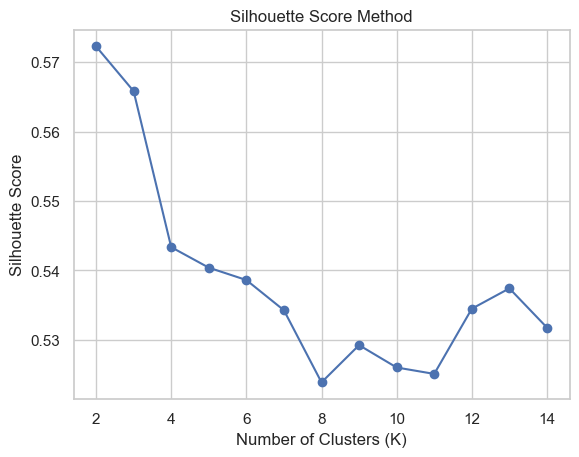

In [121]:
plt.plot(k_values, sil_scores, marker='o')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score Method')
plt.show()

<b> <font color='Blue' size=5> We will use k = 6 , since the silhouette score isn't driftted very much between 5 and 6 k values </font> </b>

In [122]:
k_means_6 = KMeans(n_clusters = 6,random_state=42)
k_means_6.fit(lic_sales_imputed_combined)
labels = k_means_6.labels_

<b> <font color='Blue' size=5> Appending the cluster value into original dataset </font> </b>

In [123]:
lic_sales["Clus_kmeans6"] = labels
lic_sales.head()

,CustID,AgentBonus,Age,CustTenure,Channel,Occupation,EducationField,Gender,ExistingProdType,Designation,...,MaritalStatus,MonthlyIncome,Complaint,ExistingPolicyTenure,SumAssured,Zone,PaymentMethod,LastMonthCalls,CustCareScore,Clus_kmeans6
0,7000000,4409,22.0,4.0,Agent,Salaried,Under Graduate,Female,3,Manager,...,Unmarried,20993.0,1,2.0,806761.0,North,Half Yearly,5,2.0,4
1,7000001,2214,11.0,2.0,Third Party Partner,Salaried,Under Graduate,Male,4,Manager,...,Divorced,20130.0,0,3.0,294502.0,North,Yearly,7,3.0,4
2,7000002,4273,26.0,4.0,Agent,Free Lancer,Post Graduate,Male,4,Executive,...,Unmarried,17090.0,1,2.0,NaN,North,Yearly,0,3.0,1
3,7000003,1791,11.0,NaN,Third Party Partner,Salaried,Under Graduate,Female,3,Executive,...,Divorced,17909.0,1,2.0,268635.0,West,Half Yearly,0,5.0,0
4,7000004,2955,6.0,NaN,Agent,Small Business,Under Graduate,Male,3,Executive,...,Divorced,18468.0,0,4.0,366405.0,West,Half Yearly,2,5.0,5


<b> <font color='Blue' size=5> Cluster Profiling </font> </b>

In [124]:
lic_sales.Clus_kmeans6.value_counts().sort_index()

0     909
1    1015
2     198
3    1087
4     430
5     881
Name: Clus_kmeans6, dtype: int64

In [125]:
clust_profile=lic_sales.drop(['CustID'],axis=1)
clust_profile=clust_profile.groupby('Clus_kmeans6').mean()
clust_profile['freq']=lic_sales.Clus_kmeans6.value_counts().sort_index()
clust_profile

,AgentBonus,Age,CustTenure,NumberOfPolicy,MonthlyIncome,ExistingPolicyTenure,SumAssured,freq
Clus_kmeans6,,,,,,,,
0,4033.460946,14.449704,14.390244,3.577434,22649.207701,4.139483,614703.117919,909
1,4101.541872,14.436782,14.468553,3.553554,22818.505252,4.025880,622116.391039,1015
2,3925.494949,14.090426,13.979275,3.561856,22868.329787,3.821990,594092.481481,198
3,4067.327507,14.561765,14.348500,3.519889,22941.073147,4.358654,618910.182857,1087
4,4031.911628,14.580645,14.180693,3.560000,23161.524941,4.058968,621167.914081,430
5,4165.939841,14.573986,14.944641,3.626147,23025.969770,4.061684,629353.852497,881


<b> <font size=3 color="Green"> Agents in Cluster 5 is getting more bonus compared to other clusters </font> </b>

<b> <font size=3 color="Green"> Customers in Cluster 4 has high Monthly income  </font> </b>

<b> <font size=3 color="Green"> Highest number of observations are found in Cluster 3 </font> </b>

<b> <font size=3 color="Green"> Customers Age in Cluster 4 is high, so many aged persons are found in it </font> </b>

<b> <font size=3 color="Green"> Customers in Cluster 5 has highest Sum Assured  </font> </b>

<b> <font size=3 color="Green"> Agents in Cluster 2 is receiving lowest bonus who needs training  </font> </b>

<b> <font size=3 color="Green"> Customers in Cluster 1 is second highest who's receiving second highest bonus  </font> </b>

In [126]:
#print("Within-Cluster Sum of Squares (WCSS):", k_means_5.inertia_)

In [127]:
#wss=[]
#for i in range(1,15):
#    KM = KMeans(n_clusters=i,random_state=1)
#    KM.fit(lic_sales_imputed_combined)
#    wss.append(KM.inertia_)

In [128]:
#wss

In [129]:
#from scipy.spatial.distance import cdist

#cluster_centers = k_means_5.cluster_centers_
#distances = cdist(cluster_centers, cluster_centers, 'euclidean')
#np.fill_diagonal(distances, np.inf)   
#print("Cluster Centroid Distances:")
#print(distances)

In [130]:
#from sklearn.metrics import pairwise_distances

#inter_cluster_distances = np.mean(pairwise_distances(lic_sales_imputed_combined, cluster_centers[labels]))
#print("Average Inter-Cluster Distance:", inter_cluster_distances)

In [131]:
clust_profile0 = pd.DataFrame(lic_sales[lic_sales['Clus_kmeans6'] == 0])
clust_profile1 = pd.DataFrame(lic_sales[lic_sales['Clus_kmeans6'] == 1])
clust_profile2 = pd.DataFrame(lic_sales[lic_sales['Clus_kmeans6'] == 2])
clust_profile3 = pd.DataFrame(lic_sales[lic_sales['Clus_kmeans6'] == 3])
clust_profile4 = pd.DataFrame(lic_sales[lic_sales['Clus_kmeans6'] == 4])
clust_profile5 = pd.DataFrame(lic_sales[lic_sales['Clus_kmeans6'] == 5])

In [132]:
print("Maximum Agent Bonus in Cluster 1 is :", clust_profile0['AgentBonus'].max())
print("Maximum Agent Bonus in Cluster 2 is :", clust_profile1['AgentBonus'].max())
print("Maximum Agent Bonus in Cluster 3 is :", clust_profile2['AgentBonus'].max())
print("Maximum Agent Bonus in Cluster 4 is :", clust_profile3['AgentBonus'].max())
print("Maximum Agent Bonus in Cluster 5 is :", clust_profile4['AgentBonus'].max())
print("Maximum Agent Bonus in Cluster 6 is :", clust_profile5['AgentBonus'].max())
print("Minimum Agent Bonus in Cluster 1 is :", clust_profile0['AgentBonus'].min())
print("Minimum Agent Bonus in Cluster 2 is :", clust_profile1['AgentBonus'].min())
print("Minimum Agent Bonus in Cluster 3 is :", clust_profile2['AgentBonus'].min())
print("Minimum Agent Bonus in Cluster 4 is :", clust_profile3['AgentBonus'].min())
print("Minimum Agent Bonus in Cluster 5 is :", clust_profile4['AgentBonus'].min())
print("Minimum Agent Bonus in Cluster 6 is :", clust_profile5['AgentBonus'].min())

Maximum Agent Bonus in Cluster 1 is : 9608
Maximum Agent Bonus in Cluster 2 is : 9521
Maximum Agent Bonus in Cluster 3 is : 9600
Maximum Agent Bonus in Cluster 4 is : 9494
Maximum Agent Bonus in Cluster 5 is : 9192
Maximum Agent Bonus in Cluster 6 is : 9426
Minimum Agent Bonus in Cluster 1 is : 1605
Minimum Agent Bonus in Cluster 2 is : 1605
Minimum Agent Bonus in Cluster 3 is : 1954
Minimum Agent Bonus in Cluster 4 is : 1688
Minimum Agent Bonus in Cluster 5 is : 1738
Minimum Agent Bonus in Cluster 6 is : 1716


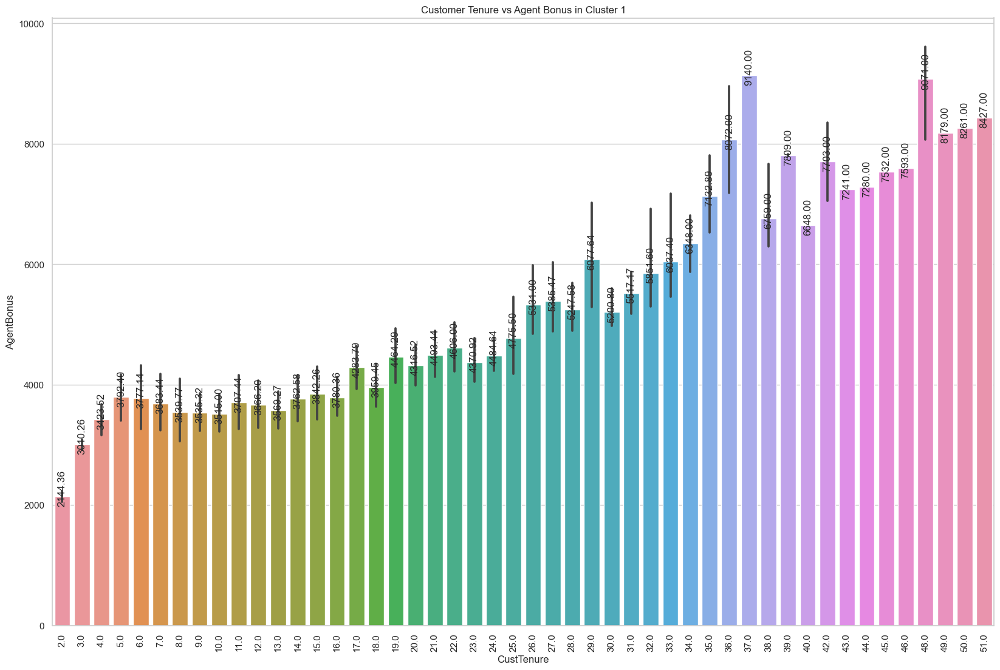

In [133]:
plt.figure(figsize=(20,13))
ax1=sns.barplot(x='CustTenure', y='AgentBonus', data=clust_profile0)
plt.title('Customer Tenure vs Agent Bonus in Cluster 1')
plt.xticks(rotation=90)
for p in ax1.patches:
    ax1.annotate(f"{p.get_height():.2f}", (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', rotation=90, xytext=(0, 10), textcoords='offset points')


plt.show()

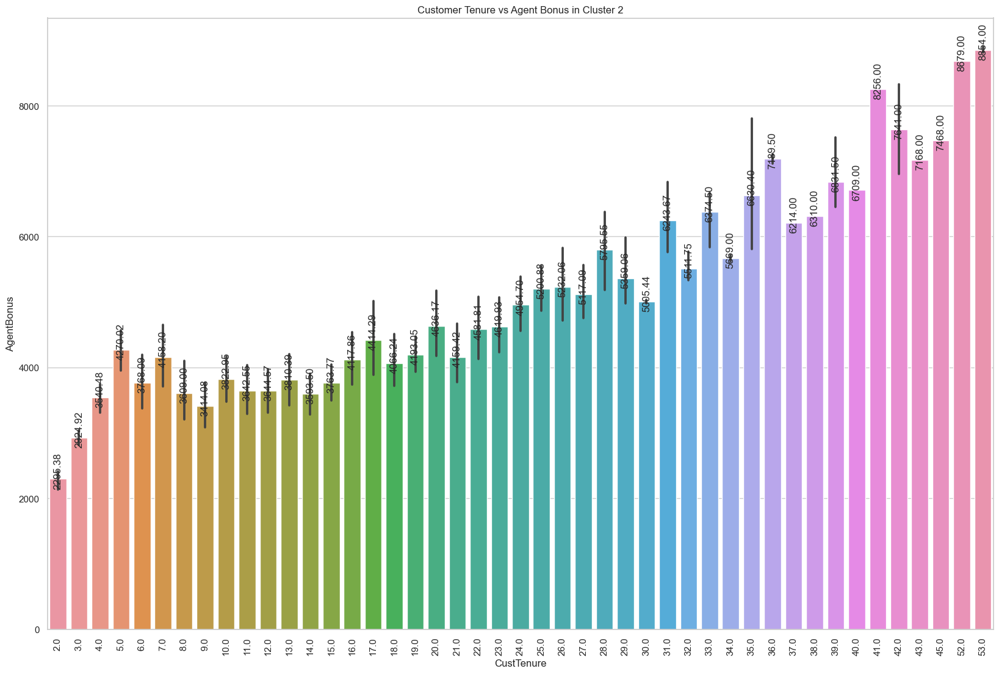

In [134]:
plt.figure(figsize=(20,13))
ax1=sns.barplot(x='CustTenure', y='AgentBonus', data=clust_profile1)
plt.title('Customer Tenure vs Agent Bonus in Cluster 2')
plt.xticks(rotation=90)
for p in ax1.patches:
    ax1.annotate(f"{p.get_height():.2f}", (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', rotation=90, xytext=(0, 10), textcoords='offset points')


plt.show()

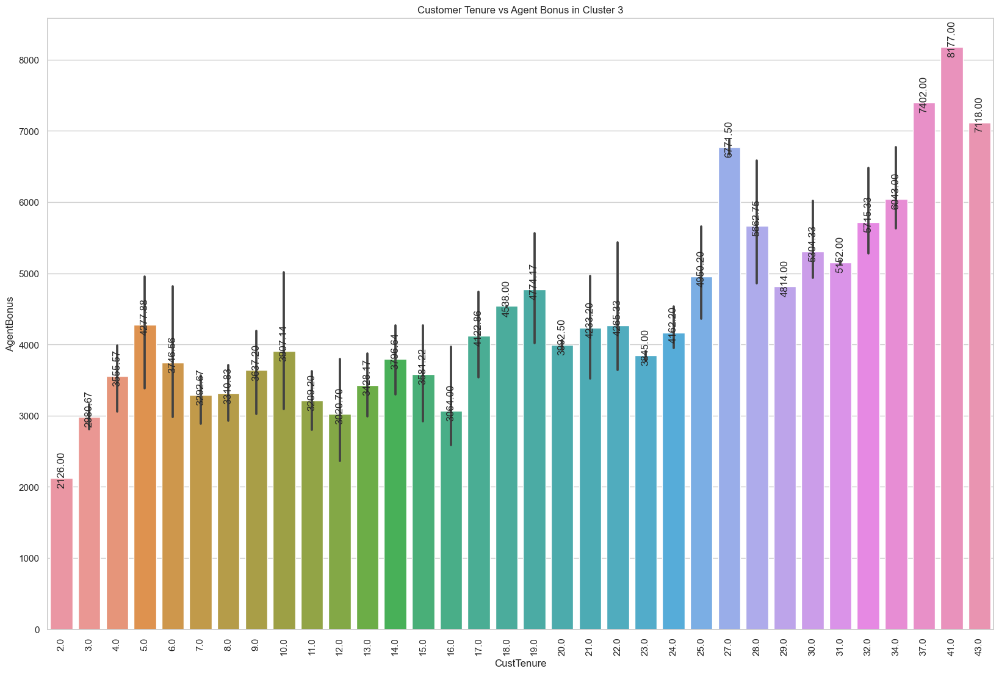

In [135]:
plt.figure(figsize=(20,13))
ax1=sns.barplot(x='CustTenure', y='AgentBonus', data=clust_profile2)
plt.title('Customer Tenure vs Agent Bonus in Cluster 3')
plt.xticks(rotation=90)
for p in ax1.patches:
    ax1.annotate(f"{p.get_height():.2f}", (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', rotation=90, xytext=(0, 10), textcoords='offset points')


plt.show()

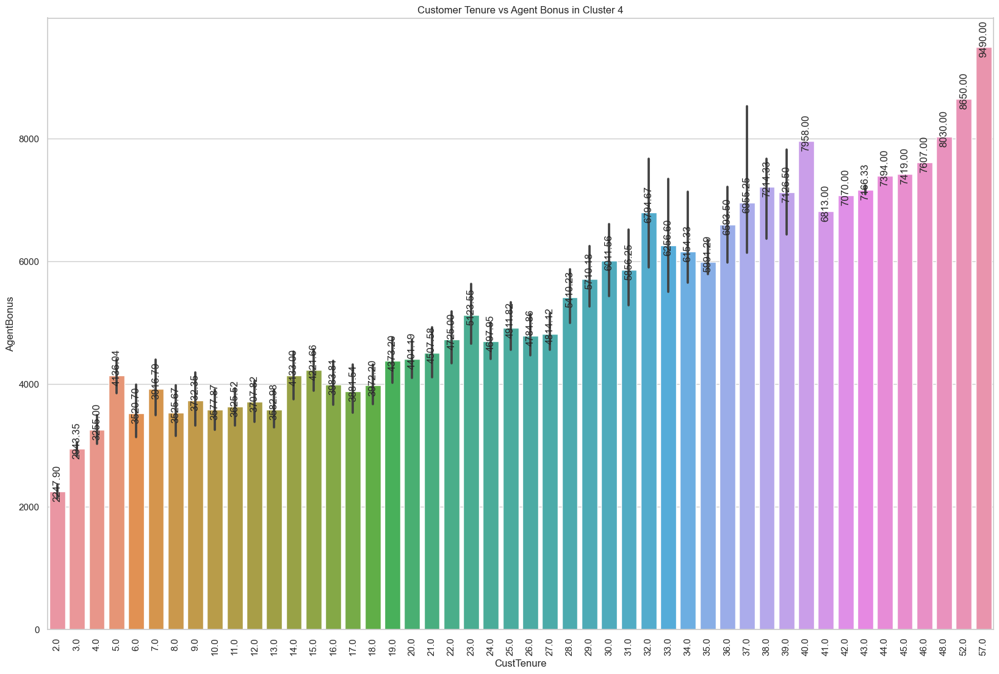

In [136]:
plt.figure(figsize=(20,13))
ax1=sns.barplot(x='CustTenure', y='AgentBonus', data=clust_profile3)
plt.title('Customer Tenure vs Agent Bonus in Cluster 4')
plt.xticks(rotation=90)
for p in ax1.patches:
    ax1.annotate(f"{p.get_height():.2f}", (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', rotation=90, xytext=(0, 10), textcoords='offset points')


plt.show()

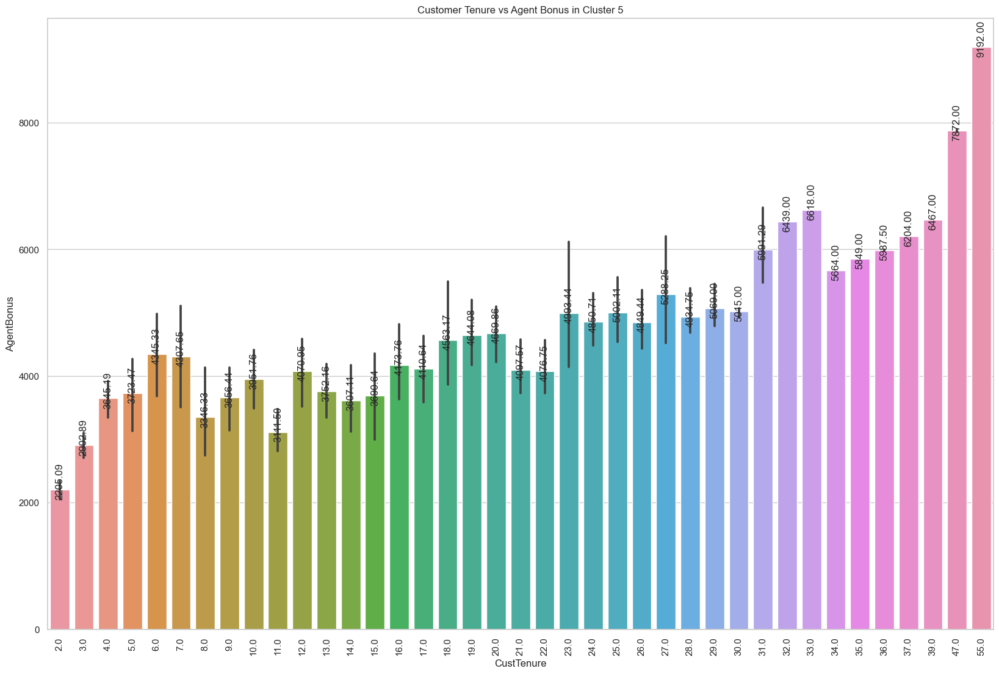

In [137]:
plt.figure(figsize=(20,13))
ax1=sns.barplot(x='CustTenure', y='AgentBonus', data=clust_profile4)
plt.title('Customer Tenure vs Agent Bonus in Cluster 5')
plt.xticks(rotation=90)
for p in ax1.patches:
    ax1.annotate(f"{p.get_height():.2f}", (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', rotation=90, xytext=(0, 10), textcoords='offset points')


plt.show()

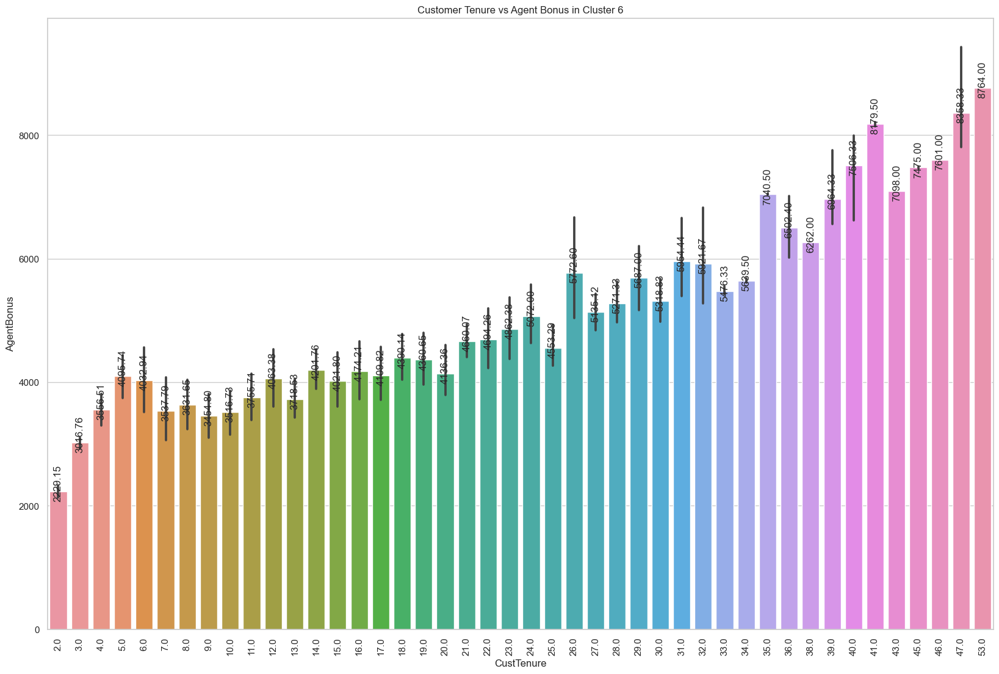

In [138]:
plt.figure(figsize=(20,13))
ax1=sns.barplot(x='CustTenure', y='AgentBonus', data=clust_profile5)
plt.title('Customer Tenure vs Agent Bonus in Cluster 6')
plt.xticks(rotation=90)
for p in ax1.patches:
    ax1.annotate(f"{p.get_height():.2f}", (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', rotation=90, xytext=(0, 10), textcoords='offset points')


plt.show()

<b> <font size=3 color="Green"> Agents bonus in all customer  is increasing as Cust Tenure increases  </font> </b>

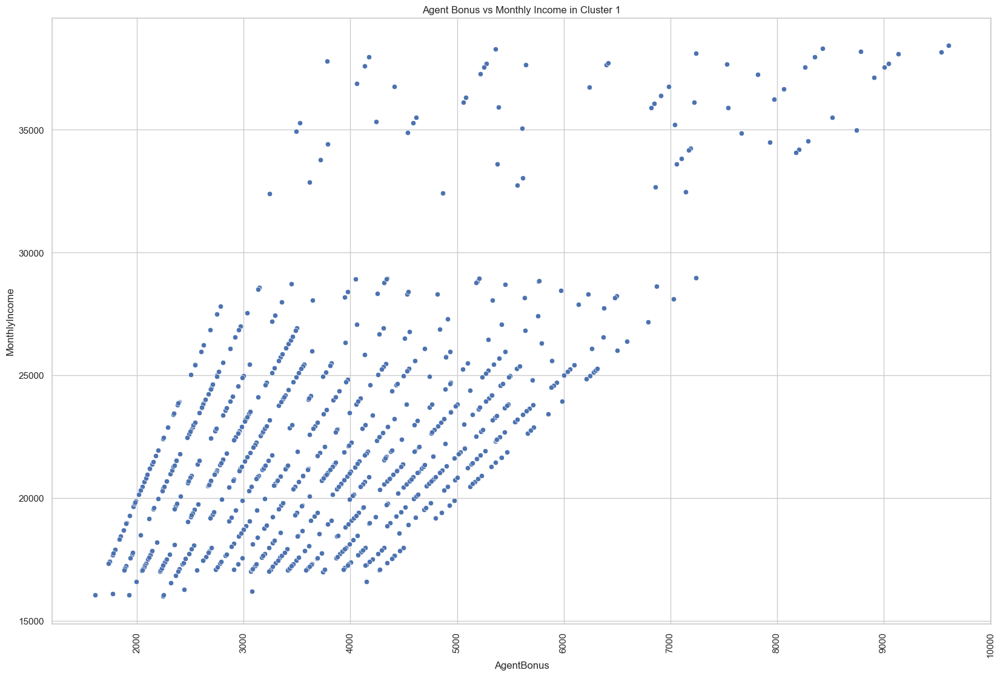

In [139]:
plt.figure(figsize=(20,13))
ax1=sns.scatterplot(x='AgentBonus', y='MonthlyIncome', data=clust_profile0)
plt.title('Agent Bonus vs Monthly Income in Cluster 1')
plt.xticks(rotation=90)
plt.show()

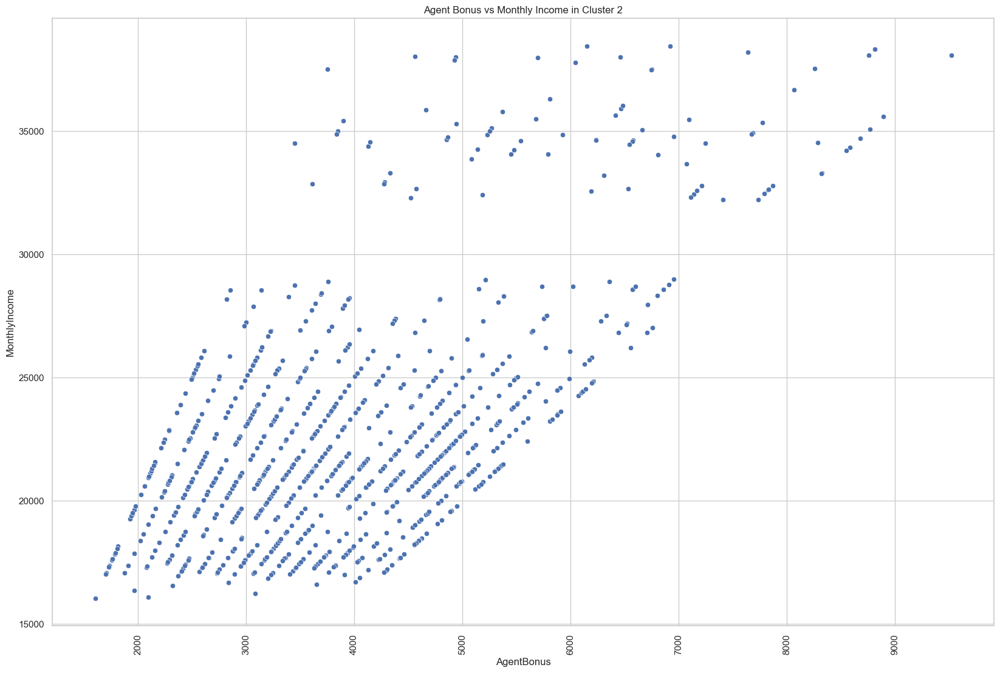

In [140]:
plt.figure(figsize=(20,13))
ax1=sns.scatterplot(x='AgentBonus', y='MonthlyIncome', data=clust_profile1)
plt.title('Agent Bonus vs Monthly Income in Cluster 2')
plt.xticks(rotation=90)
plt.show()

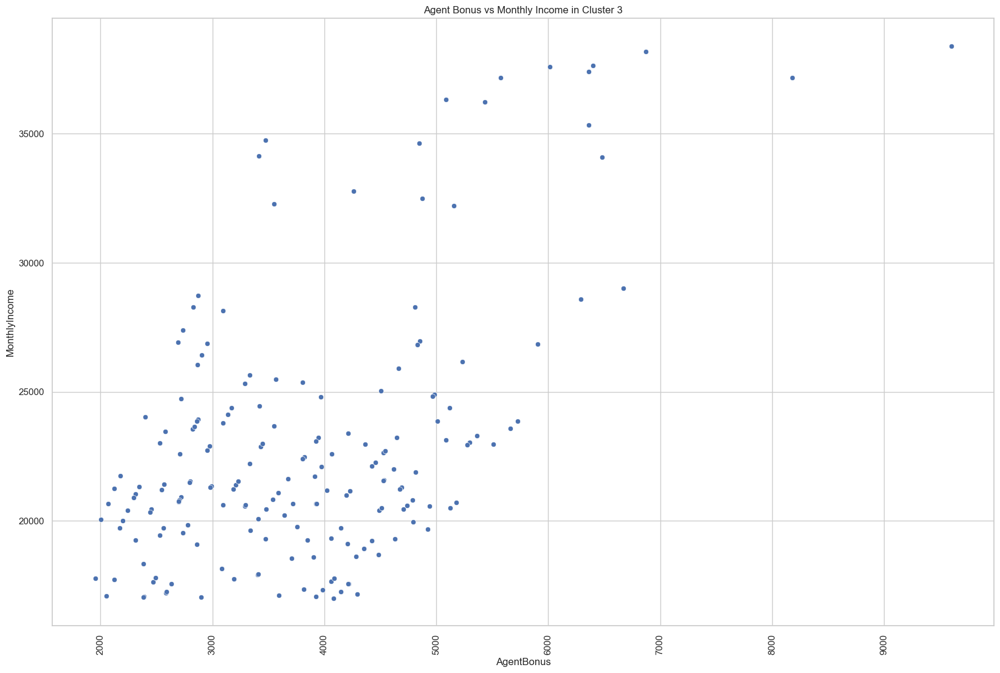

In [141]:
plt.figure(figsize=(20,13))
ax1=sns.scatterplot(x='AgentBonus', y='MonthlyIncome', data=clust_profile2)
plt.title('Agent Bonus vs Monthly Income in Cluster 3')
plt.xticks(rotation=90)
plt.show()

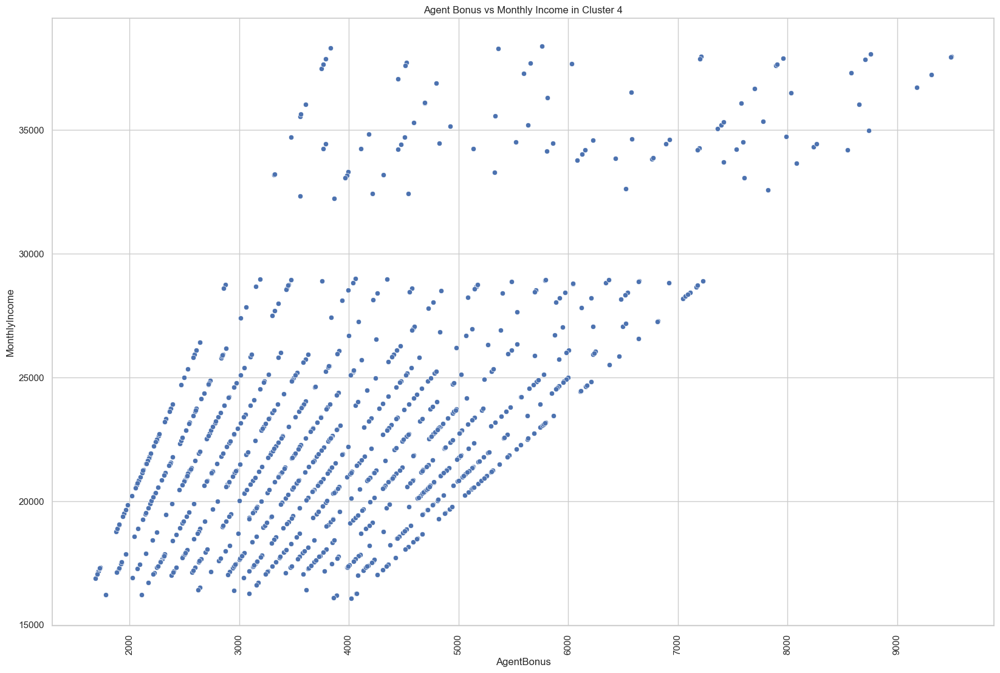

In [142]:
plt.figure(figsize=(20,13))
ax1=sns.scatterplot(x='AgentBonus', y='MonthlyIncome', data=clust_profile3)
plt.title('Agent Bonus vs Monthly Income in Cluster 4')
plt.xticks(rotation=90)
plt.show()

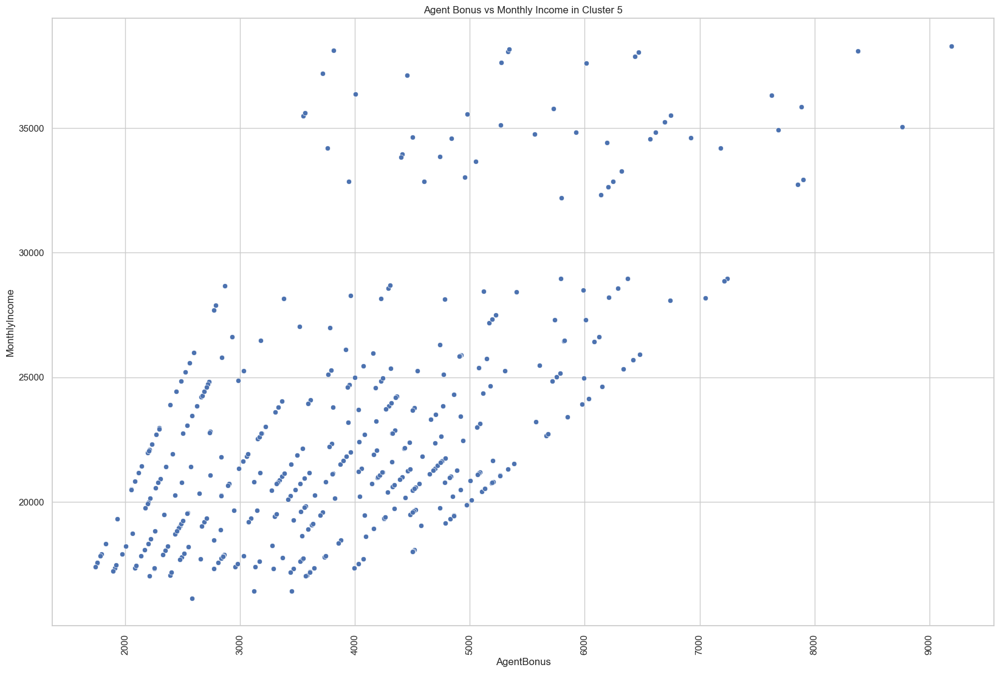

In [143]:
plt.figure(figsize=(20,13))
ax1=sns.scatterplot(x='AgentBonus', y='MonthlyIncome', data=clust_profile4)
plt.title('Agent Bonus vs Monthly Income in Cluster 5')
plt.xticks(rotation=90)
plt.show()

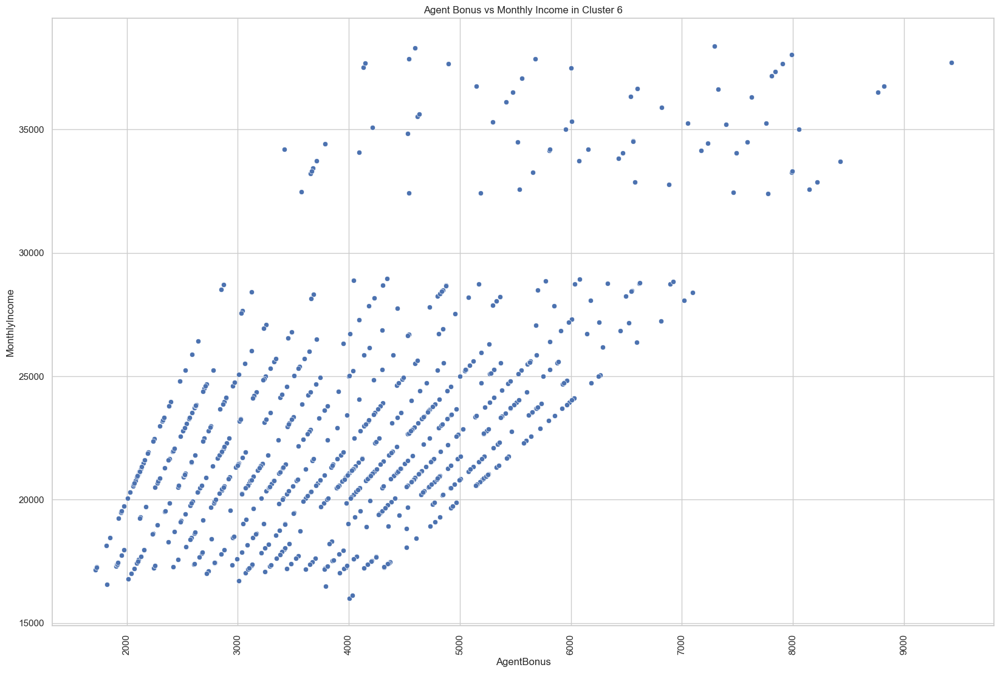

In [144]:
plt.figure(figsize=(20,13))
ax1=sns.scatterplot(x='AgentBonus', y='MonthlyIncome', data=clust_profile5)
plt.title('Agent Bonus vs Monthly Income in Cluster 6')
plt.xticks(rotation=90)
plt.show()

<b> <font size=3 color="Green"> Agents bonus are increases as monthly income of customer increase </font> </b>

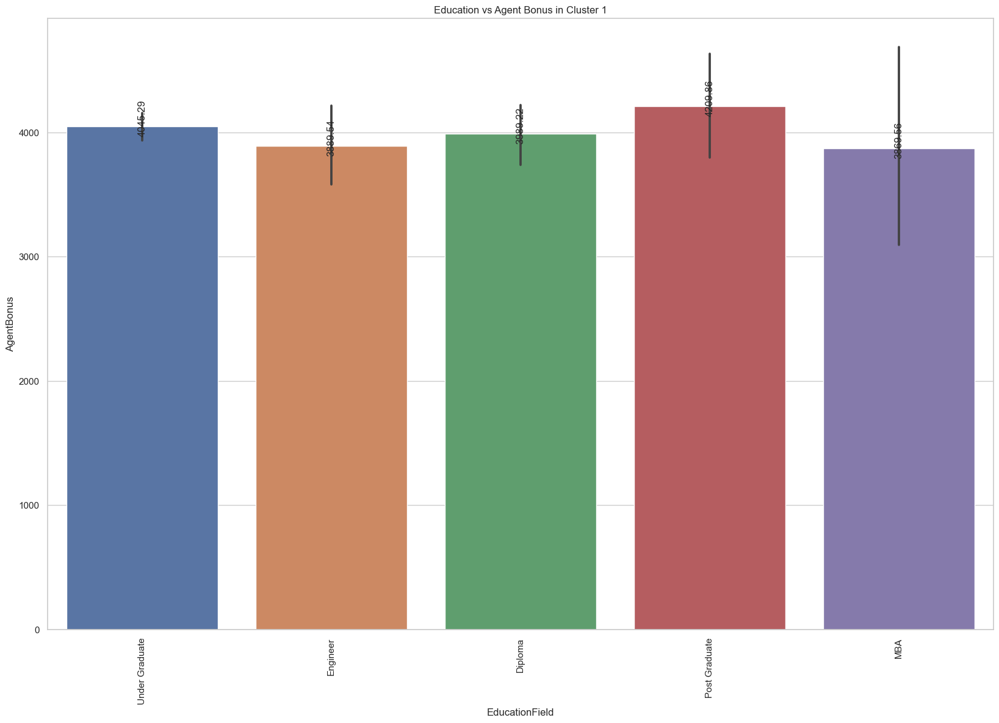

In [145]:
plt.figure(figsize=(20,13))
ax1=sns.barplot(x='EducationField', y='AgentBonus', data=clust_profile0)
plt.title('Education vs Agent Bonus in Cluster 1')
plt.xticks(rotation=90)
for p in ax1.patches:
    ax1.annotate(f"{p.get_height():.2f}", (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', rotation=90, xytext=(0, 10), textcoords='offset points')


plt.show()

<b> <font size=3 color="Green"> In Cluster 1, more bonus is received from Post Graduate educationfield customers </font> </b>

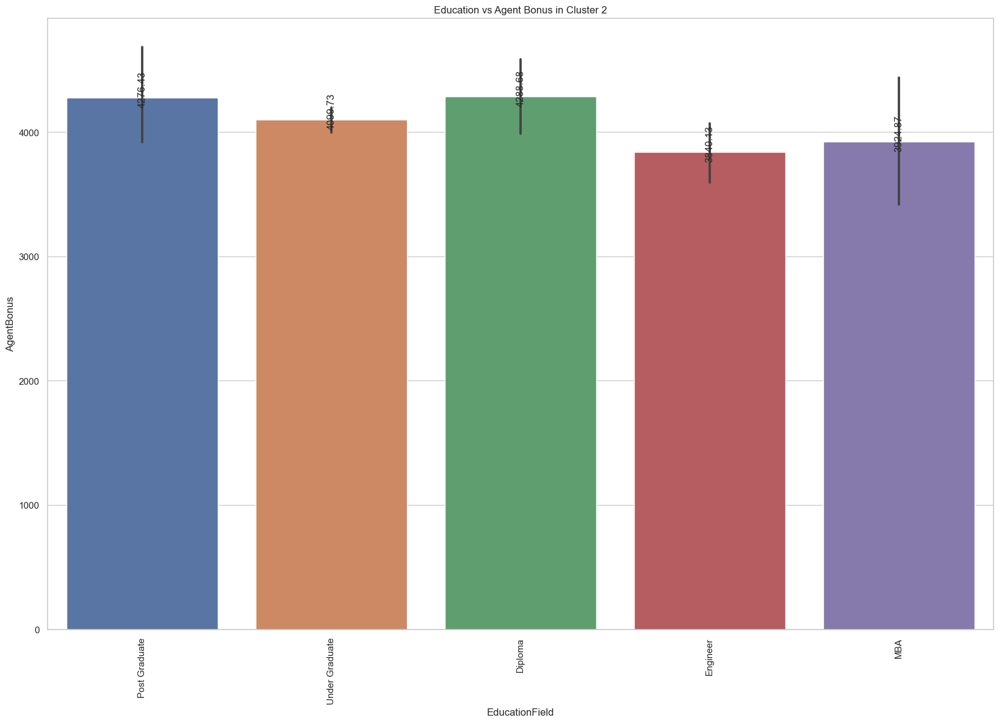

In [146]:
plt.figure(figsize=(20,13))
ax1=sns.barplot(x='EducationField', y='AgentBonus', data=clust_profile1)
plt.title('Education vs Agent Bonus in Cluster 2')
plt.xticks(rotation=90)
for p in ax1.patches:
    ax1.annotate(f"{p.get_height():.2f}", (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', rotation=90, xytext=(0, 10), textcoords='offset points')


plt.show()

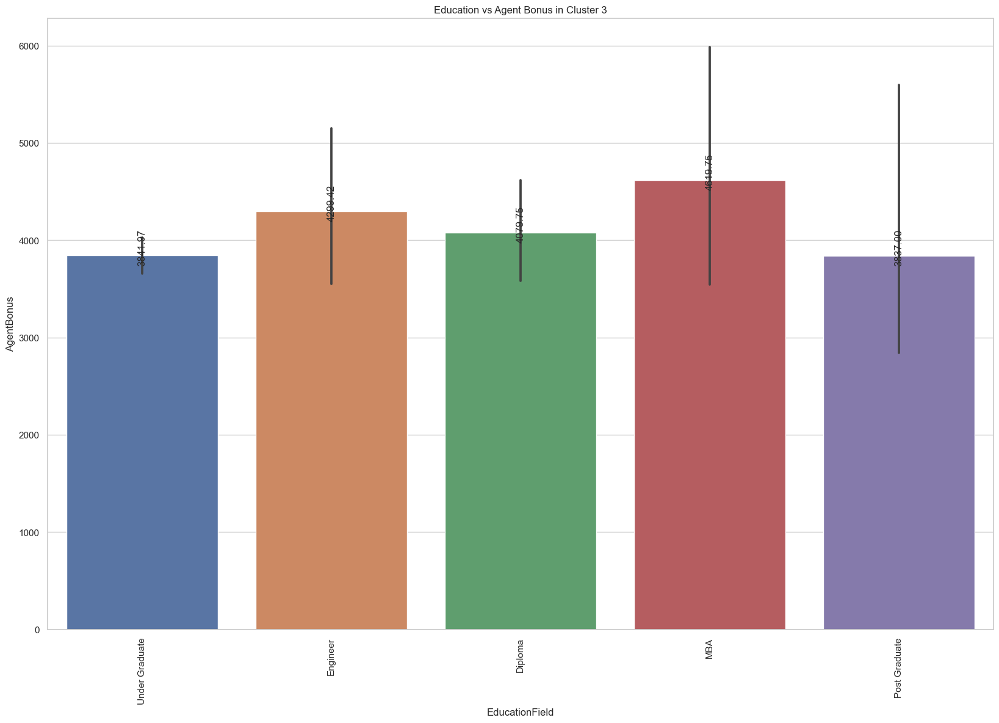

In [147]:
plt.figure(figsize=(20,13))
ax1=sns.barplot(x='EducationField', y='AgentBonus', data=clust_profile2)
plt.title('Education vs Agent Bonus in Cluster 3')
plt.xticks(rotation=90)
for p in ax1.patches:
    ax1.annotate(f"{p.get_height():.2f}", (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', rotation=90, xytext=(0, 10), textcoords='offset points')


plt.show()

<b> <font size=3 color="Green"> Agent bonus in Cluster 3 is highly received from MBA educational stream </font> </b>

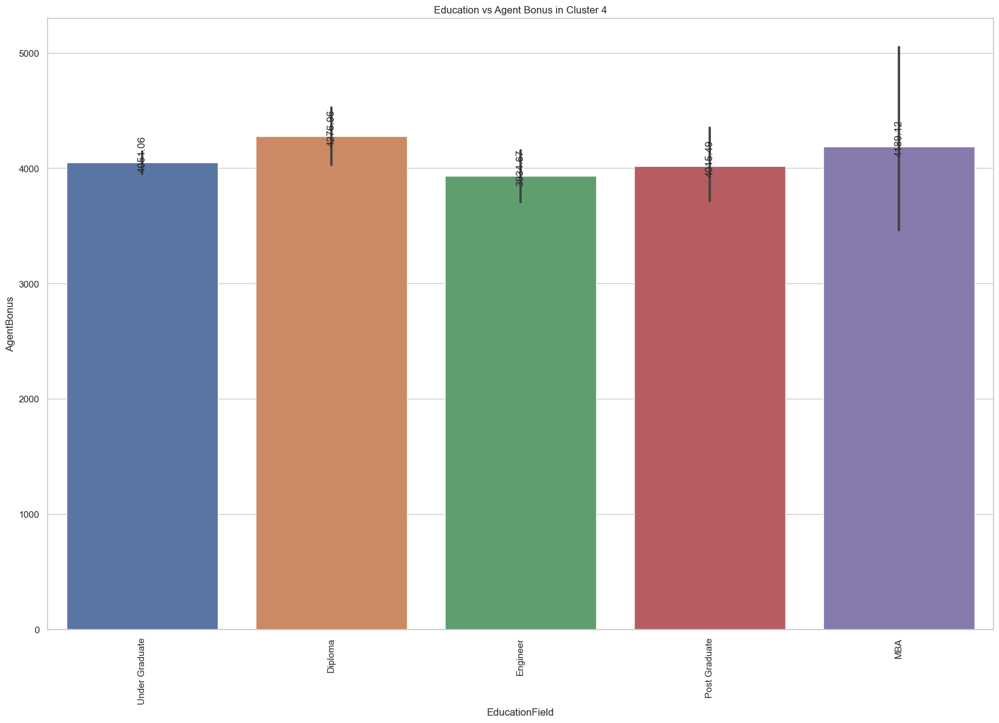

In [148]:
plt.figure(figsize=(20,13))
ax1=sns.barplot(x='EducationField', y='AgentBonus', data=clust_profile3)
plt.title('Education vs Agent Bonus in Cluster 4')
plt.xticks(rotation=90)
for p in ax1.patches:
    ax1.annotate(f"{p.get_height():.2f}", (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', rotation=90, xytext=(0, 10), textcoords='offset points')


plt.show()

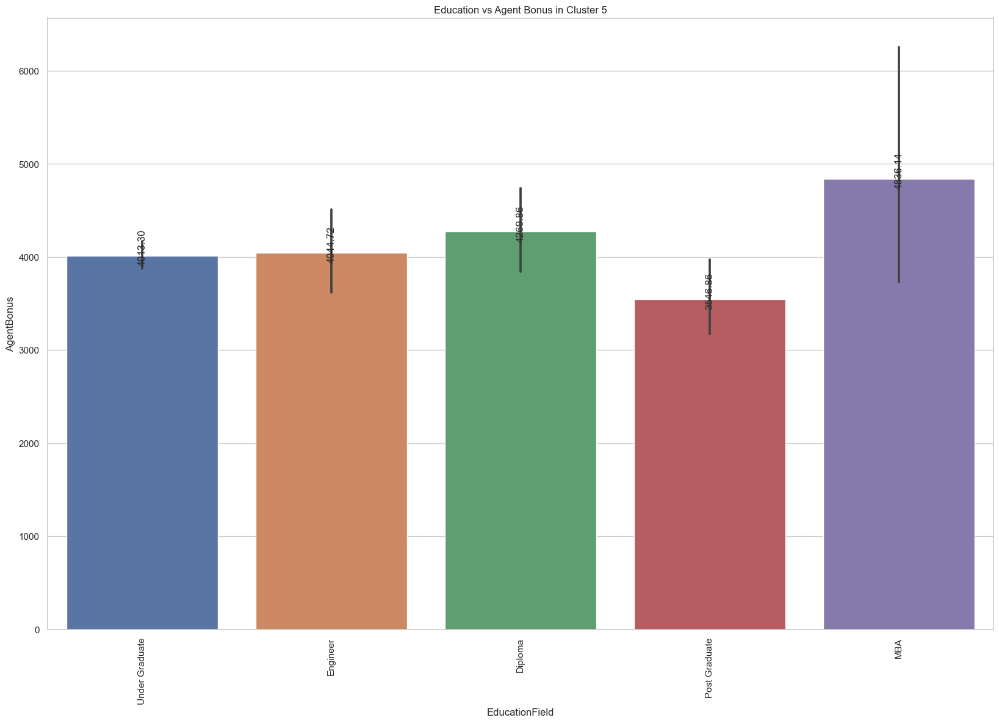

In [149]:
plt.figure(figsize=(20,13))
ax1=sns.barplot(x='EducationField', y='AgentBonus', data=clust_profile4)
plt.title('Education vs Agent Bonus in Cluster 5')
plt.xticks(rotation=90)
for p in ax1.patches:
    ax1.annotate(f"{p.get_height():.2f}", (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', rotation=90, xytext=(0, 10), textcoords='offset points')


plt.show()

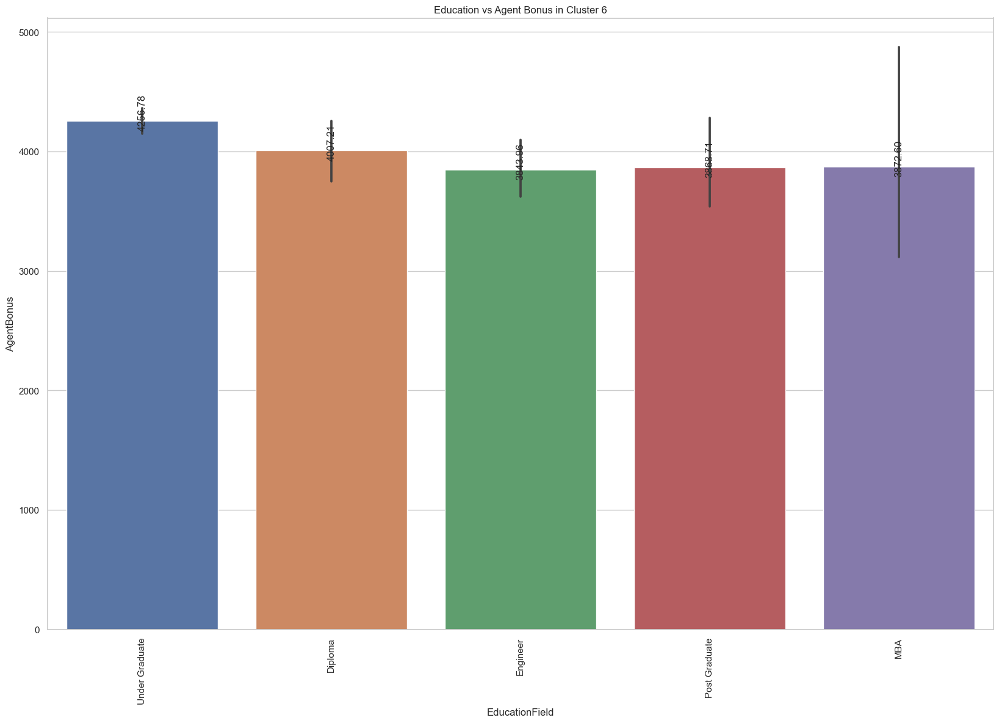

In [150]:
plt.figure(figsize=(20,13))
ax1=sns.barplot(x='EducationField', y='AgentBonus', data=clust_profile5)
plt.title('Education vs Agent Bonus in Cluster 6')
plt.xticks(rotation=90)
for p in ax1.patches:
    ax1.annotate(f"{p.get_height():.2f}", (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', rotation=90, xytext=(0, 10), textcoords='offset points')


plt.show()

<b> <font size=3 color="Green"> Agent bonus from Cluster 6 is highly recevied from Under Graduate professions </font> </b>

In [151]:
norm_num_cols = [col for col in lic_sales_imputed_combined.columns if lic_sales_imputed_combined[col].dtype != 'O']

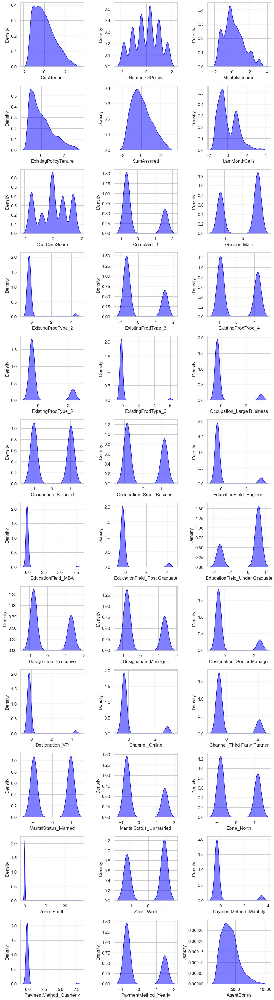

In [152]:
plot_univariate_numeric(lic_sales_imputed_combined,norm_num_cols,kind='density')

<b><font color='Green' size=5> Data has been normalised before imputing with help of standard scalar. </font> </b>

<b><font color='Green' size=5> Checking the collinearity within independent variables </font> </b>

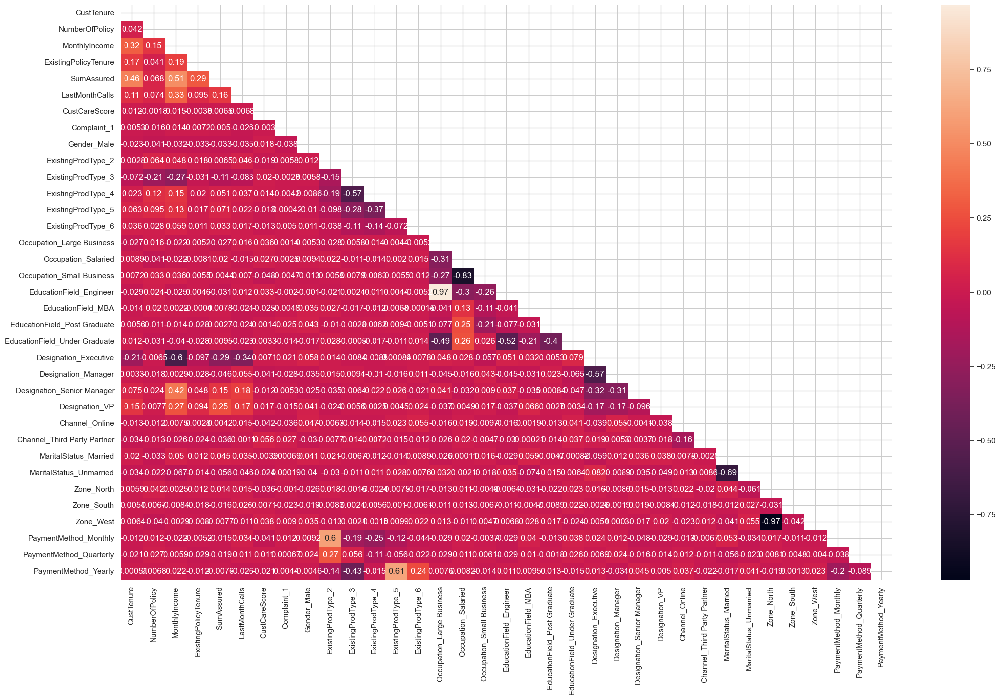

In [153]:
plt.figure(figsize=(25,15))
lic_sales_imputed_independ = lic_sales_imputed_combined.drop('AgentBonus', axis=1)
mask=np.triu(np.ones_like(lic_sales_imputed_independ.corr()))
sns.heatmap(lic_sales_imputed_independ.corr(),annot=True,mask=mask);

<b> <font color='Green' size=3> Education Engieer has strong correlation with Large business </font> </b>

<b> <font color='Green' size=3> Existing Product Type 5 has adequate correlation with Yearly payment method </font> </b>

<b> <font color='Green' size=3> Existing Product Type 2 has adequate correlation with Monthly payment method </font> </b>

<b> <font color='Green' size=3> Existing Policy Tenure has moderate correlation with Sum assured </font> </b>

<b> <font color='Green' size=3> Zone West has strong negative correlation with zone North </font> </b>

<b> <font color='Orange' size=5> We will use VIF to reduce the multicollinearity between variables </font> </b>

<b> <font color='Orange' size=5> We can even do PCA but it will be difficult to explain to business what each PCA components contains the realtionship between variables </font> </b>

In [154]:
lic_sales_impute_copy = lic_sales_imputed_combined.copy()

In [155]:
vif_data = pd.DataFrame()
vif_data["feature"] = lic_sales_impute_copy.columns

In [156]:
def calc_vif(X): 

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [157]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_data["VIF"] = [variance_inflation_factor(lic_sales_impute_copy.values, i)
                          for i in range(len(lic_sales_impute_copy.columns))]
print(vif_data)

                          feature         VIF
0                      CustTenure    1.292096
1                  NumberOfPolicy    1.113614
2                   MonthlyIncome    3.462909
3            ExistingPolicyTenure    1.111870
4                      SumAssured    1.685543
5                  LastMonthCalls    1.207773
6                   CustCareScore    1.019713
7                     Complaint_1    1.010296
8                     Gender_Male    1.024097
9              ExistingProdType_2    2.329162
10             ExistingProdType_3   31.359621
11             ExistingProdType_4   37.791040
12             ExistingProdType_5   22.339420
13             ExistingProdType_6    5.278245
14      Occupation_Large Business  204.332903
15            Occupation_Salaried  572.080930
16      Occupation_Small Business  560.870751
17        EducationField_Engineer   16.975672
18             EducationField_MBA    1.252976
19   EducationField_Post Graduate    1.746146
20  EducationField_Under Graduate 

<b> <font color='Orange' size=5> VIF shows Occupation_Salaried has high multicollinearity </font> </b>

> <b> <font color='Orange' size=5> We remove Occupation_Salaried variable and calculate once again </font> </b>

In [158]:
X = lic_sales_impute_copy.drop('Occupation_Salaried', axis=1)
calc_vif(X)
print(calc_vif(X))

                        variables        VIF
0                      CustTenure   1.291738
1                  NumberOfPolicy   1.113613
2                   MonthlyIncome   3.462450
3            ExistingPolicyTenure   1.111854
4                      SumAssured   1.684887
5                  LastMonthCalls   1.207620
6                   CustCareScore   1.019712
7                     Complaint_1   1.009326
8                     Gender_Male   1.023840
9              ExistingProdType_2   2.329151
10             ExistingProdType_3  31.359486
11             ExistingProdType_4  37.790601
12             ExistingProdType_5  22.339140
13             ExistingProdType_6   5.278242
14      Occupation_Large Business  16.178800
15      Occupation_Small Business   1.366096
16        EducationField_Engineer  16.975594
17             EducationField_MBA   1.252976
18   EducationField_Post Graduate   1.739523
19  EducationField_Under Graduate   2.508842
20          Designation_Executive   6.301195
21        

<b> <font color='Orange' size=5> VIF shows ExistingProdType_4 has high multicollinearity </font> </b>

> <b> <font color='Orange' size=5> We remove ExistingProdType_4 variable and calculate once again </font> </b>

In [159]:
X = lic_sales_impute_copy.drop(['Occupation_Salaried','ExistingProdType_4'], axis=1)
print(calc_vif(X))

                        variables        VIF
0                      CustTenure   1.291386
1                  NumberOfPolicy   1.103109
2                   MonthlyIncome   3.373998
3            ExistingPolicyTenure   1.111723
4                      SumAssured   1.684886
5                  LastMonthCalls   1.207312
6                   CustCareScore   1.019562
7                     Complaint_1   1.009322
8                     Gender_Male   1.023815
9              ExistingProdType_2   1.862187
10             ExistingProdType_3   1.770395
11             ExistingProdType_5   1.906832
12             ExistingProdType_6   1.205498
13      Occupation_Large Business  15.906571
14      Occupation_Small Business   1.364808
15        EducationField_Engineer  16.724041
16             EducationField_MBA   1.252882
17   EducationField_Post Graduate   1.738438
18  EducationField_Under Graduate   2.507906
19          Designation_Executive   6.242853
20            Designation_Manager   4.544159
21     Des

<b> <font color='Orange' size=5> VIF shows Zone_North has high multicollinearity </font> </b>

> <b> <font color='Orange' size=5> We remove Zone_North variable and calculate once again </font> </b>

In [160]:
X = lic_sales_impute_copy.drop(['Occupation_Salaried','ExistingProdType_4','Zone_North'], axis=1)
print(calc_vif(X))

                        variables        VIF
0                      CustTenure   1.291217
1                  NumberOfPolicy   1.103039
2                   MonthlyIncome   3.373492
3            ExistingPolicyTenure   1.111721
4                      SumAssured   1.683041
5                  LastMonthCalls   1.205513
6                   CustCareScore   1.019479
7                     Complaint_1   1.008572
8                     Gender_Male   1.023233
9              ExistingProdType_2   1.862179
10             ExistingProdType_3   1.770088
11             ExistingProdType_5   1.906797
12             ExistingProdType_6   1.205441
13      Occupation_Large Business  15.905806
14      Occupation_Small Business   1.364120
15        EducationField_Engineer  16.723781
16             EducationField_MBA   1.251127
17   EducationField_Post Graduate   1.735635
18  EducationField_Under Graduate   2.505706
19          Designation_Executive   6.216455
20            Designation_Manager   4.537470
21     Des

<b> <font color='Orange' size=5> VIF shows EducationField_Engineer has high multicollinearity </font> </b>

> <b> <font color='Orange' size=5> We remove EducationField_Engineer variable and calculate once again </font> </b>

In [161]:
X = lic_sales_impute_copy.drop(['Occupation_Salaried','ExistingProdType_4','Zone_North','EducationField_Engineer'], axis=1)
print(calc_vif(X))

                        variables       VIF
0                      CustTenure  1.291214
1                  NumberOfPolicy  1.102247
2                   MonthlyIncome  3.373325
3            ExistingPolicyTenure  1.111574
4                      SumAssured  1.683025
5                  LastMonthCalls  1.205342
6                   CustCareScore  1.019479
7                     Complaint_1  1.008331
8                     Gender_Male  1.022757
9              ExistingProdType_2  1.859926
10             ExistingProdType_3  1.770067
11             ExistingProdType_5  1.906579
12             ExistingProdType_6  1.205419
13      Occupation_Large Business  2.033799
14      Occupation_Small Business  1.353758
15             EducationField_MBA  1.238665
16   EducationField_Post Graduate  1.696269
17  EducationField_Under Graduate  2.368301
18          Designation_Executive  6.215953
19            Designation_Manager  4.536742
20     Designation_Senior Manager  2.635982
21                 Designation_V

<b> <font color='Orange' size=5> VIF shows Designation_Executive has high multicollinearity </font> </b>

> <b> <font color='Orange' size=5> We remove Designation_Executive variable and calculate once again </font> </b>

In [162]:
X = lic_sales_impute_copy.drop(['Occupation_Salaried','ExistingProdType_4','Zone_North','EducationField_Engineer','Designation_Executive'], axis=1)
print(calc_vif(X))

                        variables       VIF
0                      CustTenure  1.285882
1                  NumberOfPolicy  1.100433
2                   MonthlyIncome  2.440349
3            ExistingPolicyTenure  1.111522
4                      SumAssured  1.675600
5                  LastMonthCalls  1.169556
6                   CustCareScore  1.017779
7                     Complaint_1  1.008240
8                     Gender_Male  1.020797
9              ExistingProdType_2  1.851437
10             ExistingProdType_3  1.654230
11             ExistingProdType_5  1.857174
12             ExistingProdType_6  1.185330
13      Occupation_Large Business  2.027353
14      Occupation_Small Business  1.353248
15             EducationField_MBA  1.236768
16   EducationField_Post Graduate  1.694212
17  EducationField_Under Graduate  2.364527
18            Designation_Manager  1.324687
19     Designation_Senior Manager  1.722354
20                 Designation_VP  1.341276
21                 Channel_Onlin

In [163]:
X.head()

,CustTenure,NumberOfPolicy,MonthlyIncome,ExistingPolicyTenure,SumAssured,LastMonthCalls,CustCareScore,Complaint_1,Gender_Male,ExistingProdType_2,...,Channel_Online,Channel_Third Party Partner,MaritalStatus_Married,MaritalStatus_Unmarried,Zone_South,Zone_West,PaymentMethod_Monthly,PaymentMethod_Quarterly,PaymentMethod_Yearly,AgentBonus
0,0.710211,-1.075287,1.950693,0.557214,2.818822,-1.002006,-0.048880,-0.634709,-1.211301,-0.226732,...,-0.339851,-0.484044,-1.003546,1.456553,-0.036458,0.872638,-0.291502,-0.130774,-0.681674,6545.0
1,2.392689,1.672412,0.391232,1.160356,0.229619,0.103049,-1.495207,1.575525,-1.211301,-0.226732,...,-0.339851,-0.484044,-1.003546,1.456553,-0.036458,-1.145951,-0.291502,-0.130774,-0.681674,5724.0
2,1.311096,-1.075287,-0.220811,-0.649070,-0.700662,-0.173215,1.397447,-0.634709,-1.211301,-0.226732,...,-0.339851,2.065930,-1.003546,1.456553,-0.036458,-1.145951,-0.291502,-0.130774,1.466977,4202.0
3,0.109326,0.985488,1.816413,-0.649070,0.953754,0.931839,-1.495207,-0.634709,0.825559,-0.226732,...,2.942468,-0.484044,0.996466,-0.686552,-0.036458,-1.145951,-0.291502,-0.130774,-0.681674,4912.0
4,-0.451499,-0.388362,-1.087143,-1.010955,-0.750831,0.655576,0.674284,1.575525,-1.211301,-0.226732,...,-0.339851,-0.484044,0.996466,-0.686552,-0.036458,0.872638,-0.291502,-0.130774,-0.681674,2384.0


<b> <font size=3 color='Green'> After removing all the variable that had high multicollinearity the final DataFrame has above features </font> </b>

<b> <font size=3 color='Green'> We will split train and test data in a ratio of 70:30 and fit the models using train dataset </font> </b>

In [164]:
lic_sales_X = X.drop('AgentBonus', axis=1)
lic_sales_y = X['AgentBonus']

In [165]:
lic_sales_train_X, lic_sales_test_X, lic_sales_train_y, lic_sales_test_y = train_test_split(lic_sales_X, lic_sales_y, test_size = 0.3, random_state=42)

In [166]:
print('shape of X train dataset:', lic_sales_train_X.shape)
print('shape of X test dataset:', lic_sales_test_X.shape)
print('shape of y train dataset:', lic_sales_train_y.shape)
print('shape of y test dataset:', lic_sales_test_y.shape)

shape of X train dataset: (3164, 30)
shape of X test dataset: (1356, 30)
shape of y train dataset: (3164,)
shape of y test dataset: (1356,)


<b> <font size=5 color='Green'> Model building using OLS Stats model </font> </b>

In [167]:
import statsmodels.api as sm
lic_sales_train_X_ols = sm.add_constant(lic_sales_train_X)

In [168]:
result=sm.OLS(lic_sales_train_y,lic_sales_train_X_ols).fit()

In [169]:
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:             AgentBonus   R-squared:                       0.806
Model:                            OLS   Adj. R-squared:                  0.804
Method:                 Least Squares   F-statistic:                     432.7
Date:                Tue, 20 Aug 2024   Prob (F-statistic):               0.00
Time:                        05:27:52   Log-Likelihood:                -24830.
No. Observations:                3164   AIC:                         4.972e+04
Df Residuals:                    3133   BIC:                         4.991e+04
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const         

In [170]:
ols_y_pred_train=result.predict(lic_sales_train_X_ols)

<b> <font size=3 color='Green'> Looking at summary the p-value of EducationField_Post Graduate is very high than 0.05 and hence we will remove that feature and fit again </font> </b>

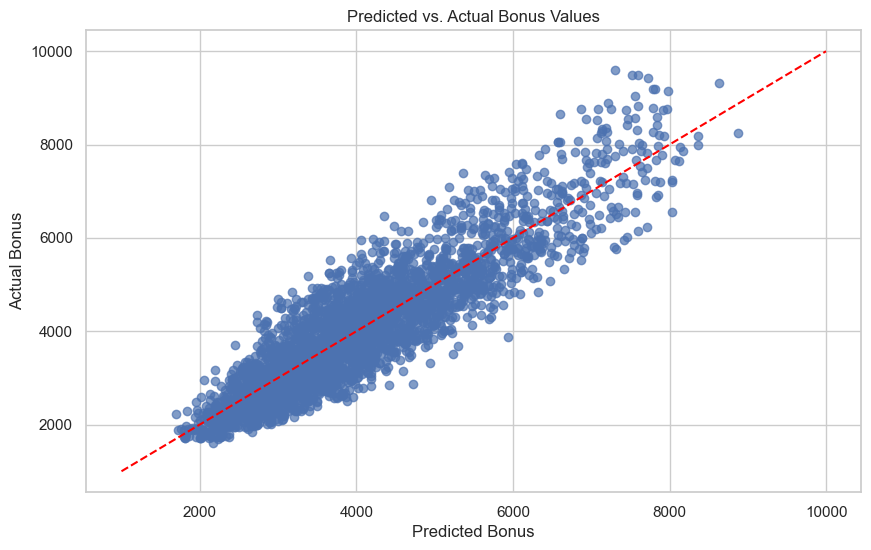

In [171]:
plt.figure(figsize=(10, 6))
plt.scatter(ols_y_pred_train, lic_sales_train_y, alpha=0.7)
plt.plot([1000, 9999], [1000, 9999], color='red', linestyle='--')  # Perfect prediction line
plt.xlabel('Predicted Bonus')
plt.ylabel('Actual Bonus')
plt.title('Predicted vs. Actual Bonus Values')
plt.grid(True)
plt.show()

In [172]:
mape_OLS = round(mean_absolute_percentage_error(lic_sales_train_y, ols_y_pred_train),2)

In [173]:
lic_sales_test_X_ols = sm.add_constant(lic_sales_test_X)

In [174]:
ols_y_pred_test=result.predict(lic_sales_test_X_ols)

In [175]:
mape_OLS_test = round(mean_absolute_percentage_error(lic_sales_test_y, ols_y_pred_test),2)

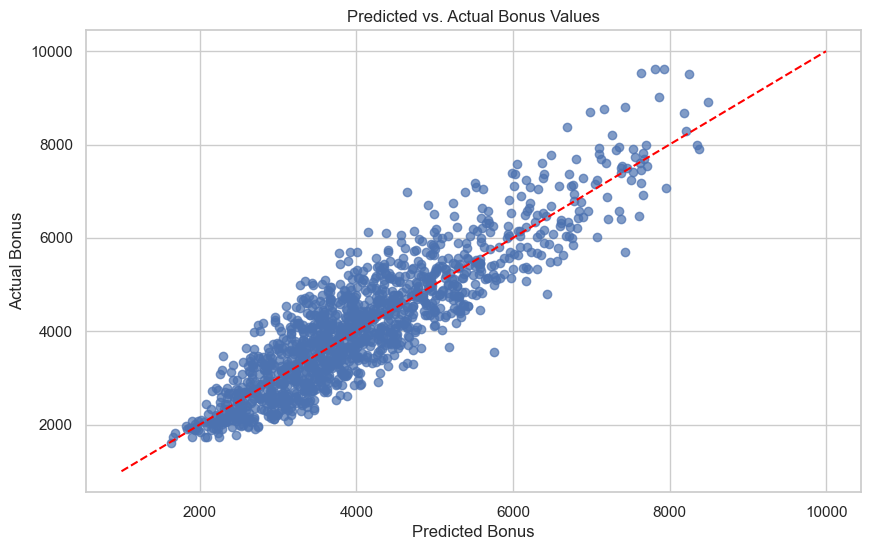

In [176]:
plt.figure(figsize=(10, 6))
plt.scatter(ols_y_pred_test, lic_sales_test_y, alpha=0.7)
plt.plot([1000, 9999], [1000, 9999], color='red', linestyle='--')  # Perfect prediction line
plt.xlabel('Predicted Bonus')
plt.ylabel('Actual Bonus')
plt.title('Predicted vs. Actual Bonus Values')
plt.grid(True)
plt.show()

In [177]:
ols_residual = result.resid

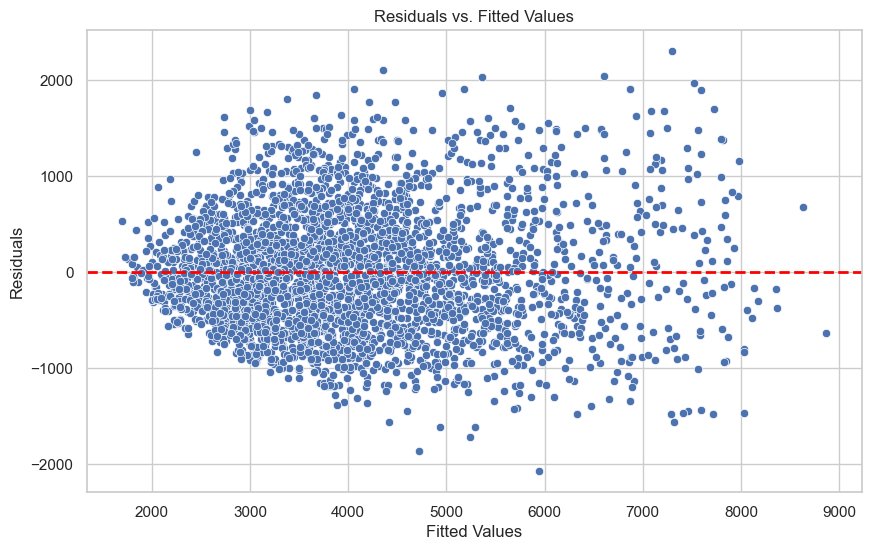

In [178]:
# Scatter plot of residuals vs. fitted values
plt.figure(figsize=(10, 6))
sns.scatterplot(x=result.fittedvalues, y=ols_residual)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)  # Add a horizontal line at y=0
plt.title('Residuals vs. Fitted Values')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.show()

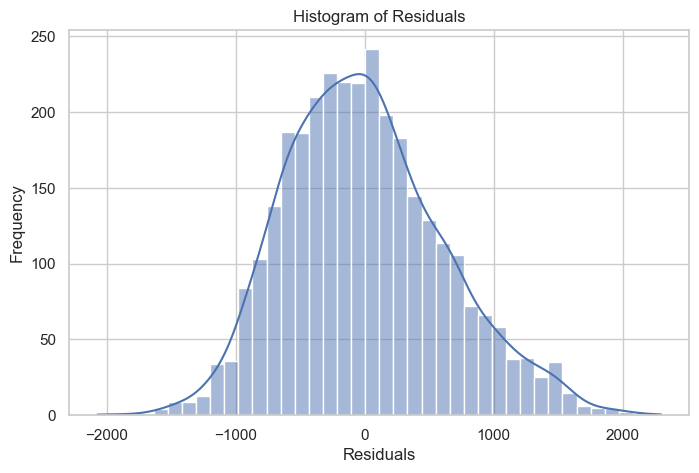

In [179]:
plt.figure(figsize=(8, 5))
sns.histplot(ols_residual, kde=True)
plt.title('Histogram of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

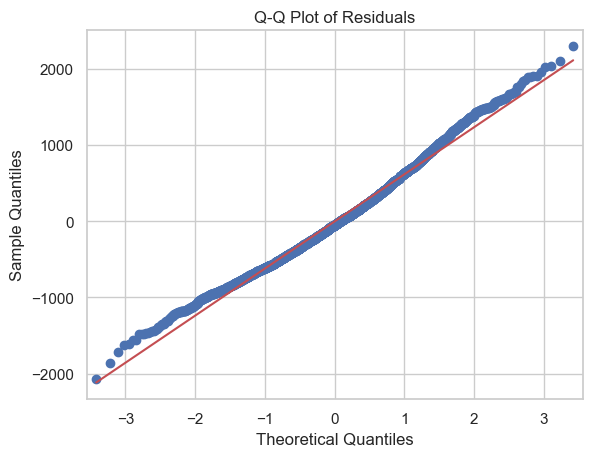

In [180]:
sm.qqplot(ols_residual, line='s')
plt.title('Q-Q Plot of Residuals')
plt.show()

In [181]:
rmse_train=[]
rmse_test=[]
mape_train=[]
mape_test=[]
rsquared_train=[]
rsquared_test=[]
adjrsquared_train=[]
adjrsquared_test=[]

In [182]:
rsquared_ols = round(result.rsquared,2)
rsquared_train.append(round(result.rsquared,2))

In [183]:
adjrsquared_ols = round(result.rsquared_adj,2)
adjrsquared_train.append(round(result.rsquared_adj,2))

In [184]:
mape_train.append(mape_OLS)

In [185]:
mape_test.append(mape_OLS_test)

In [186]:
ols_y_pred_train = result.predict(lic_sales_train_X_ols)

In [187]:
ols_rmse_train = round(np.sqrt(mean_squared_error(lic_sales_train_y, ols_y_pred_train)),2)

In [188]:
rmse_train.append(ols_rmse_train)

In [189]:
lic_sales_test_X_ols = sm.add_constant(lic_sales_test_X)

In [190]:
ols_y_pred_test = result.predict(lic_sales_test_X_ols)

In [191]:
#rsquared_ols_test = round(1 - (np.sum((lic_sales_test_y - ols_y_pred_test)**2) / np.sum((lic_sales_test_y - np.mean(lic_sales_test_y))**2)),2)

In [192]:
#rsquared_ols_train = round(1 - (np.sum((lic_sales_train_y - ols_y_pred_train)**2) / np.sum((lic_sales_train_y - np.mean(lic_sales_train_y))**2)),2)

In [193]:
#rsquared_train.append(rsquared_ols_train)

In [194]:
rsquared_ols_test = round(r2_score(lic_sales_test_y, ols_y_pred_test),2)

In [195]:
rsquared_test.append(rsquared_ols_test)

In [196]:
#adjrsquared_ols_train = round(1 - (1 - rsquared_ols_train) * (len(lic_sales_train_y) - 1) / (len(lic_sales_train_y) - lic_sales_train_X.shape[1] - 1),2)

In [197]:
adjrsquared_ols_test = round(1 - (1 - rsquared_ols_test) * (len(lic_sales_test_y) - 1) / (len(lic_sales_test_y) - lic_sales_train_X.shape[1] - 1),2)

In [198]:
#adjrsquared_train.append(adjrsquared_ols_train)
adjrsquared_test.append(adjrsquared_ols_test)
rmse_test.append(round(np.sqrt(mean_squared_error(lic_sales_test_y, ols_y_pred_test)),2))

In [199]:
rmse_train

[619.38]

<b> <font size=5 color='Green'> Model building using Linear Regression  </font> </b>

In [200]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error
lic_sales_LR=LinearRegression()

In [201]:
lic_sales_LR.fit(lic_sales_train_X, lic_sales_train_y)

LinearRegression()

In [202]:
LR_r_squared_train = lic_sales_LR.score(lic_sales_train_X, lic_sales_train_y)
n_train = len(lic_sales_train_y)
k_train = lic_sales_train_X.shape[1]
adjrsquared_train.append(round(1 - (1 - LR_r_squared_train) * (n_train - 1) / (n_train - k_train - 1),2))
LR_r_squared_test = lic_sales_LR.score(lic_sales_test_X, lic_sales_test_y)
n_test = len(lic_sales_test_y)
k_test = lic_sales_test_X.shape[1]
adjrsquared_test.append(round(1 - (1 - LR_r_squared_test) * (n_test - 1) / (n_test - k_test - 1),2))

In [203]:
LR_y_pred_train = lic_sales_LR.predict(lic_sales_train_X)
LR_y_pred_test = lic_sales_LR.predict(lic_sales_test_X)

In [204]:
mape_LR_train = round(mean_absolute_percentage_error(lic_sales_train_y, LR_y_pred_train),2)
mape_LR_test = round(mean_absolute_percentage_error(lic_sales_test_y, LR_y_pred_test),2)

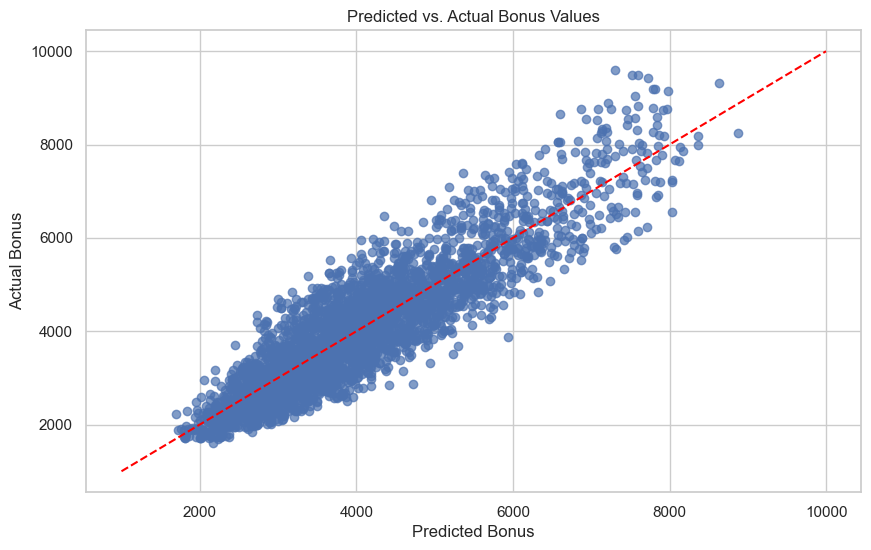

In [205]:
plt.figure(figsize=(10, 6))
plt.scatter(LR_y_pred_train , lic_sales_train_y, alpha=0.7)
plt.plot([1000, 9999], [1000, 9999], color='red', linestyle='--')  # Perfect prediction line
plt.xlabel('Predicted Bonus')
plt.ylabel('Actual Bonus')
plt.title('Predicted vs. Actual Bonus Values')
plt.grid(True)
plt.show()

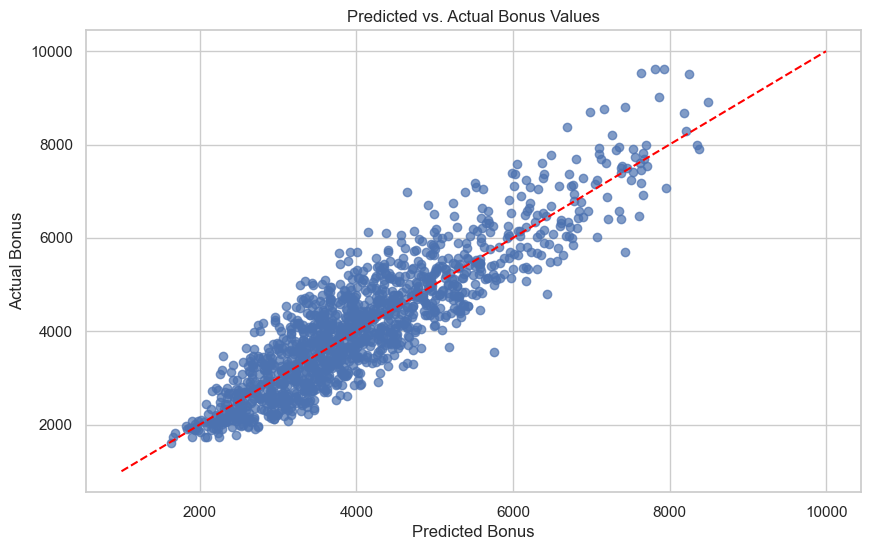

In [206]:
plt.figure(figsize=(10, 6))
plt.scatter(LR_y_pred_test , lic_sales_test_y, alpha=0.7)
plt.plot([1000, 9999], [1000, 9999], color='red', linestyle='--')  # Perfect prediction line
plt.xlabel('Predicted Bonus')
plt.ylabel('Actual Bonus')
plt.title('Predicted vs. Actual Bonus Values')
plt.grid(True)
plt.show()

In [207]:
LR_mse=mean_squared_error(lic_sales_train_y,lic_sales_LR.predict(lic_sales_train_X))
print('Mean Squared Error train:', LR_mse) 
LR_mse_test=mean_squared_error(lic_sales_test_y,lic_sales_LR.predict(lic_sales_test_X))
mape_train.append(mape_LR_train)
mape_test.append(mape_LR_test)
print('Mean Squared Error test:', LR_mse_test)
rmse_train.append(round(np.sqrt(LR_mse),2))
print('Root Mean Squart Error train:', rmse_train)
rmse_test.append(round(np.sqrt(LR_mse_test),2))
print('Root Mean Squart Error test:', rmse_test)
rsquared_train.append(round(r2_score(lic_sales_train_y,lic_sales_LR.predict(lic_sales_train_X)),2))
print('R squared value train:', rsquared_train)
rsquared_test.append(round(r2_score(lic_sales_test_y,lic_sales_LR.predict(lic_sales_test_X)),2))
print('R squared value train:', rsquared_test)
print('Intercept:', lic_sales_LR.intercept_)

Mean Squared Error train: 383630.08687882754
Mean Squared Error test: 394641.66054461343
Root Mean Squart Error train: [619.38, 619.38]
Root Mean Squart Error test: [628.21, 628.21]
R squared value train: [0.81, 0.81]
R squared value train: [0.8, 0.8]
Intercept: 3983.9573597934786


In [208]:
LR_train_residuals = lic_sales_train_y - LR_y_pred_train
LR_test_residuals = lic_sales_test_y - LR_y_pred_test

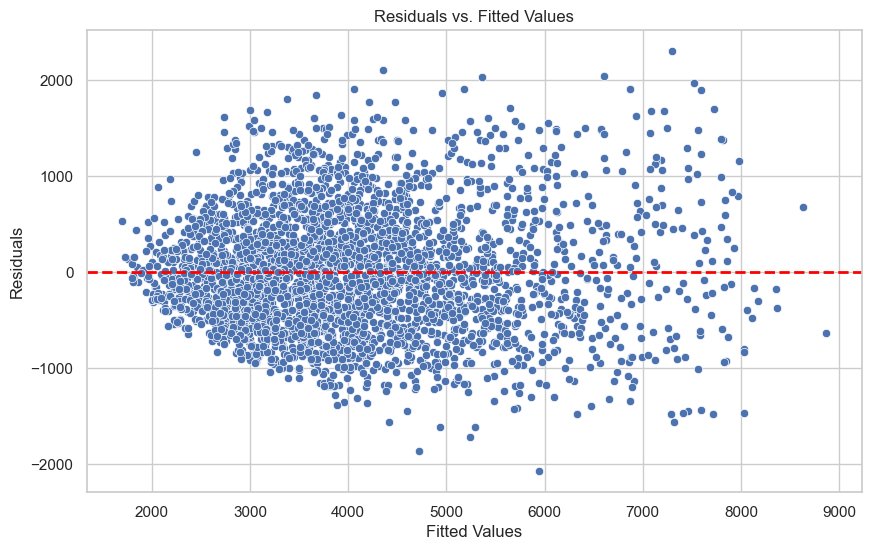

In [209]:
# Scatter plot of residuals vs. fitted values
plt.figure(figsize=(10, 6))
sns.scatterplot(x=LR_y_pred_train, y=LR_train_residuals)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)  # Add a horizontal line at y=0
plt.title('Residuals vs. Fitted Values')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.show()

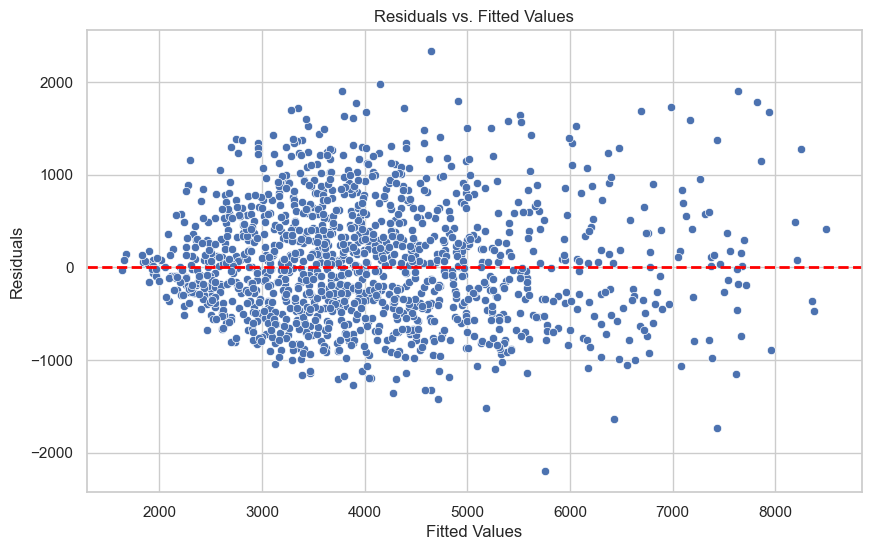

In [210]:
# Scatter plot of residuals vs. fitted values
plt.figure(figsize=(10, 6))
sns.scatterplot(x=LR_y_pred_test, y=LR_test_residuals)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)  # Add a horizontal line at y=0
plt.title('Residuals vs. Fitted Values')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.show()

In [211]:
for col in range(0,len(lic_sales_train_X.columns)):
    print(f"Coefficient value of {lic_sales_train_X.columns[col]} : {lic_sales_LR.coef_[col]}")

Coefficient value of CustTenure : 199.23754456006296
Coefficient value of NumberOfPolicy : -21.76743129770557
Coefficient value of MonthlyIncome : 409.70240303802075
Coefficient value of ExistingPolicyTenure : 93.91380712445498
Coefficient value of SumAssured : 811.7418346436928
Coefficient value of LastMonthCalls : -20.984236319344177
Coefficient value of CustCareScore : 5.396077895244828
Coefficient value of Complaint_1 : 6.854787832607226
Coefficient value of Gender_Male : -15.48366872394957
Coefficient value of ExistingProdType_2 : -22.84742437537807
Coefficient value of ExistingProdType_3 : 60.478958659477186
Coefficient value of ExistingProdType_5 : -25.259361706578744
Coefficient value of ExistingProdType_6 : -13.287788135907789
Coefficient value of Occupation_Large Business : -24.103323705596452
Coefficient value of Occupation_Small Business : -19.455786391152518
Coefficient value of EducationField_MBA : -25.72995695302242
Coefficient value of EducationField_Post Graduate : -0.

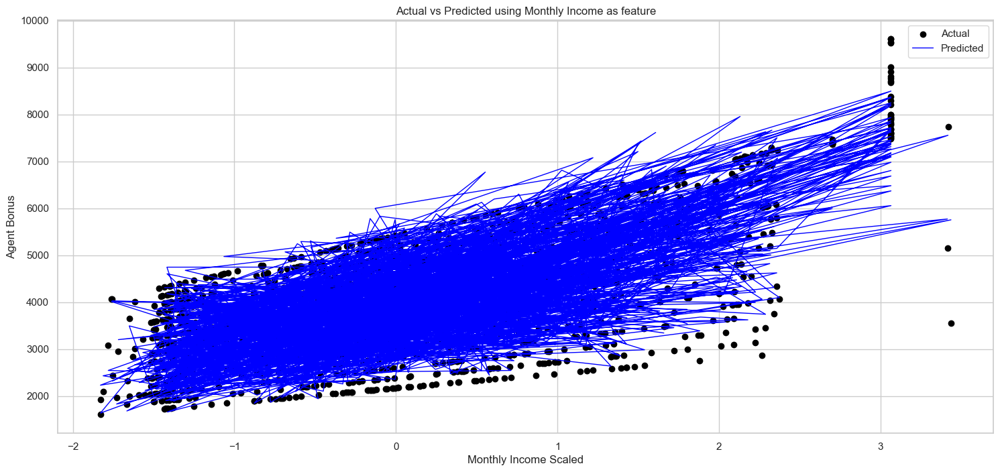

In [212]:
plt.figure(figsize=(18,8))
plt.scatter(lic_sales_test_X.iloc[:,2], lic_sales_test_y, color="black", label='Actual')
plt.plot(lic_sales_test_X.iloc[:,2], lic_sales_LR.predict(lic_sales_test_X), color="blue", linewidth=1, label='Predicted')
plt.title('Actual vs Predicted using Monthly Income as feature')
plt.xlabel('Monthly Income Scaled')
plt.ylabel('Agent Bonus')
plt.xticks()
plt.yticks()
plt.legend()
plt.show()

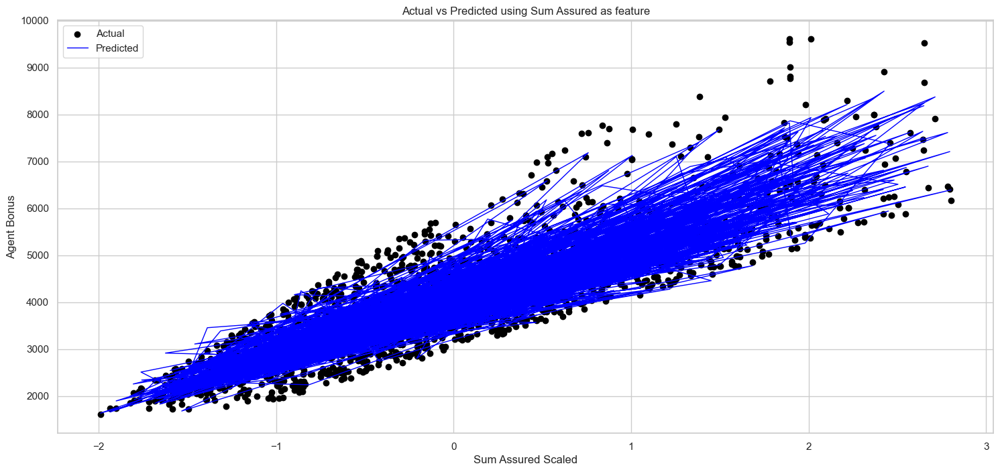

In [213]:
plt.figure(figsize=(18,8))
plt.scatter(lic_sales_test_X.iloc[:,4], lic_sales_test_y, color="black", label='Actual')
plt.plot(lic_sales_test_X.iloc[:,4], lic_sales_LR.predict(lic_sales_test_X), color="blue", linewidth=1, label='Predicted')
plt.title('Actual vs Predicted using Sum Assured as feature')
plt.xlabel('Sum Assured Scaled')
plt.ylabel('Agent Bonus')
plt.xticks()
plt.yticks()
plt.legend()
plt.show()

<b> <font color='Green' size=3> the coefficient above shows there are several negative and positive values </font> </b>

<b> <font color='Green' size=3> most influencial positive coefficient are SumAssured, MonthlyIncome, Designation_VP, CustTenure, PaymentMethod Monthly and Yearly </font> </b>

<b> <font color='Green' size=3> most influencial negative coefficient are Designation_senior_manager, Numberofpolicy, lastmonthcalls etc. </font> </b>

<b> <font size=5 color='Green'> Model building using Lasso Regression  </font> </b>

In [214]:
from sklearn.linear_model import Lasso, LassoCV

In [215]:
alpha = 0.1
lasso_reg = Lasso(alpha=alpha, random_state=42)
lasso_reg.fit(lic_sales_train_X, lic_sales_train_y)

Lasso(alpha=0.1, random_state=42)

In [216]:
lasso_mse_train = mean_squared_error(lic_sales_train_y, lasso_reg.predict(lic_sales_train_X))
print(np.sqrt(lasso_mse_train))

619.3793679746393


In [217]:
lasso_y_pred_test = lasso_reg.predict(lic_sales_test_X)

In [218]:
lasso_mse_test = mean_squared_error(lic_sales_test_y, lasso_y_pred_test)
print(np.sqrt(lasso_mse_test))

628.1391814648291


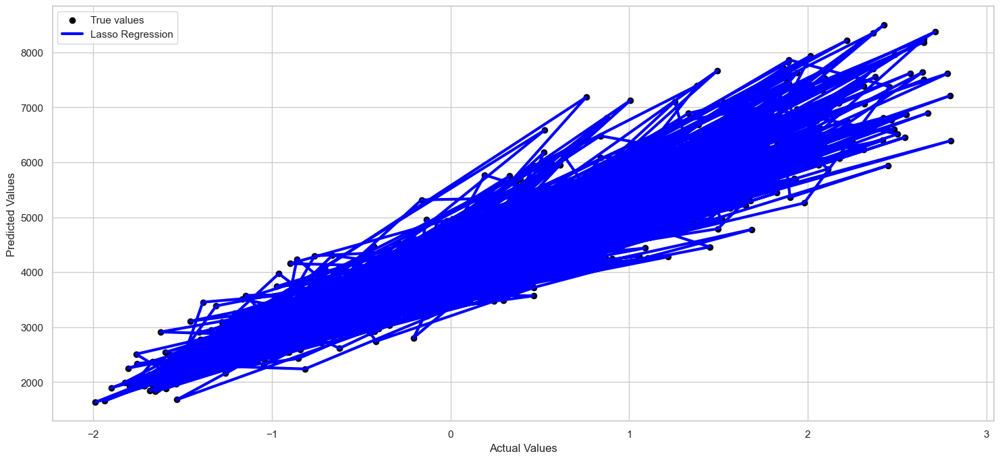

In [219]:
plt.figure(figsize=(18,8))
plt.scatter(lic_sales_test_X.iloc[:,4], lasso_y_pred_test, color='black', label='True values')
plt.plot(lic_sales_test_X.iloc[:,4], lasso_y_pred_test, color='blue', linewidth=3, label='Lasso Regression')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()

In [220]:
lasso_coefficient = lasso_reg.coef_

In [221]:
lasso_variable = lic_sales_train_X.columns

In [222]:
lasso_coefficients_df = pd.DataFrame({'Variable': lasso_variable, 'Coefficient': lasso_coefficient})

In [223]:
print(lasso_coefficients_df)

                         Variable  Coefficient
0                      CustTenure   199.138761
1                  NumberOfPolicy   -21.731812
2                   MonthlyIncome   409.342969
3            ExistingPolicyTenure    93.869966
4                      SumAssured   811.723577
5                  LastMonthCalls   -20.844695
6                   CustCareScore     5.316581
7                     Complaint_1     6.781263
8                     Gender_Male   -15.393783
9              ExistingProdType_2   -22.472949
10             ExistingProdType_3    60.148950
11             ExistingProdType_5   -24.837592
12             ExistingProdType_6   -13.033668
13      Occupation_Large Business   -23.549750
14      Occupation_Small Business   -19.091777
15             EducationField_MBA   -25.402708
16   EducationField_Post Graduate    -0.000000
17  EducationField_Under Graduate    -6.571861
18            Designation_Manager  -137.122356
19     Designation_Senior Manager  -150.882365
20           

In [224]:
lasso_y_pred_train = lasso_reg.predict(lic_sales_train_X)
lasso_y_pred_test = lasso_reg.predict(lic_sales_test_X)

In [225]:
mape_lasso_train = round(mean_absolute_percentage_error(lic_sales_train_y, lasso_y_pred_train),2)
mape_lasso_test = round(mean_absolute_percentage_error(lic_sales_test_y, lasso_y_pred_test),2)

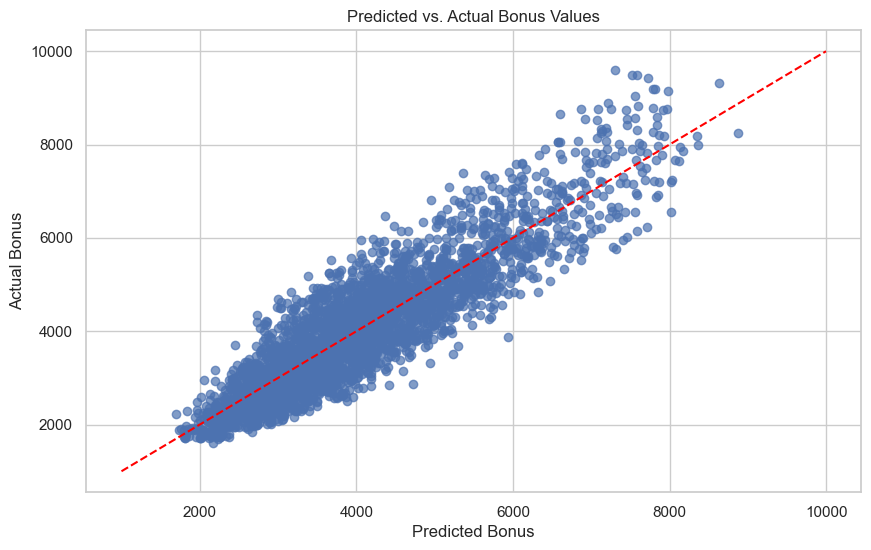

In [226]:
plt.figure(figsize=(10, 6))
plt.scatter(lasso_y_pred_train , lic_sales_train_y, alpha=0.7)
plt.plot([1000, 9999], [1000, 9999], color='red', linestyle='--')  # Perfect prediction line
plt.xlabel('Predicted Bonus')
plt.ylabel('Actual Bonus')
plt.title('Predicted vs. Actual Bonus Values')
plt.grid(True)
plt.show()

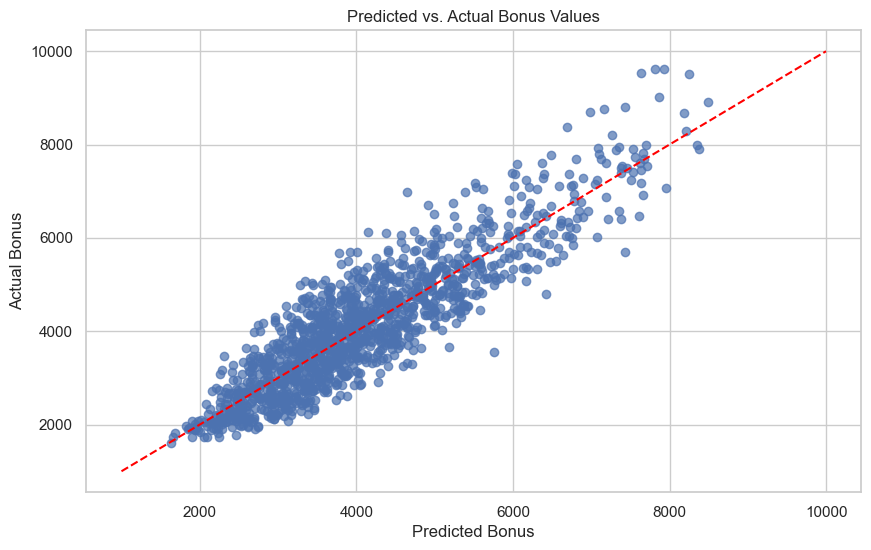

In [227]:
plt.figure(figsize=(10, 6))
plt.scatter(lasso_y_pred_test , lic_sales_test_y, alpha=0.7)
plt.plot([1000, 9999], [1000, 9999], color='red', linestyle='--')  # Perfect prediction line
plt.xlabel('Predicted Bonus')
plt.ylabel('Actual Bonus')
plt.title('Predicted vs. Actual Bonus Values')
plt.grid(True)
plt.show()

In [228]:
Lasso_train_residuals = lic_sales_train_y - lasso_y_pred_train
Lasso_test_residuals = lic_sales_test_y - lasso_y_pred_test

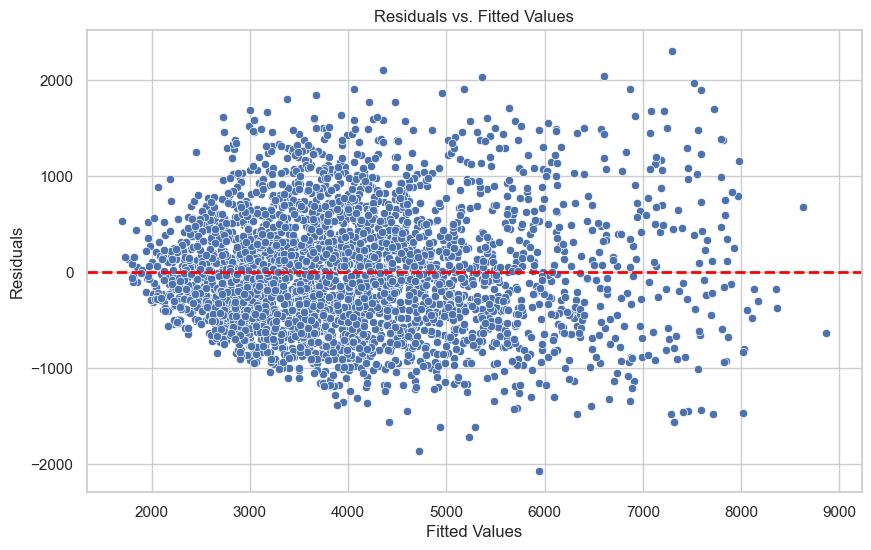

In [229]:
# Scatter plot of residuals vs. fitted values
plt.figure(figsize=(10, 6))
sns.scatterplot(x=lasso_y_pred_train, y=Lasso_train_residuals)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)  # Add a horizontal line at y=0
plt.title('Residuals vs. Fitted Values')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.show()

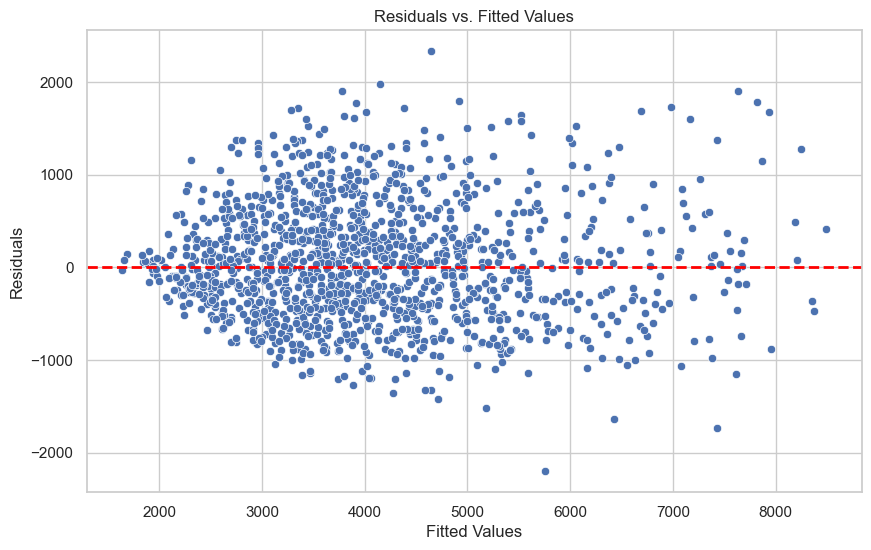

In [230]:
# Scatter plot of residuals vs. fitted values
plt.figure(figsize=(10, 6))
sns.scatterplot(x=lasso_y_pred_test, y=Lasso_test_residuals)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)  # Add a horizontal line at y=0
plt.title('Residuals vs. Fitted Values')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.show()

<b> <font color="Green" size=3> Least Absolute Shrinkage and Selection Operator (Lasso), it shirnks the weightage of features it can even make some features to become 0. It aims to reduce the residual sum of square by reducing features that has no significance. </font> </b>

In [231]:
print(lasso_reg.score(lic_sales_train_X,lic_sales_train_y))
print(lasso_reg.score(lic_sales_test_X,lic_sales_test_y))

0.8055742286771328
0.7984958669732002


In [232]:
adjusted_r_squared_lasso_train = round(1 - ((1 - lasso_reg.score(lic_sales_train_X,lic_sales_train_y)) * (n_train - 1) / (n_train - k_train - 1)),2)
adjusted_r_squared_lasso_test = round(1 - ((1 - lasso_reg.score(lic_sales_test_X,lic_sales_test_y)) * (n_test - 1) / (n_test - k_test - 1)),2)

In [233]:
rmse_train.append(round(np.sqrt(lasso_mse_train),2))
rmse_test.append(round(np.sqrt(lasso_mse_test),2))
mape_train.append(mape_lasso_train)
mape_test.append(mape_lasso_test)
rsquared_train.append(round(lasso_reg.score(lic_sales_train_X, lic_sales_train_y),2))
rsquared_test.append(round(lasso_reg.score(lic_sales_test_X, lic_sales_test_y),2))
adjrsquared_train.append(adjusted_r_squared_lasso_train)
adjrsquared_test.append(adjusted_r_squared_lasso_test)

In [234]:
#lasso_rsquared_train=r2_score(lic_sales_train_y, lasso_reg.predict(lic_sales_train_X))
#lasso_rsquared_train

<b> <font size=5 color='Green'> Model building using Lassocv (cross validation) to get the best alpha value to apply  </font> </b>

In [235]:
lasso_cv = LassoCV(alphas = None, cv = 10, max_iter = 100000, random_state=42)
lasso_cv.fit(lic_sales_train_X, lic_sales_train_y)

LassoCV(cv=10, max_iter=100000, random_state=42)

In [236]:
alpha_cv = lasso_cv.alpha_
print('Alpha using Lasso CV is:', alpha_cv)

Alpha using Lasso CV is: 8.54715183902642


In [237]:
lasso_reg_cv = Lasso(alpha = alpha_cv)
lasso_reg_cv.fit(lic_sales_train_X, lic_sales_train_y)

Lasso(alpha=8.54715183902642)

In [238]:
lasso_reg_cv.score(lic_sales_train_X, lic_sales_train_y)

0.8040880549925147

In [239]:
lasso_reg_cv.score(lic_sales_test_X, lic_sales_test_y)

0.7997621442974862

In [240]:
lasso_reg_cv.coef_

array([ 1.92139587e+02, -1.79848579e+01,  3.78792760e+02,  8.79680249e+01,
        8.12133010e+02, -9.71581877e+00,  0.00000000e+00,  5.10139140e-01,
       -6.53094143e+00, -0.00000000e+00,  3.16918870e+01, -0.00000000e+00,
       -0.00000000e+00, -8.58694870e+00, -5.57656571e+00, -1.25259214e+01,
        0.00000000e+00,  0.00000000e+00, -1.19406240e+02, -1.22327963e+02,
        1.05178676e+02,  0.00000000e+00,  0.00000000e+00, -2.92944797e+00,
        2.28711181e+00,  1.01940917e+00, -6.01098407e-01,  5.58322883e+00,
        2.06188979e+00,  3.17127327e+00])

In [241]:
mse_lasso_cv_train = round(mean_squared_error(lic_sales_train_y, lasso_reg_cv.predict(lic_sales_train_X)),2)
print(np.sqrt(mse_lasso_cv_train))

621.7421008746311


In [242]:
mse_lasso_cv_test = round(mean_squared_error(lic_sales_test_y, lasso_reg_cv.predict(lic_sales_test_X)),2)
print(np.sqrt(mse_lasso_cv_test))

626.1624150330327


In [243]:
lasso_reg_cv_y_pred_train = lasso_reg_cv.predict(lic_sales_train_X)
lasso_reg_cv_y_pred_test = lasso_reg_cv.predict(lic_sales_test_X)

In [244]:
mape_lasso_cv_reg_train = round(mean_absolute_percentage_error(lic_sales_train_y, lasso_reg_cv_y_pred_train),2)
mape_lasso_cv_reg_test = round(mean_absolute_percentage_error(lic_sales_test_y, lasso_reg_cv_y_pred_test),2)

In [245]:
mape_train.append(mape_lasso_cv_reg_train)
mape_test.append(mape_lasso_cv_reg_test)

In [246]:
rmse_train.append(round(np.sqrt(mse_lasso_cv_train),2))
rmse_test.append(round(np.sqrt(mse_lasso_cv_test),2))

In [247]:
rsquared_train.append(round(lasso_reg_cv.score(lic_sales_train_X, lic_sales_train_y),2))
rsquared_test.append(round(lasso_reg_cv.score(lic_sales_test_X, lic_sales_test_y),2))

In [248]:
adjrsquared_train.append(round(1 - ((1 - lasso_reg_cv.score(lic_sales_train_X,lic_sales_train_y)) * (n_train - 1) / (n_train - k_train - 1)),2))
adjrsquared_test.append(round(1 - ((1 - lasso_reg_cv.score(lic_sales_test_X,lic_sales_test_y)) * (n_test - 1) / (n_test - k_test - 1)),2))

<b> <font size=5 color='Green'> Model building using Ridge Regression  </font> </b>

<b> <font size=3 color='Green'> Ridge Regression will avoid the overfitting by normalizing the features weightage.  </font> </b>

In [249]:
from sklearn.linear_model import Ridge, RidgeCV

In [250]:
alphas = np.random.uniform(0, 10, 50)
ridge_cv = RidgeCV(alphas = alphas, cv = 10 )
ridge_cv.fit(lic_sales_train_X, lic_sales_train_y)

RidgeCV(alphas=array([6.86592881, 4.2445942 , 4.01687199, 2.25263112, 8.5028671 ,
       2.02081303, 1.07005251, 6.6533235 , 5.08652468, 9.72640539,
       4.53089092, 0.10443543, 7.31826307, 2.16487723, 4.35523461,
       6.42322174, 2.97268998, 4.79283606, 1.70394312, 6.67029266,
       7.37494263, 8.23480402, 2.62230873, 5.65906069, 9.61334047,
       7.29811682, 8.1504893 , 3.79044908, 2.67513925, 9.28942241,
       1.84753282, 7.13285474, 4.76424573, 2.55566003, 2.80017899,
       0.61514659, 5.413583  , 7.19159399, 1.15265101, 5.6689192 ,
       3.57226208, 0.94796922, 8.17123177, 7.92791829, 7.73725457,
       9.17217393, 4.4952519 , 6.13903781, 1.60603585, 6.23823929]),
        cv=10)

In [251]:
alpha_ridge = round(ridge_cv.alpha_,2)
print('Alpha value for Ridge:', alpha_ridge)

Alpha value for Ridge: 9.73


In [252]:
ridge_reg_cv = Ridge(alpha = alpha_ridge)
ridge_reg_cv.fit(lic_sales_train_X, lic_sales_train_y)

Ridge(alpha=9.73)

In [253]:
ridge_reg_cv.score(lic_sales_train_X, lic_sales_train_y)

0.8055695405775731

In [254]:
ridge_reg_cv.score(lic_sales_test_X, lic_sales_test_y)

0.7985291875835202

In [255]:
ridge_reg_cv.coef_

array([ 1.99775383e+02, -2.17225147e+01,  4.08250958e+02,  9.44014533e+01,
        8.09007864e+02, -2.06854843e+01,  5.44269798e+00,  6.94845760e+00,
       -1.54686897e+01, -2.24245196e+01,  5.92496060e+01, -2.42757455e+01,
       -1.28350257e+01, -2.38572381e+01, -1.92786453e+01, -2.54332281e+01,
       -2.73250934e-01, -6.77803200e+00, -1.36297109e+02, -1.49274792e+02,
        1.03696425e+02,  6.74193533e+00,  3.32267058e+00, -6.89366620e+00,
        9.38017452e+00,  1.03460681e+01, -9.22757097e+00,  4.05380614e+01,
        1.68384258e+01,  4.64459794e+01])

In [256]:
ridge_variable = lic_sales_train_X.columns

In [257]:
ridge_coefficients_df = pd.DataFrame({'Variable': ridge_variable, 'Coefficient': ridge_reg_cv.coef_})

In [258]:
print(ridge_coefficients_df)

                         Variable  Coefficient
0                      CustTenure   199.775383
1                  NumberOfPolicy   -21.722515
2                   MonthlyIncome   408.250958
3            ExistingPolicyTenure    94.401453
4                      SumAssured   809.007864
5                  LastMonthCalls   -20.685484
6                   CustCareScore     5.442698
7                     Complaint_1     6.948458
8                     Gender_Male   -15.468690
9              ExistingProdType_2   -22.424520
10             ExistingProdType_3    59.249606
11             ExistingProdType_5   -24.275745
12             ExistingProdType_6   -12.835026
13      Occupation_Large Business   -23.857238
14      Occupation_Small Business   -19.278645
15             EducationField_MBA   -25.433228
16   EducationField_Post Graduate    -0.273251
17  EducationField_Under Graduate    -6.778032
18            Designation_Manager  -136.297109
19     Designation_Senior Manager  -149.274792
20           

In [259]:
lasso_ridge = Ridge(alpha=9.5)
lasso_ridge.fit(lic_sales_train_X,lic_sales_train_y)
print ("Ridge model:", (lasso_ridge.coef_)) 

Ridge model: [ 1.99762808e+02 -2.17236270e+01  4.08284858e+02  9.43900426e+01
  8.09072217e+02 -2.06925476e+01  5.44161682e+00  6.94627664e+00
 -1.54690469e+01 -2.24343595e+01  5.92782817e+01 -2.42986187e+01
 -1.28455536e+01 -2.38629297e+01 -1.92827579e+01 -2.54401562e+01
 -2.77492469e-01 -6.78835668e+00 -1.36322678e+02 -1.49320986e+02
  1.03673795e+02  6.74402778e+00  3.32662320e+00 -6.89459897e+00
  9.38329766e+00  1.03482082e+01 -9.22804443e+00  4.05561669e+01
  1.68429588e+01  4.64806593e+01]


In [260]:
lasso_ridge_cv_train_pred = lasso_ridge.predict(lic_sales_train_X)
lasso_ridge_cv_test_pred = lasso_ridge.predict(lic_sales_test_X)

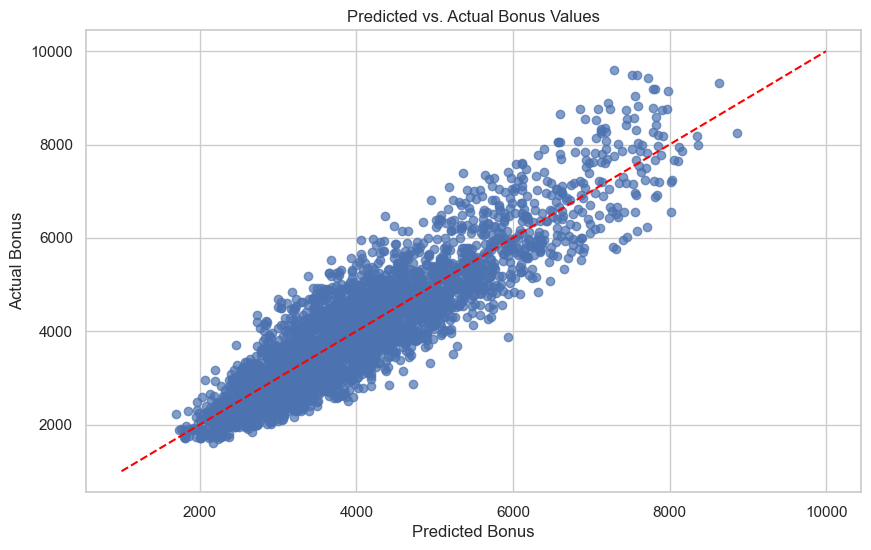

In [261]:
plt.figure(figsize=(10, 6))
plt.scatter(lasso_ridge_cv_train_pred , lic_sales_train_y, alpha=0.7)
plt.plot([1000, 9999], [1000, 9999], color='red', linestyle='--')  # Perfect prediction line
plt.xlabel('Predicted Bonus')
plt.ylabel('Actual Bonus')
plt.title('Predicted vs. Actual Bonus Values')
plt.grid(True)
plt.show()

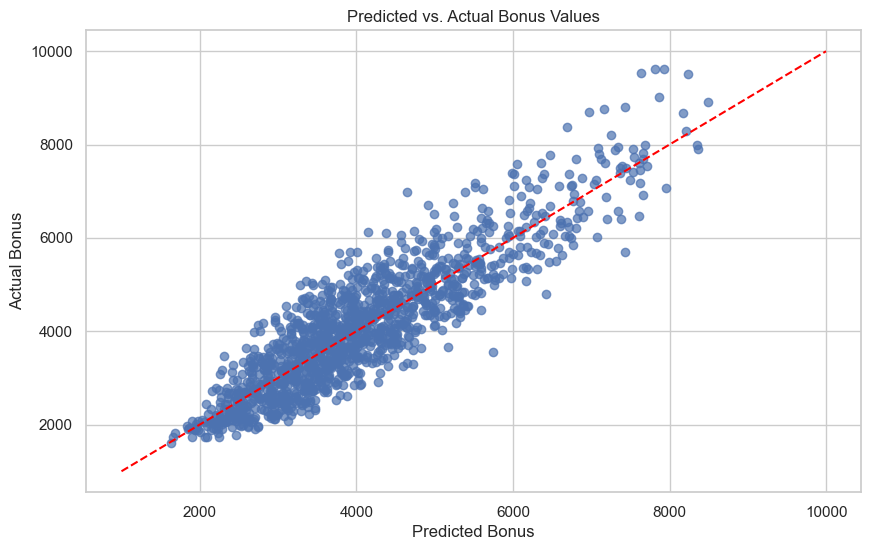

In [262]:
plt.figure(figsize=(10, 6))
plt.scatter(lasso_ridge_cv_test_pred , lic_sales_test_y, alpha=0.7)
plt.plot([1000, 9999], [1000, 9999], color='red', linestyle='--')  # Perfect prediction line
plt.xlabel('Predicted Bonus')
plt.ylabel('Actual Bonus')
plt.title('Predicted vs. Actual Bonus Values')
plt.grid(True)
plt.show()

In [263]:
mape_lasso_ridge_train = round(mean_absolute_percentage_error(lic_sales_train_y, lasso_ridge_cv_train_pred),2)
mape_lasso_ridge_test = round(mean_absolute_percentage_error(lic_sales_test_y, lasso_ridge_cv_test_pred),2)

In [264]:
mape_train.append(mape_lasso_ridge_train)
mape_test.append(mape_lasso_ridge_test)

In [265]:
mse_ridge_cv_train = round(mean_squared_error(lic_sales_train_y, ridge_reg_cv.predict(lic_sales_train_X)),2)
mse_ridge_cv_test = round(mean_squared_error(lic_sales_test_y, ridge_reg_cv.predict(lic_sales_test_X)),2)

In [266]:
rmse_train.append(round(np.sqrt(mse_ridge_cv_train),2))
rmse_test.append(round(np.sqrt(mse_ridge_cv_test),2))

In [267]:
rsquared_train.append(round(ridge_reg_cv.score(lic_sales_train_X, lic_sales_train_y),2))
rsquared_test.append(round(ridge_reg_cv.score(lic_sales_test_X, lic_sales_test_y),2))

In [268]:
adjrsquared_train.append(round(1 - ((1 - ridge_reg_cv.score(lic_sales_train_X,lic_sales_train_y)) * (n_train - 1) / (n_train - k_train - 1)),2))
adjrsquared_test.append(round(1 - ((1 - ridge_reg_cv.score(lic_sales_test_X,lic_sales_test_y)) * (n_test - 1) / (n_test - k_test - 1)),2))

<b> <font size=5 color='Green'> Model building using GridsearchCV (cross validation) to get the best alpha value to apply  </font> </b>

In [269]:
from sklearn.model_selection import GridSearchCV

In [270]:
np.logspace(-4, -0.5, 30)

array([1.00000000e-04, 1.32035178e-04, 1.74332882e-04, 2.30180731e-04,
       3.03919538e-04, 4.01280703e-04, 5.29831691e-04, 6.99564216e-04,
       9.23670857e-04, 1.21957046e-03, 1.61026203e-03, 2.12611233e-03,
       2.80721620e-03, 3.70651291e-03, 4.89390092e-03, 6.46167079e-03,
       8.53167852e-03, 1.12648169e-02, 1.48735211e-02, 1.96382800e-02,
       2.59294380e-02, 3.42359796e-02, 4.52035366e-02, 5.96845700e-02,
       7.88046282e-02, 1.04049831e-01, 1.37382380e-01, 1.81393069e-01,
       2.39502662e-01, 3.16227766e-01])

In [271]:
alphas = np.logspace(-4, -0.5, 30)

In [272]:
estimator = GridSearchCV(lasso_reg, dict(alpha=alphas))

In [273]:
estimator.fit(lic_sales_train_X, lic_sales_train_y)

GridSearchCV(estimator=Lasso(alpha=0.1, random_state=42),
             param_grid={'alpha': array([1.00000000e-04, 1.32035178e-04, 1.74332882e-04, 2.30180731e-04,
       3.03919538e-04, 4.01280703e-04, 5.29831691e-04, 6.99564216e-04,
       9.23670857e-04, 1.21957046e-03, 1.61026203e-03, 2.12611233e-03,
       2.80721620e-03, 3.70651291e-03, 4.89390092e-03, 6.46167079e-03,
       8.53167852e-03, 1.12648169e-02, 1.48735211e-02, 1.96382800e-02,
       2.59294380e-02, 3.42359796e-02, 4.52035366e-02, 5.96845700e-02,
       7.88046282e-02, 1.04049831e-01, 1.37382380e-01, 1.81393069e-01,
       2.39502662e-01, 3.16227766e-01])})

In [274]:
estimator.best_score_

0.7997176051159145

In [275]:
estimator.best_estimator_

Lasso(alpha=0.31622776601683794, random_state=42)

In [276]:
estimator.predict(lic_sales_test_X)

array([3335.45571033, 3613.04071713, 4013.54564146, ..., 4296.37059238,
       3636.65552136, 4180.99012935])

In [277]:
grid_lasso_reg = Lasso(alpha=0.31622776601683794, random_state=42)
grid_lasso_cv1 = grid_lasso_reg.fit(lic_sales_train_X,lic_sales_train_y)

In [278]:
grid_lasso_mse_train = mean_squared_error(lic_sales_train_y, grid_lasso_cv1.predict(lic_sales_train_X))
print(np.sqrt(grid_lasso_mse_train))

619.3836903395063


In [279]:
grid_lasso_mse_test = mean_squared_error(lic_sales_test_y, grid_lasso_cv1.predict(lic_sales_test_X))
print(np.sqrt(grid_lasso_mse_test))

628.0111589734771


In [280]:
grid_lasso_cv1.coef_

array([ 198.92845591,  -21.65835197,  408.5063627 ,   93.73565363,
        811.71487187,  -20.55985007,    5.1375058 ,    6.63037814,
        -15.1589864 ,  -21.66304076,   59.42296321,  -23.90543289,
        -12.48057187,  -22.86846801,  -18.65763959,  -24.93221975,
          0.        ,   -5.84558632, -136.58897684, -150.06825965,
        102.85677179,    6.34490566,    3.02820198,   -6.79805729,
          9.22686065,   10.06429176,   -8.92494849,   39.75773167,
         16.37343854,   45.93359654])

In [281]:
grid_lasso_y_pred_train = grid_lasso_cv1.predict(lic_sales_train_X)
grid_lasso_y_pred_test = grid_lasso_cv1.predict(lic_sales_test_X)

In [282]:
mape_grid_lasso = round(mean_absolute_percentage_error(lic_sales_train_y, grid_lasso_y_pred_train),2)
mape_grid_lasso_test = round(mean_absolute_percentage_error(lic_sales_test_y, grid_lasso_y_pred_test),2)

In [283]:
mape_train.append(mape_grid_lasso)
mape_test.append(mape_grid_lasso_test)

In [284]:
rmse_train.append(round(np.sqrt(grid_lasso_mse_train),2))
rmse_test.append(round(np.sqrt(grid_lasso_mse_test),2))

In [285]:
rsquared_train.append(round(grid_lasso_cv1.score(lic_sales_train_X,lic_sales_train_y),2))
rsquared_test.append(round(grid_lasso_cv1.score(lic_sales_test_X,lic_sales_test_y),2))

In [286]:
adjrsquared_train.append(round(1 - ((1 - grid_lasso_cv1.score(lic_sales_train_X,lic_sales_train_y)) * (n_train - 1) / (n_train - k_train - 1)),2))
adjrsquared_test.append(round(1 - ((1 - grid_lasso_cv1.score(lic_sales_test_X,lic_sales_test_y)) * (n_test - 1) / (n_test - k_test - 1)),2))

<b> <font size=5 color='Green'> Parameteric models for regression  </font> </b>

<b> <font size=5 color='Green'> Decision Tree  </font> </b>

In [287]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import export_text

In [288]:
tree_lic_sales_reg = DecisionTreeRegressor(random_state=42)

In [289]:
tree_lic_sales_reg.fit(lic_sales_train_X, lic_sales_train_y)

DecisionTreeRegressor(random_state=42)

In [290]:
dt_y_pred_train = tree_lic_sales_reg.predict(lic_sales_train_X)

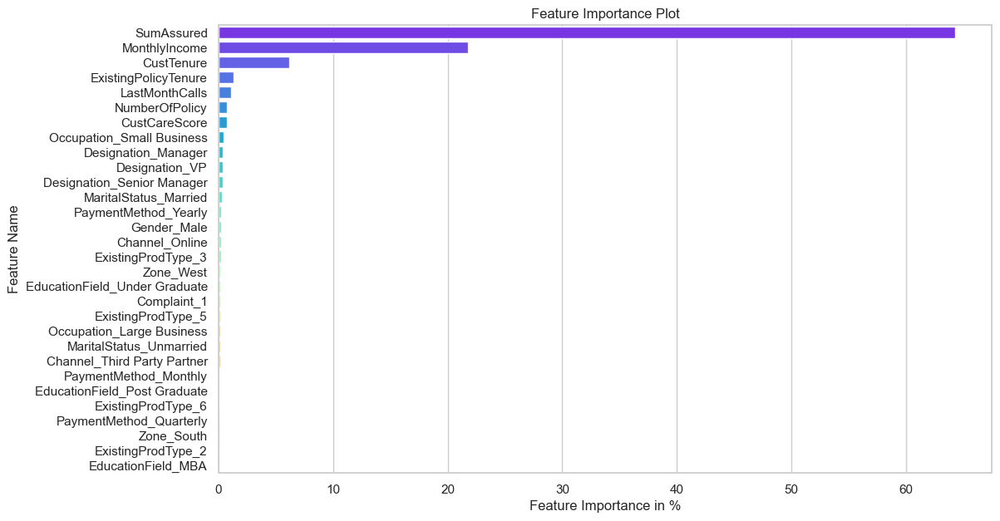

In [291]:
x=pd.DataFrame(tree_lic_sales_reg.feature_importances_*100,index=lic_sales_train_X.columns).sort_values(by=0,ascending=False)
plt.figure(figsize=(12,7))
sns.barplot(x=x[0],y=x.index,palette='rainbow')
plt.ylabel('Feature Name')
plt.xlabel('Feature Importance in %')
plt.title('Feature Importance Plot')
plt.show()

In [292]:
dt_mse = mean_squared_error(lic_sales_train_y, dt_y_pred_train)
r2 = r2_score(lic_sales_train_y, dt_y_pred_train)
print(dt_mse)
print(r2)

0.0
1.0


In [293]:
dt_y_pred_test = tree_lic_sales_reg.predict(lic_sales_test_X)

In [294]:
mape_dt_train = round(mean_absolute_percentage_error(lic_sales_train_y, dt_y_pred_train),2)
mape_dt_test = round(mean_absolute_percentage_error(lic_sales_test_y, dt_y_pred_test),2)

In [295]:
mape_train.append(mape_dt_train)
mape_test.append(mape_dt_test)

In [296]:
dt_mse_test = mean_squared_error(lic_sales_test_y, dt_y_pred_test)
r2_test = r2_score(lic_sales_test_y, dt_y_pred_test)
print(np.sqrt(dt_mse_test))
print(r2_test)

733.3325777684496
0.7253534505400276


<b> <font size=3 color='Green'> Decision Tree is a greedy algorithm , it locally optimal decisions at each node without considering the global optimal solution.  </font> </b>

<b> <font size=3 color='Green'> R square in train is perfect 1 but on test it gives 0.72  </font> </b>

<b> <font size=3 color='Green'> We have prune the tree by doing a gridsearch to find the optimal depth and other hyper parameters  </font> </b>

In [297]:
tree_rules_sales = export_text(tree_lic_sales_reg, feature_names=lic_sales_train_X.columns.tolist())
print("Decision Tree Rules:")
print(tree_rules_sales)

Decision Tree Rules:
|--- SumAssured <= 0.16
|   |--- SumAssured <= -0.71
|   |   |--- SumAssured <= -1.19
|   |   |   |--- SumAssured <= -1.49
|   |   |   |   |--- MonthlyIncome <= -0.77
|   |   |   |   |   |--- CustTenure <= -0.25
|   |   |   |   |   |   |--- PaymentMethod_Monthly <= 1.57
|   |   |   |   |   |   |   |--- MonthlyIncome <= -1.42
|   |   |   |   |   |   |   |   |--- SumAssured <= -1.53
|   |   |   |   |   |   |   |   |   |--- EducationField_MBA <= 3.81
|   |   |   |   |   |   |   |   |   |   |--- SumAssured <= -1.61
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 7
|   |   |   |   |   |   |   |   |   |   |--- SumAssured >  -1.61
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 2
|   |   |   |   |   |   |   |   |   |--- EducationField_MBA >  3.81
|   |   |   |   |   |   |   |   |   |   |--- value: [2229.00]
|   |   |   |   |   |   |   |   |--- SumAssured >  -1.53
|   |   |   |   |   |   |   |   |   |--- ExistingProdTyp

In [298]:
dt_mse_train = mean_squared_error(lic_sales_train_y, tree_lic_sales_reg.predict(lic_sales_train_X))
print(np.sqrt(dt_mse_train))

0.0


In [299]:
dt_mse_test = mean_squared_error(lic_sales_test_y, tree_lic_sales_reg.predict(lic_sales_test_X))
print(np.sqrt(dt_mse_test))

733.3325777684496


In [300]:
rmse_train.append(round(np.sqrt(dt_mse_train),2))
rmse_test.append(round(np.sqrt(dt_mse_test),2))

In [301]:
rsquared_train.append(round(tree_lic_sales_reg.score(lic_sales_train_X, lic_sales_train_y),2))
rsquared_test.append(round(tree_lic_sales_reg.score(lic_sales_test_X, lic_sales_test_y),2))

In [302]:
adjrsquared_train.append(round(1 - ((1 - tree_lic_sales_reg.score(lic_sales_train_X,lic_sales_train_y)) * (n_train - 1) / (n_train - k_train - 1)),2))
adjrsquared_test.append(round(1 - ((1 - tree_lic_sales_reg.score(lic_sales_test_X,lic_sales_test_y)) * (n_test - 1) / (n_test - k_test - 1)),2))

<b> <font size=5 color='Green'> Decision Tree using Gridsearchcv  </font> </b>

In [303]:
from sklearn import tree
param_grid={'max_depth':[5,10,15,20],
           'min_samples_leaf': [3,15,30],
           'min_samples_split': [15,30,35,40],}
dtr=tree.DecisionTreeRegressor(random_state=42)
grid_search_dt=GridSearchCV(estimator=dtr,param_grid=param_grid,cv=3)
grid_search_dt.fit(lic_sales_train_X,lic_sales_train_y)
print(grid_search_dt.best_params_)

{'max_depth': 5, 'min_samples_leaf': 3, 'min_samples_split': 35}


In [304]:
grid_search_best_estimator_dt = grid_search_dt.best_estimator_
dt_grid_feature_importances = grid_search_best_estimator_dt.feature_importances_

<b> <font size=3 color='Green'> We will be using the recommended hyper parameter in dt model to see if it avoids the overfitting. Still we have other options to go with random forest, ensemble models to avoid depedending on single tree  </font> </b>

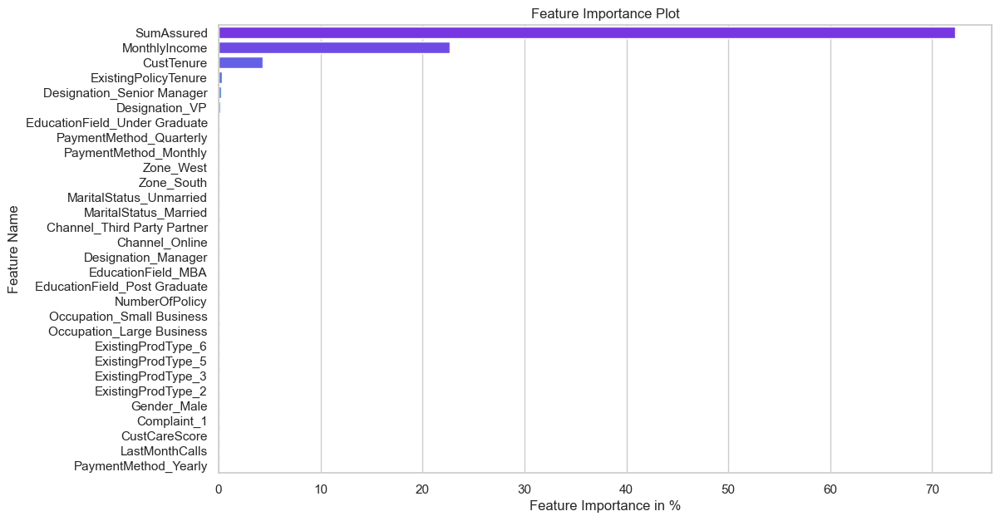

In [305]:
x=pd.DataFrame(grid_search_best_estimator_dt.feature_importances_*100,index=lic_sales_train_X.columns).sort_values(by=0,ascending=False)
plt.figure(figsize=(12,7))
sns.barplot(x=x[0],y=x.index,palette='rainbow')
plt.ylabel('Feature Name')
plt.xlabel('Feature Importance in %')
plt.title('Feature Importance Plot')
plt.show()

In [306]:
dtr_grid_sales = tree.DecisionTreeRegressor(max_depth=5,min_samples_leaf=3,min_samples_split=35,random_state=42)
dtr_grid_sales.fit(lic_sales_train_X, lic_sales_train_y)

DecisionTreeRegressor(max_depth=5, min_samples_leaf=3, min_samples_split=35,
                      random_state=42)

In [307]:
dt_mse_grid_train = mean_squared_error(lic_sales_train_y, dtr_grid_sales.predict(lic_sales_train_X))
r2_train_grid_dt = r2_score(lic_sales_train_y, dtr_grid_sales.predict(lic_sales_train_X))
print(np.sqrt(dt_mse_grid_train))
print(r2_train_grid_dt)

551.4433804048858
0.845885955877524


In [308]:
dt_mse_grid_test = mean_squared_error(lic_sales_test_y, dtr_grid_sales.predict(lic_sales_test_X))
r2_test_grid_dt = r2_score(lic_sales_test_y, dtr_grid_sales.predict(lic_sales_test_X))
print(np.sqrt(dt_mse_grid_test))
print(r2_test_grid_dt)

614.7703724039018
0.806981894509879


In [309]:
dt_y_pred_grid_train = dtr_grid_sales.predict(lic_sales_train_X)
dt_y_pred_grid_test = dtr_grid_sales.predict(lic_sales_test_X)

In [310]:
mape_dt_grid_train = round(mean_absolute_percentage_error(lic_sales_train_y, dt_y_pred_grid_train),2)
mape_dt_grid_test = round(mean_absolute_percentage_error(lic_sales_test_y, dt_y_pred_grid_test),2)

In [311]:
mape_train.append(mape_dt_grid_train)
mape_test.append(mape_dt_grid_test)

In [312]:
rmse_train.append(round(np.sqrt(dt_mse_grid_train),2)) 
rmse_test.append(round(np.sqrt(dt_mse_grid_test),2))

In [313]:
rsquared_train.append(round(dtr_grid_sales.score(lic_sales_train_X, lic_sales_train_y),2))
rsquared_test.append(round(dtr_grid_sales.score(lic_sales_test_X, lic_sales_test_y),2))

In [314]:
adjrsquared_train.append(round(1 - ((1 - dtr_grid_sales.score(lic_sales_train_X,lic_sales_train_y)) * (n_train - 1) / (n_train - k_train - 1)),2))
adjrsquared_test.append(round(1 - ((1 - dtr_grid_sales.score(lic_sales_test_X,lic_sales_test_y)) * (n_test - 1) / (n_test - k_test - 1)),2))

<b> <font size=3 color='Green'> By using the recommended hyper parameter now the DT model isn't overfitting </font> </b>

<b> <font size=3 color='Green'> R2 score for train is 84% and on test is 80% which isn't greater than 10% </font> </b>

[Text(0.543859649122807, 0.9166666666666666, 'SumAssured <= 0.164\nsquared_error = 1973147.895\nsamples = 3164\nvalue = 4067.443'),
 Text(0.2807017543859649, 0.75, 'SumAssured <= -0.707\nsquared_error = 717678.107\nsamples = 1894\nvalue = 3267.59'),
 Text(0.14035087719298245, 0.5833333333333334, 'SumAssured <= -1.193\nsquared_error = 323220.149\nsamples = 880\nvalue = 2713.205'),
 Text(0.07017543859649122, 0.4166666666666667, 'SumAssured <= -1.491\nsquared_error = 154820.494\nsamples = 360\nvalue = 2377.303'),
 Text(0.03508771929824561, 0.25, 'MonthlyIncome <= -0.767\nsquared_error = 71882.847\nsamples = 122\nvalue = 2109.598'),
 Text(0.017543859649122806, 0.08333333333333333, 'squared_error = 53546.853\nsamples = 68\nvalue = 1968.0'),
 Text(0.05263157894736842, 0.08333333333333333, 'squared_error = 37930.232\nsamples = 54\nvalue = 2287.907'),
 Text(0.10526315789473684, 0.25, 'CustTenure <= 0.029\nsquared_error = 141767.426\nsamples = 238\nvalue = 2514.529'),
 Text(0.08771929824561403,

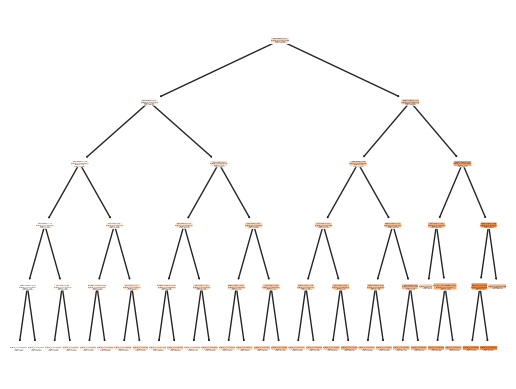

In [315]:
from sklearn.tree import plot_tree
plot_tree(grid_search_dt.best_estimator_,feature_names=lic_sales_train_X.columns,filled=True,rounded=True)

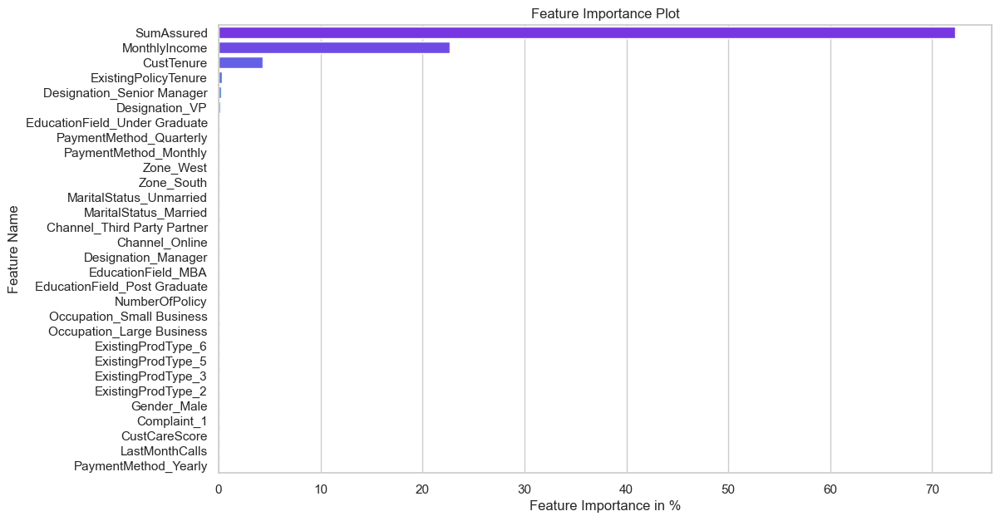

In [316]:
x=pd.DataFrame(grid_search_best_estimator_dt.feature_importances_*100,index=lic_sales_train_X.columns).sort_values(by=0,ascending=False)
plt.figure(figsize=(12,7))
sns.barplot(x=x[0],y=x.index,palette='rainbow')
plt.ylabel('Feature Name')
plt.xlabel('Feature Importance in %')
plt.title('Feature Importance Plot')
plt.show()

<b> <font size=3 color='Green'> Using the gridsearch for decision tree, the important features are identified as SumAssured, MonthlyIncome, CustTenure, ExistingPolicyTenure all other features has no significance in DT  </font> </b>

<b> <font size=5 color='Green'> Random Forest  </font> </b>

In [317]:
from sklearn.ensemble import RandomForestRegressor

In [318]:
forest_lic_sales_reg = RandomForestRegressor(random_state=42)

In [319]:
random_param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'random_state': [42]
}

In [320]:
random_param_grid

{'n_estimators': [50, 100, 200],
 'max_depth': [None, 5, 10],
 'min_samples_split': [2, 5, 10],
 'min_samples_leaf': [1, 2, 4],
 'random_state': [42]}

In [321]:
lic_sales_grid_search = GridSearchCV(forest_lic_sales_reg, param_grid, cv=5, scoring='neg_mean_squared_error')

In [322]:
lic_sales_grid_search.fit(lic_sales_train_X, lic_sales_train_y)

GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=42),
             param_grid={'max_depth': [5, 10, 15, 20],
                         'min_samples_leaf': [3, 15, 30],
                         'min_samples_split': [15, 30, 35, 40]},
             scoring='neg_mean_squared_error')

In [323]:
best_forest_reg = lic_sales_grid_search.best_estimator_

In [324]:
best_forest_reg

RandomForestRegressor(max_depth=10, min_samples_leaf=3, min_samples_split=15,
                      random_state=42)

In [325]:
lic_sales_rf_y_pred_train = best_forest_reg.predict(lic_sales_train_X)

In [326]:
rf_sales_feature_importances = best_forest_reg.feature_importances_

In [327]:
rf_sales_importance_sales = pd.DataFrame({'Feature': lic_sales_train_X.columns, 'Importance': rf_sales_feature_importances})
rf_sales_importance_sales = rf_sales_importance_sales.sort_values(by='Importance', ascending=False)

In [328]:
rf_mse_sales = mean_squared_error(lic_sales_train_y, lic_sales_rf_y_pred_train)
rf_r2_sales = r2_score(lic_sales_train_y, lic_sales_rf_y_pred_train)

In [329]:
print(f'Mean Squared Error: {rf_mse_sales:.4f}')
print(f'R-squared: {rf_r2_sales:.4f}')
print("\nFeature Importances:")
print(rf_sales_importance_sales)

Mean Squared Error: 171608.7979
R-squared: 0.9130

Feature Importances:
                          Feature  Importance
4                      SumAssured    0.696554
2                   MonthlyIncome    0.217943
0                      CustTenure    0.052099
3            ExistingPolicyTenure    0.008160
5                  LastMonthCalls    0.004769
1                  NumberOfPolicy    0.002783
20                 Designation_VP    0.002486
6                   CustCareScore    0.002237
19     Designation_Senior Manager    0.002221
18            Designation_Manager    0.001823
23          MaritalStatus_Married    0.001036
26                      Zone_West    0.000858
8                     Gender_Male    0.000754
14      Occupation_Small Business    0.000743
21                 Channel_Online    0.000684
10             ExistingProdType_3    0.000623
7                     Complaint_1    0.000612
11             ExistingProdType_5    0.000573
17  EducationField_Under Graduate    0.000554
29      

In [330]:
lic_sales_rf_y_pred_train = best_forest_reg.predict(lic_sales_train_X)

In [331]:
lic_sales_rf_y_pred_test = best_forest_reg.predict(lic_sales_test_X)

In [332]:
rf_mse_sales_train = mean_squared_error(lic_sales_train_y, lic_sales_rf_y_pred_train)
rf_r2_sales_train = r2_score(lic_sales_train_y, lic_sales_rf_y_pred_train)

In [333]:
rf_mse_sales_test = mean_squared_error(lic_sales_test_y, lic_sales_rf_y_pred_test)
rf_r2_sales_test = r2_score(lic_sales_test_y, lic_sales_rf_y_pred_test)

In [334]:
print(f'Mean Squared Error: {rf_mse_sales_test:.4f}')
print(f'R-squared: {rf_r2_sales_test:.4f}')

Mean Squared Error: 292347.8617
R-squared: 0.8507


In [335]:
mape_lasso_rf_tune_train = round(mean_absolute_percentage_error(lic_sales_train_y, lic_sales_rf_y_pred_train),2)
mape_lasso_rf_tune_test = round(mean_absolute_percentage_error(lic_sales_test_y, lic_sales_rf_y_pred_test),2)

In [336]:
mape_train.append(mape_lasso_rf_tune_train)
mape_test.append(mape_lasso_rf_tune_test)

In [337]:
np.sqrt(rf_mse_sales)

414.2569225241044

In [338]:
np.sqrt(rf_mse_sales_test)

540.6920211216438

In [339]:
rmse_train.append(round(np.sqrt(rf_mse_sales_train),2))
rmse_test.append(round(np.sqrt(rf_mse_sales_test),2))

In [340]:
rsquared_train.append(round(rf_r2_sales_train,2))
rsquared_test.append(round(rf_r2_sales_test,2))

In [341]:
adjrsquared_train.append(round(1 - ((1 - best_forest_reg.score(lic_sales_train_X,lic_sales_train_y)) * (n_train - 1) / (n_train - k_train - 1)),2))
adjrsquared_test.append(round(1 - ((1 - best_forest_reg.score(lic_sales_test_X,lic_sales_test_y)) * (n_test - 1) / (n_test - k_test - 1)),2))

In [342]:
print("Best Parameters: ", lic_sales_grid_search.best_params_)
print("Best Score: ", lic_sales_grid_search.best_score_)

Best Parameters:  {'max_depth': 10, 'min_samples_leaf': 3, 'min_samples_split': 15}
Best Score:  -290217.9395377891


In [343]:
rfc_bestparam_sales = RandomForestRegressor(max_depth=10, min_samples_leaf=1, min_samples_split=10, random_state=42)
rfc_bestparam_sales.fit(lic_sales_train_X, lic_sales_train_y)

RandomForestRegressor(max_depth=10, min_samples_split=10, random_state=42)

In [344]:
best_lic_sales_rf_y_pred_train = rfc_bestparam_sales.predict(lic_sales_train_X)

In [345]:
best_lic_sales_rf_y_pred_test = rfc_bestparam_sales.predict(lic_sales_test_X)

In [346]:
best_rf_mse_sales = mean_squared_error(lic_sales_train_y, best_lic_sales_rf_y_pred_train)
best_rf_r2_sales = r2_score(lic_sales_train_y, best_lic_sales_rf_y_pred_train)

In [347]:
best_rf_mse_sales_test = mean_squared_error(lic_sales_test_y, best_lic_sales_rf_y_pred_test)
best_rf_r2_sales_test = r2_score(lic_sales_test_y, best_lic_sales_rf_y_pred_test)

In [348]:
print(f'best Mean Squared Error train: {best_rf_mse_sales:.4f}')
print(f'best R-squared train: {best_rf_r2_sales:.4f}')

best Mean Squared Error train: 153201.7339
best R-squared train: 0.9224


In [349]:
mape_rf_train = round(mean_absolute_percentage_error(lic_sales_train_y, best_lic_sales_rf_y_pred_train),2)
mape_rf_test = round(mean_absolute_percentage_error(lic_sales_test_y, best_lic_sales_rf_y_pred_test),2)

In [350]:
mape_train.append(mape_rf_train)
mape_test.append(mape_rf_test)

In [351]:
np.sqrt(153201.7339)

391.40993076313225

In [352]:
print(f'best Mean Squared Error test: {best_rf_mse_sales_test:.4f}')
print(f'best R-squared test: {best_rf_r2_sales_test:.4f}')

best Mean Squared Error test: 287299.0675
best R-squared test: 0.8533


In [353]:
rmse_train.append(round(np.sqrt(best_rf_mse_sales),2))
rmse_test.append(round(np.sqrt(best_rf_mse_sales_test),2))

In [354]:
rsquared_train.append(round(best_rf_r2_sales,2))
rsquared_test.append(round(best_rf_r2_sales_test,2))

In [355]:
adjrsquared_train.append(round(1 - ((1 - rfc_bestparam_sales.score(lic_sales_train_X,lic_sales_train_y)) * (n_train - 1) / (n_train - k_train - 1)),2))
adjrsquared_test.append(round(1 - ((1 - rfc_bestparam_sales.score(lic_sales_test_X,lic_sales_test_y)) * (n_test - 1) / (n_test - k_test - 1)),2))

<b> <font size=5 color='Green'> Random Forest is giving 92% on train and 85% on test data. This model slightly over fitting but the difference is less than 10%   </font> </b>

<b> <font size=5 color='Green'> Boosting using Ada Booster  </font> </b>

In [356]:
from sklearn.ensemble import AdaBoostRegressor

In [357]:
ad_param_grid = {
    'n_estimators' : [100,500,1000],
    'learning_rate' : [0.1,0.01,0.001],
    'random_state': [42]
}

In [358]:
lic_sales_ADB_model=AdaBoostRegressor()

In [359]:
lic_sales_ad_grid_search=GridSearchCV(estimator=lic_sales_ADB_model,param_grid=ad_param_grid)

In [360]:
lic_sales_ad_grid_search.fit(lic_sales_train_X,lic_sales_train_y)

GridSearchCV(estimator=AdaBoostRegressor(),
             param_grid={'learning_rate': [0.1, 0.01, 0.001],
                         'n_estimators': [100, 500, 1000],
                         'random_state': [42]})

In [361]:
lic_sales_ADB_model=lic_sales_ad_grid_search.best_estimator_

In [362]:
lic_sales_ADB_model.fit(lic_sales_train_X,lic_sales_train_y)

AdaBoostRegressor(learning_rate=0.1, n_estimators=500, random_state=42)

In [363]:
best_lic_sales_ADB_y_pred_train = lic_sales_ADB_model.predict(lic_sales_train_X)

In [364]:
best_lic_sales_ADB_y_pred_test = lic_sales_ADB_model.predict(lic_sales_test_X)

In [365]:
best_ADB_mse_sales_train = mean_squared_error(lic_sales_train_y, best_lic_sales_ADB_y_pred_train)
best_ADB_r2_sales_train = r2_score(lic_sales_train_y, best_lic_sales_ADB_y_pred_train)

In [366]:
best_ADB_mse_sales_test = mean_squared_error(lic_sales_test_y, best_lic_sales_ADB_y_pred_test)
best_ADB_r2_sales_test = r2_score(lic_sales_test_y, best_lic_sales_ADB_y_pred_test)

In [367]:
print(f'best Mean Squared Error train: {best_ADB_mse_sales_train:.4f}')
print(f'best R-squared train: {best_ADB_r2_sales_train:.4f}')

best Mean Squared Error train: 352113.2675
best R-squared train: 0.8215


In [368]:
print(f'best Mean Squared Error test: {best_ADB_mse_sales_test:.4f}')
print(f'best R-squared test: {best_ADB_r2_sales_test:.4f}')

best Mean Squared Error test: 384641.1802
best R-squared test: 0.8036


In [369]:
resi_ADB_train = lic_sales_train_y - best_lic_sales_ADB_y_pred_train
resi_ADB_test = lic_sales_test_y - best_lic_sales_ADB_y_pred_test

In [370]:
mape_ADB_train = round(mean_absolute_percentage_error(lic_sales_train_y, best_lic_sales_ADB_y_pred_train),2)
mape_ADB_test = round(mean_absolute_percentage_error(lic_sales_test_y, best_lic_sales_ADB_y_pred_test),2)

In [371]:
mape_train.append(mape_ADB_train)
mape_test.append(mape_ADB_test)

In [372]:
np.sqrt(best_ADB_mse_sales_train)

593.3913274404991

In [373]:
np.sqrt(best_ADB_mse_sales_test)

620.1944696426265

In [374]:
rmse_train.append(round(np.sqrt(best_ADB_mse_sales_train),2))
rmse_test.append(round(np.sqrt(best_ADB_mse_sales_test),2))

In [375]:
rsquared_train.append(round(best_ADB_r2_sales_train,2))
rsquared_test.append(round(best_ADB_r2_sales_test,2))

In [376]:
adjrsquared_train.append(round(1 - ((1 - lic_sales_ADB_model.score(lic_sales_train_X,lic_sales_train_y)) * (n_train - 1) / (n_train - k_train - 1)),2))
adjrsquared_test.append(round(1 - ((1 - lic_sales_ADB_model.score(lic_sales_test_X,lic_sales_test_y)) * (n_test - 1) / (n_test - k_test - 1)),2))

<b> <font size=5 color="Green"> ADA booster Tune </font> </b>

In [377]:
lic_sales_ADB_model=AdaBoostRegressor(learning_rate=0.1, n_estimators=500, random_state=42)

In [378]:
lic_sales_ADB_model.fit(lic_sales_train_X,lic_sales_train_y)

AdaBoostRegressor(learning_rate=0.1, n_estimators=500, random_state=42)

In [379]:
lic_sales_ADB_y_pred_train = lic_sales_ADB_model.predict(lic_sales_train_X)

In [380]:
lic_sales_ADB_y_pred_test = lic_sales_ADB_model.predict(lic_sales_test_X)

In [381]:
best_ADB_mse_sales_train = mean_squared_error(lic_sales_train_y, lic_sales_ADB_y_pred_train)
best_ADB_r2_sales_train = r2_score(lic_sales_train_y, lic_sales_ADB_y_pred_train)
print(best_ADB_mse_sales_train)
print(best_ADB_r2_sales_train)

352113.26748159766
0.8215474530190899


In [382]:
best_ADB_mse_sales_test = mean_squared_error(lic_sales_test_y, lic_sales_ADB_y_pred_test)
best_ADB_r2_sales_test = r2_score(lic_sales_test_y, lic_sales_ADB_y_pred_test)
print(best_ADB_mse_sales_test)
print(best_ADB_r2_sales_test)

384641.18017529877
0.803560885245007


<b> <font color="Green"> Even with tuned hyper parameter the RMSE and R2 metrics are same.   </font> </b>

<b> <font size=5 color='Green'> XGBooster  </font> </b>

In [383]:
import xgboost as xgb

In [384]:
xgb_lic_sales_reg = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

In [385]:
xgb_param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
}

In [386]:
print('XGBoost Param Grid:', xgb_param_grid)

XGBoost Param Grid: {'n_estimators': [50, 100, 200], 'max_depth': [3, 5, 7], 'learning_rate': [0.01, 0.1, 0.2], 'subsample': [0.8, 1.0], 'colsample_bytree': [0.8, 1.0]}


In [387]:
lic_sales_xgb_grid_search = GridSearchCV(xgb_lic_sales_reg, xgb_param_grid, cv=5, scoring='neg_mean_squared_error')

In [388]:
lic_sales_xgb_grid_search.fit(lic_sales_train_X, lic_sales_train_y)

GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=42, ...),
             param_grid={'colsample_bytree': [0.8, 1.0],
                         'learning_rate': [0.01, 0.1, 0.2],
                         'max_depth': [3, 5, 7], 'n_estimators': [50, 100, 200],
                         'subsample': [0.8, 1.0]},
             scoring='neg_mean_squared_error')

In [389]:
lic_sales_best_xgb_reg = lic_sales_xgb_grid_search.best_estimator_

In [390]:
print('XGBooster best estimator:', lic_sales_best_xgb_reg)

XGBooster best estimator: XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=50, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)


In [391]:
lic_sales_xgb_y_pred = lic_sales_best_xgb_reg.predict(lic_sales_train_X)

In [392]:
lic_sales_xgb_y_pred_test = lic_sales_best_xgb_reg.predict(lic_sales_test_X)

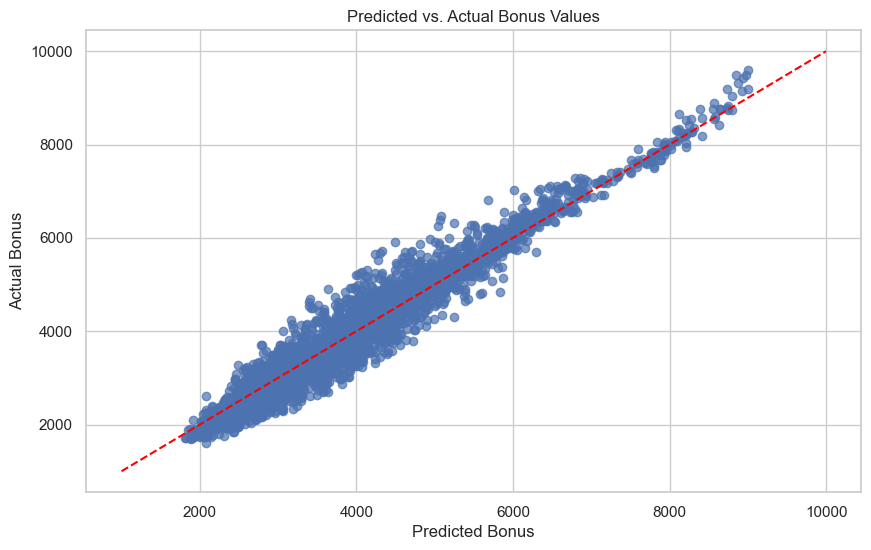

In [393]:
plt.figure(figsize=(10, 6))
plt.scatter(lic_sales_xgb_y_pred , lic_sales_train_y, alpha=0.7)
plt.plot([1000, 9999], [1000, 9999], color='red', linestyle='--')  # Perfect prediction line
plt.xlabel('Predicted Bonus')
plt.ylabel('Actual Bonus')
plt.title('Predicted vs. Actual Bonus Values')
plt.grid(True)
plt.show()

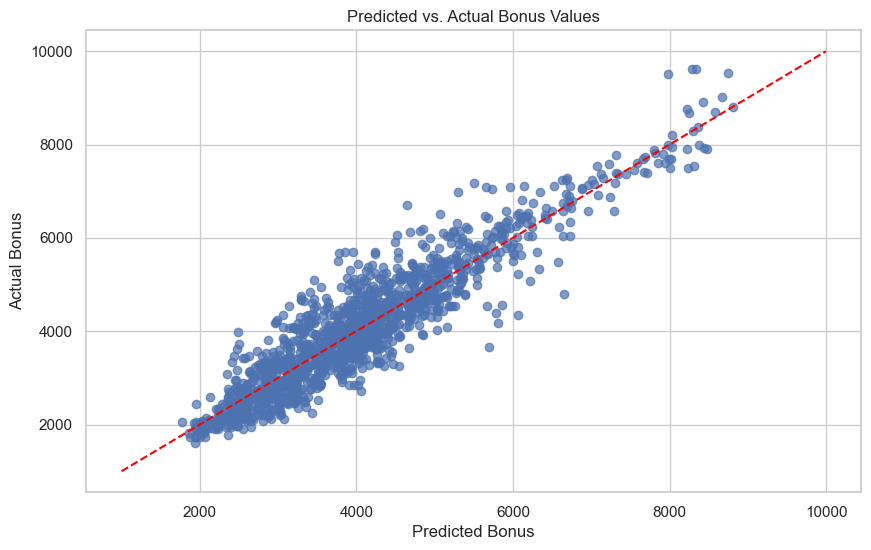

In [394]:
plt.figure(figsize=(10, 6))
plt.scatter(lic_sales_xgb_y_pred_test , lic_sales_test_y, alpha=0.7)
plt.plot([1000, 9999], [1000, 9999], color='red', linestyle='--')  # Perfect prediction line
plt.xlabel('Predicted Bonus')
plt.ylabel('Actual Bonus')
plt.title('Predicted vs. Actual Bonus Values')
plt.grid(True)
plt.show()

In [395]:
xgb_mse_train = mean_squared_error(lic_sales_train_y, lic_sales_xgb_y_pred)
xgb_r2_train = r2_score(lic_sales_train_y, lic_sales_xgb_y_pred)

In [396]:
xgb_mse_test = mean_squared_error(lic_sales_test_y, lic_sales_xgb_y_pred_test)
xgb_r2_test = r2_score(lic_sales_test_y, lic_sales_xgb_y_pred_test)

In [397]:
xgb_feature_importances = lic_sales_best_xgb_reg.feature_importances_

In [398]:
xgb_importance_sales = pd.DataFrame({'Feature': lic_sales_train_X.columns, 'Importance': xgb_feature_importances})
xgb_importance_sales = xgb_importance_sales.sort_values(by='Importance', ascending=False)

In [399]:
print(f'Mean Squared Error: {xgb_mse_train:.4f}')
print(f'R-squared: {xgb_r2_train:.4f}')
print("\nFeature Importances:")
print(xgb_importance_sales)

Mean Squared Error: 121087.4099
R-squared: 0.9386

Feature Importances:
                          Feature  Importance
4                      SumAssured    0.457628
2                   MonthlyIncome    0.151737
20                 Designation_VP    0.044952
0                      CustTenure    0.042189
18            Designation_Manager    0.040904
19     Designation_Senior Manager    0.024654
3            ExistingPolicyTenure    0.018257
13      Occupation_Large Business    0.013442
14      Occupation_Small Business    0.012736
16   EducationField_Post Graduate    0.012140
10             ExistingProdType_3    0.011086
5                  LastMonthCalls    0.010982
21                 Channel_Online    0.010971
23          MaritalStatus_Married    0.010315
9              ExistingProdType_2    0.010158
24        MaritalStatus_Unmarried    0.009953
8                     Gender_Male    0.009949
12             ExistingProdType_6    0.009740
26                      Zone_West    0.009738
6       

In [400]:
print(f'Mean Squared Error: {xgb_mse_test:.4f}')
print(f'R-squared: {xgb_r2_test:.4f}')

Mean Squared Error: 271354.0622
R-squared: 0.8614


In [401]:
rmse_train.append(round(np.sqrt(xgb_mse_train),2))
rmse_test.append(round(np.sqrt(xgb_mse_test),2))

In [402]:
rsquared_train.append(round(xgb_r2_train,2))
rsquared_test.append(round(xgb_r2_test,2))

In [403]:
adjrsquared_train.append(round(1 - ((1 - lic_sales_best_xgb_reg.score(lic_sales_train_X,lic_sales_train_y)) * (n_train - 1) / (n_train - k_train - 1)),2))
adjrsquared_test.append(round(1 - ((1 - lic_sales_best_xgb_reg.score(lic_sales_test_X,lic_sales_test_y)) * (n_test - 1) / (n_test - k_test - 1)),2))

In [404]:
resi_xgboost = lic_sales_train_y - lic_sales_xgb_y_pred

In [405]:
mape_XGBoost = round(mean_absolute_percentage_error(lic_sales_train_y, lic_sales_xgb_y_pred),2)

In [406]:
mape_train.append(mape_XGBoost)

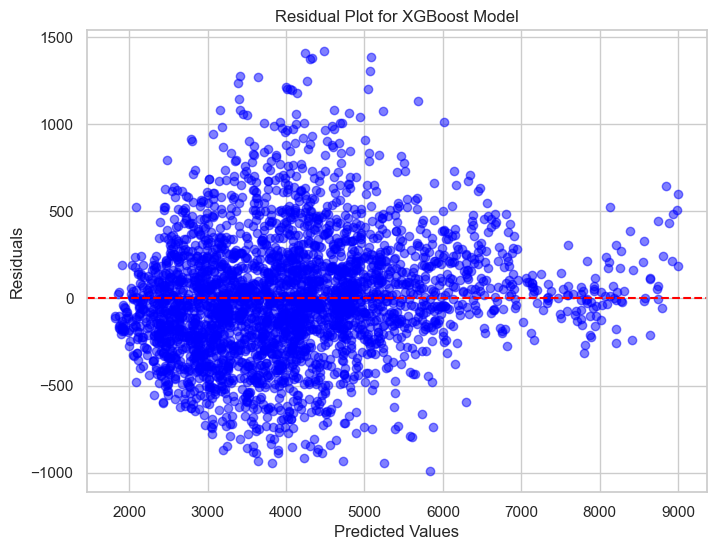

In [407]:
# Plot residuals against predicted values
plt.figure(figsize=(8, 6))
plt.scatter(lic_sales_xgb_y_pred, resi_xgboost, color='blue', alpha=0.5)
plt.title('Residual Plot for XGBoost Model')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.show()

In [408]:
resi_xgboost_test = lic_sales_test_y - lic_sales_xgb_y_pred_test

In [409]:
mape_XGBoost_test = round(mean_absolute_percentage_error(lic_sales_test_y, lic_sales_xgb_y_pred_test),2)

In [410]:
mape_test.append(mape_XGBoost_test)

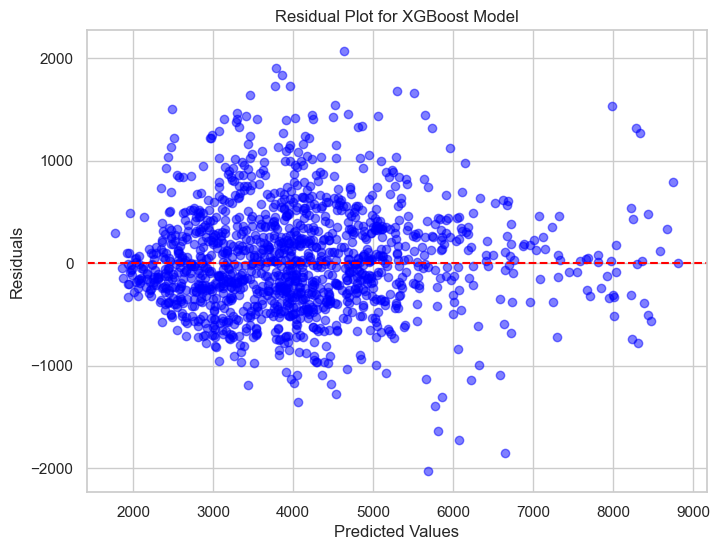

In [411]:
# Plot residuals against predicted values
plt.figure(figsize=(8, 6))
plt.scatter(lic_sales_xgb_y_pred_test, resi_xgboost_test, color='blue', alpha=0.5)
plt.title('Residual Plot for XGBoost Model')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.show()

<b> <font size=3 color="Green"> Xgboost gives r squared of 93% on train and 86% on test data the difference is less than 10%. So this model is considered slightly over fitting but less than 10% </font> </b>

<b> <font size=5 color='Green'> Boosting using XGBoost  </font> </b>

In [412]:
import xgboost as xgb

In [413]:
lic_sales_xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

In [414]:
lic_sales_xgb_reg.fit(lic_sales_train_X, lic_sales_train_y)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [415]:
lic_sales_xgboost_y_pred_train = lic_sales_xgb_reg.predict(lic_sales_train_X)

In [416]:
print(lic_sales_xgboost_y_pred_train)

[4052.5093 2200.6846 2095.3936 ... 2401.9329 4689.7324 3496.2915]


In [417]:
lic_sales_xgboost_y_pred_test = lic_sales_xgb_reg.predict(lic_sales_test_X)

In [418]:
lic_sales_xgboost_mse_train = mean_squared_error(lic_sales_train_y, lic_sales_xgboost_y_pred_train)
lic_sales_xgboost_r2_train = r2_score(lic_sales_train_y, lic_sales_xgboost_y_pred_train)

In [419]:
lic_sales_xgboost_mse_test = mean_squared_error(lic_sales_test_y, lic_sales_xgboost_y_pred_test)
lic_sales_xgboost_r2_test = r2_score(lic_sales_test_y, lic_sales_xgboost_y_pred_test)

In [420]:
print(lic_sales_xgboost_mse_train)
print(lic_sales_xgboost_r2_train)

26947.965592663484
0.9863426529469923


In [421]:
mape_XGBoost_no_tune = round(mean_absolute_percentage_error(lic_sales_train_y, lic_sales_xgboost_y_pred_train),2)
mape_XGBoost_no_tune_test = round(mean_absolute_percentage_error(lic_sales_test_y, lic_sales_xgboost_y_pred_test),2)

In [422]:
mape_train.append(mape_XGBoost_no_tune)
mape_test.append(mape_XGBoost_no_tune_test)

In [423]:
print(round(np.sqrt(lic_sales_xgboost_mse_test),2))
print(lic_sales_xgboost_r2_test)

554.76
0.8428251721583392


In [424]:
rmse_train.append(round(np.sqrt(lic_sales_xgboost_mse_train),2))
rmse_test.append(round(np.sqrt(lic_sales_xgboost_mse_test),2))

In [425]:
rsquared_train.append(round(lic_sales_xgboost_r2_train,2))
rsquared_test.append(round(lic_sales_xgboost_r2_test,2))

In [426]:
adjrsquared_train.append(round(1 - ((1 - lic_sales_xgb_reg.score(lic_sales_train_X,lic_sales_train_y)) * (n_train - 1) / (n_train - k_train - 1)),2))
adjrsquared_test.append(round(1 - ((1 - lic_sales_xgb_reg.score(lic_sales_test_X,lic_sales_test_y)) * (n_test - 1) / (n_test - k_test - 1)),2))

<b> <font size=3 color="Green"> Xgboost gives r squared of 98% on train and 84% on test data the difference is more than 10%. So this model is considered over fitting  </font> </b>

In [427]:
models_metric = pd.DataFrame({'Train RMSE': rmse_train,'Test RMSE': rmse_test,'Train R squared':rsquared_train,'Test R squared': rsquared_test, 'Train Adj R Squared': adjrsquared_train, 'Test Adj R Squared': adjrsquared_test, 'Train MAPE': mape_train, 'Test MAPE': mape_test},
            index=['OLS', 'LR', 'Lasso', 'LassoCV', 'Ridge', 'LassoGrid', 'DT', 'DTGrid', 'RF', 'RF Tune', 'Ada Boost', 'Xgboost Tune', 'XGboost'])

In [428]:
models_metric

,Train RMSE,Test RMSE,Train R squared,Test R squared,Train Adj R Squared,Test Adj R Squared,Train MAPE,Test MAPE
OLS,619.38,628.21,0.81,0.80,0.80,0.80,0.13,0.13
LR,619.38,628.21,0.81,0.80,0.80,0.79,0.13,0.13
Lasso,619.38,628.14,0.81,0.80,0.80,0.79,0.13,0.13
LassoCV,621.74,626.16,0.80,0.80,0.80,0.80,0.13,0.13
Ridge,619.39,628.09,0.81,0.80,0.80,0.79,0.13,0.13
LassoGrid,619.38,628.01,0.81,0.80,0.80,0.79,0.13,0.13
DT,0.00,733.33,1.00,0.73,1.00,0.72,0.00,0.14
DTGrid,551.44,614.77,0.85,0.81,0.84,0.80,0.12,0.12
RF,414.26,540.69,0.91,0.85,0.91,0.85,0.08,0.11
RF Tune,391.41,536.00,0.92,0.85,0.92,0.85,0.08,0.11


<b> <font color='Blue' size=7> END OF NOTE 2 </font> </b>